In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 192s - loss: 2.5775e-04
Epoch 2/10
 - 186s - loss: 2.9323e-05
Epoch 3/10
 - 192s - loss: 2.3215e-05
Epoch 4/10
 - 194s - loss: 2.2174e-05
Epoch 5/10
 - 193s - loss: 2.0991e-05
Epoch 6/10
 - 195s - loss: 2.0784e-05
Epoch 7/10
 - 190s - loss: 2.0063e-05
Epoch 8/10
 - 188s - loss: 1.9783e-05
Epoch 9/10
 - 190s - loss: 1.9393e-05
Epoch 10/10
 - 196s - loss: 1.9125e-05


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.0356 RMSE


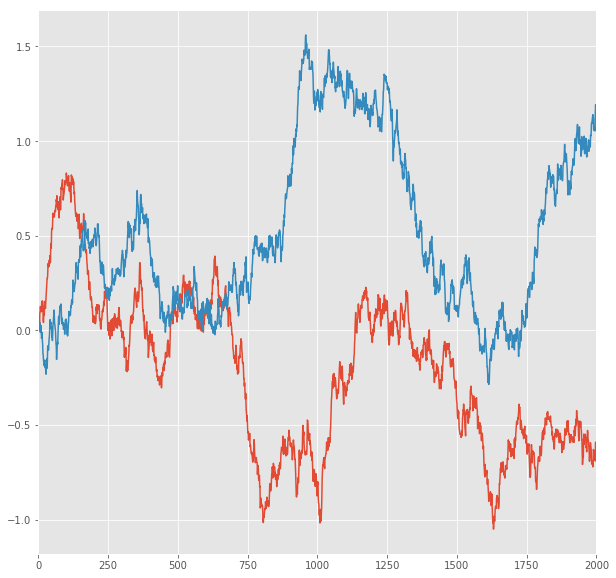

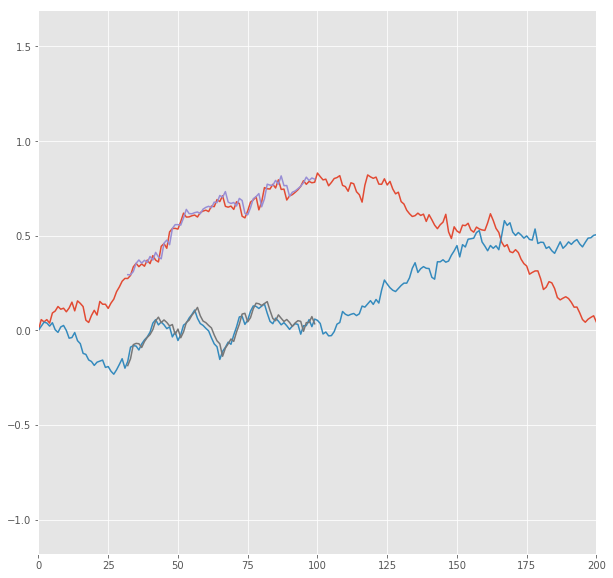

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.0439 RMSE
Predict Score for 1 -steps forecast: 0.0429 RMSE
Error Test Score for 1 -steps forecast: 0.1147 RMSE
RT Test Score for 1 -steps forecast: 0.0771 RMSE
Error Test Corr for 1 -steps forecast: 0.9821
RT Test Corr for 1 -steps forecast: 0.9645


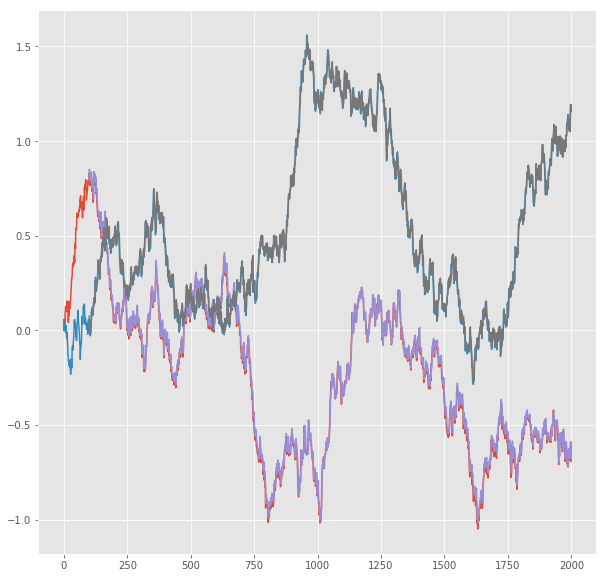

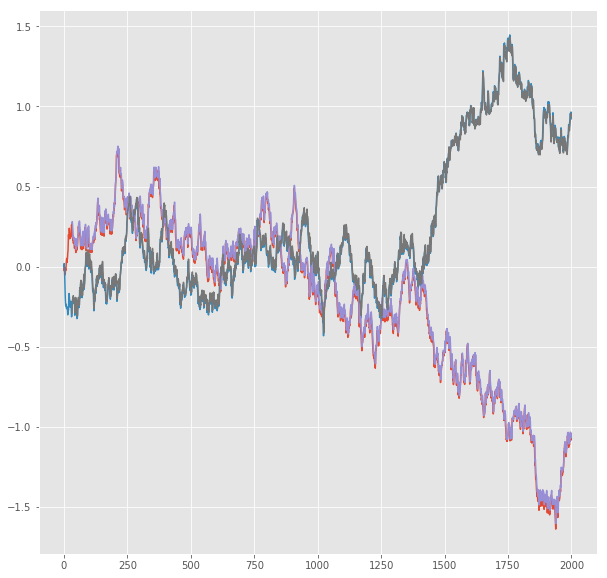

R^2 score for regression on Error: 0.9646
k = 0.9842


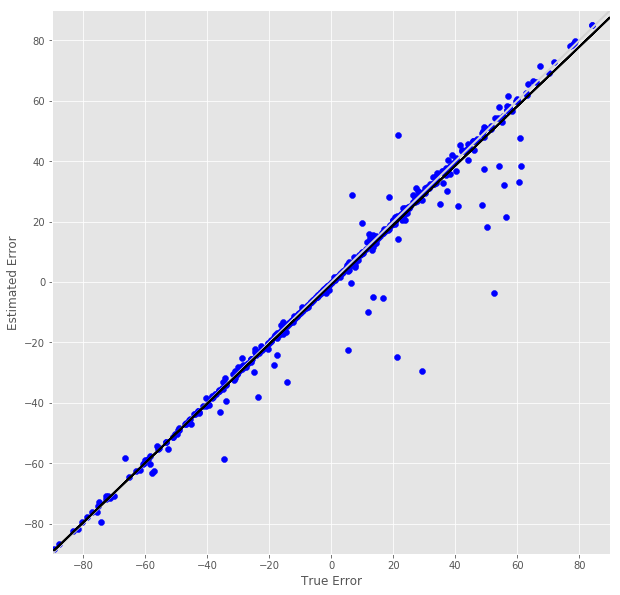

R^2 score for regression on RT: 0.9302
k = 0.9819


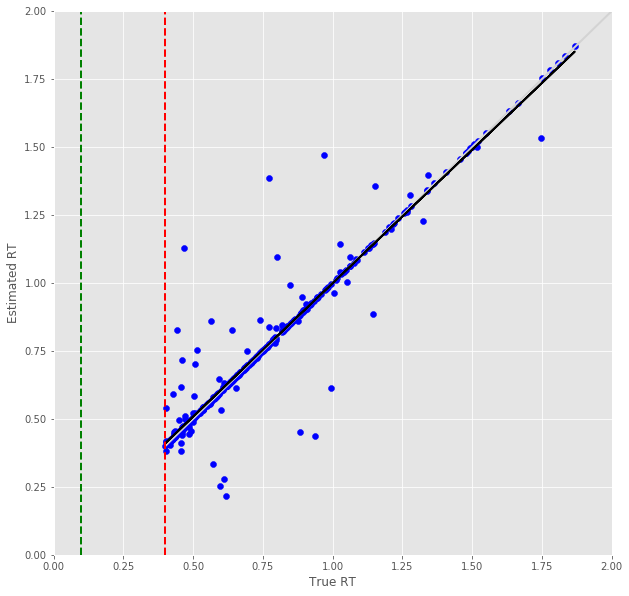

Error Prediction Score: 0.0458 RMSE
RT Prediction Score: 0.0237 RMSE
Error Prediction Corr: 0.9975
RT Prediction Corr: 0.9975
R^2 score for regression on Error: 0.9951
k = 1.0048


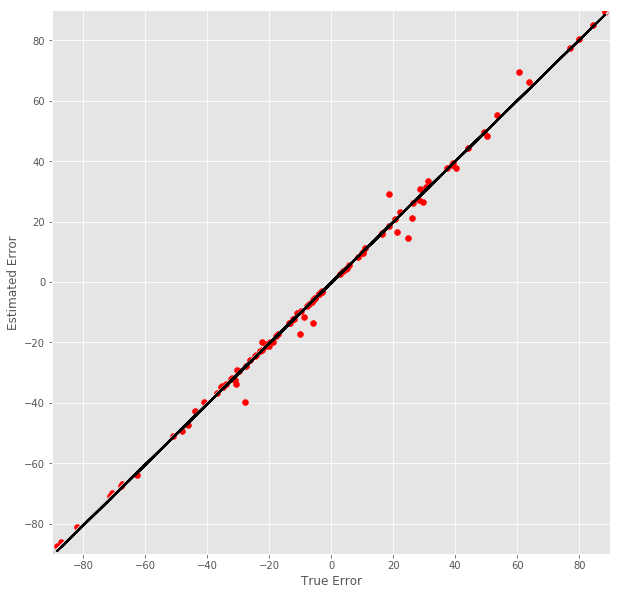

R^2 score for regression on RT: 0.9949
k = 1.0023


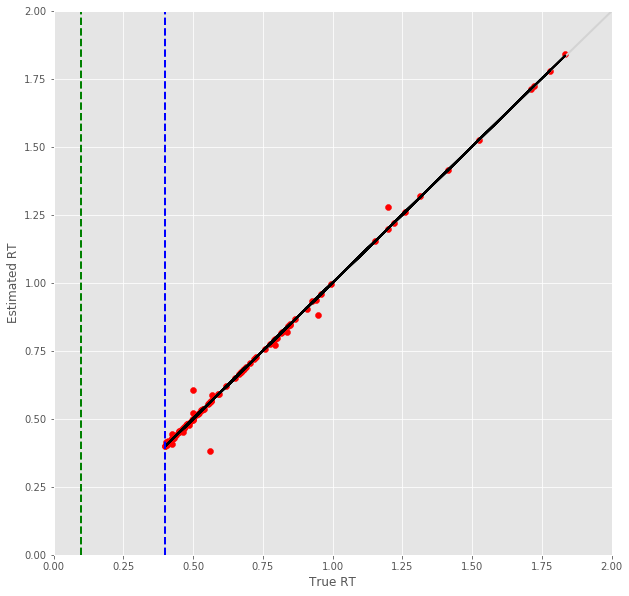

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.0732 RMSE
Predict Score for 2 -steps forecast: 0.0714 RMSE
Error Test Score for 2 -steps forecast: 0.1781 RMSE
RT Test Score for 2 -steps forecast: 0.1264 RMSE
Error Test Corr for 2 -steps forecast: 0.9579
RT Test Corr for 2 -steps forecast: 0.9036


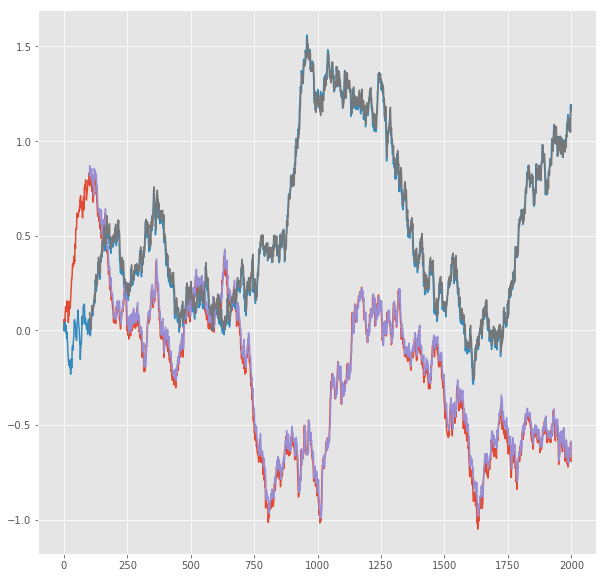

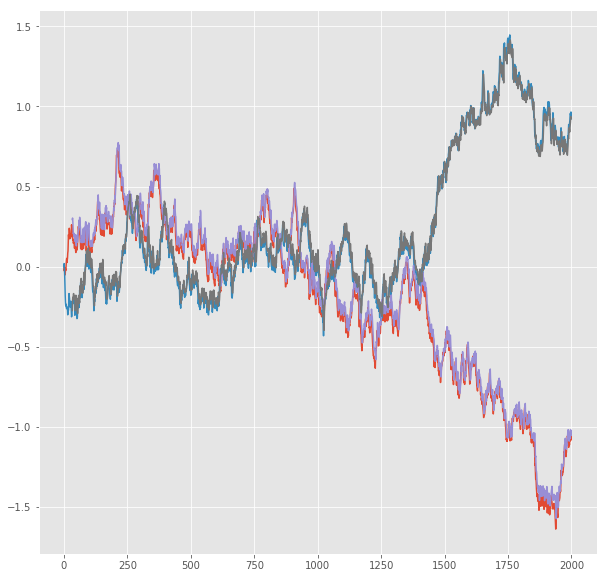

R^2 score for regression on Error: 0.9176
k = 0.9779


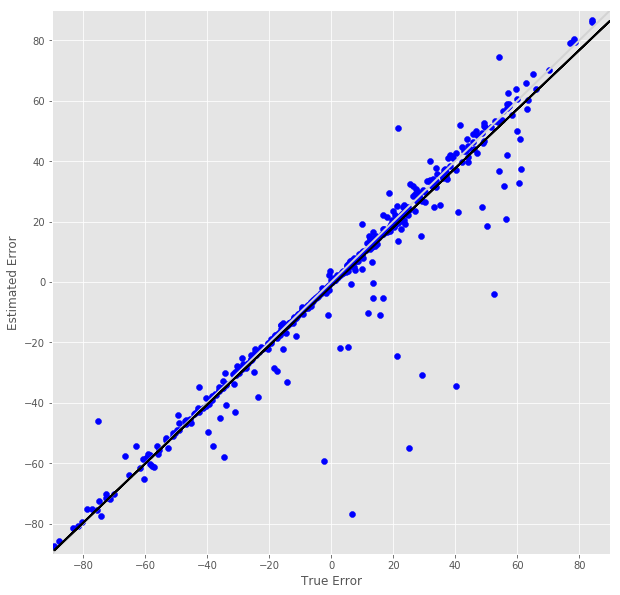

R^2 score for regression on RT: 0.8165
k = 0.9182


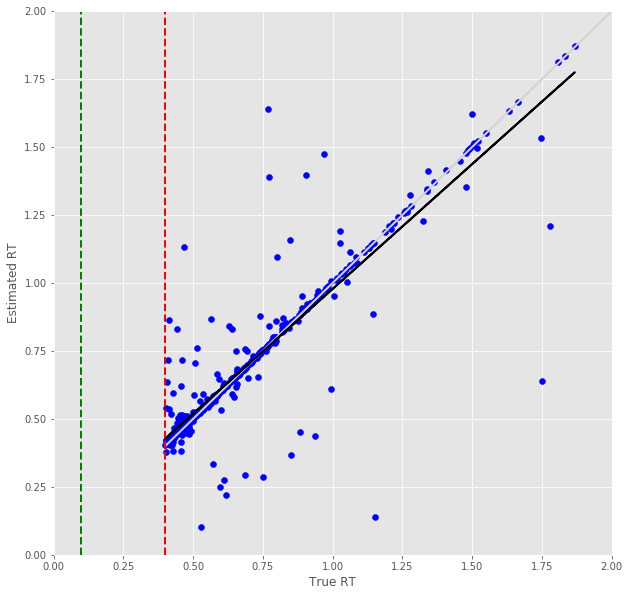

Error Prediction Score: 0.1400 RMSE
RT Prediction Score: 0.0549 RMSE
Error Prediction Corr: 0.9769
RT Prediction Corr: 0.9866
R^2 score for regression on Error: 0.9543
k = 0.9420


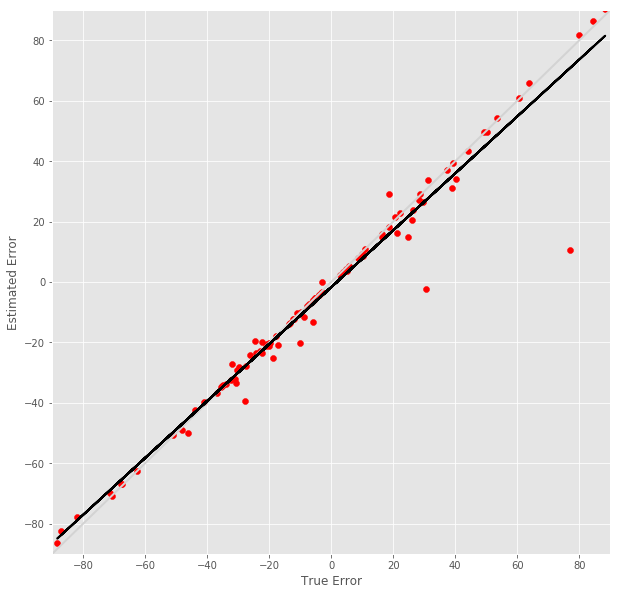

R^2 score for regression on RT: 0.9733
k = 0.9893


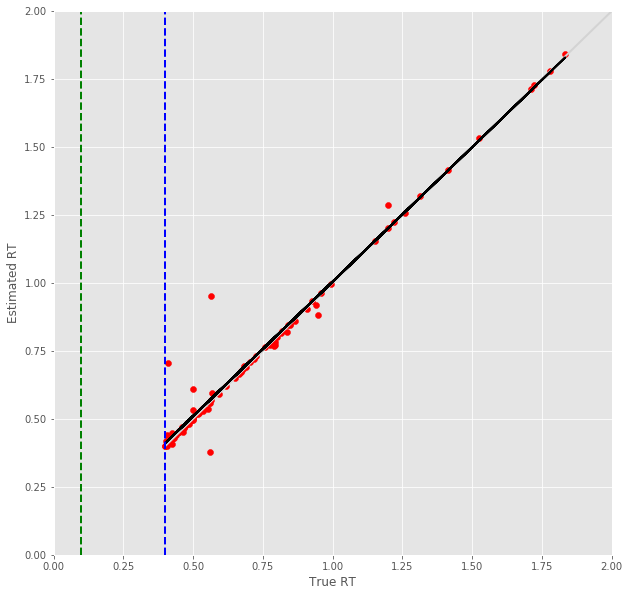

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.1004 RMSE
Predict Score for 3 -steps forecast: 0.0979 RMSE
Error Test Score for 3 -steps forecast: 0.2078 RMSE
RT Test Score for 3 -steps forecast: 0.1328 RMSE
Error Test Corr for 3 -steps forecast: 0.9433
RT Test Corr for 3 -steps forecast: 0.8928


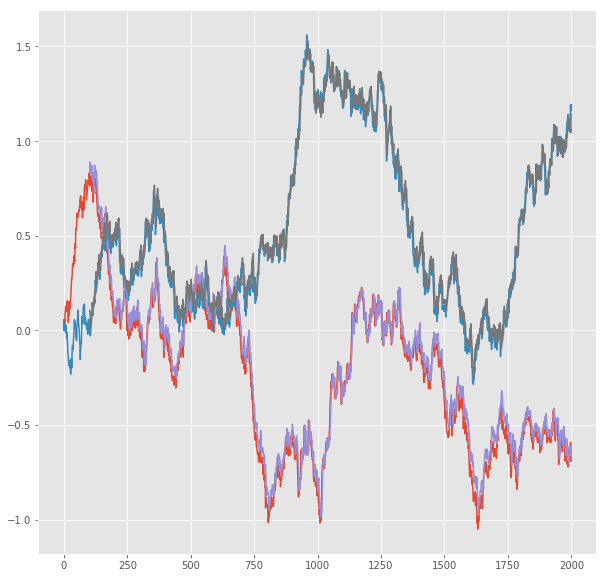

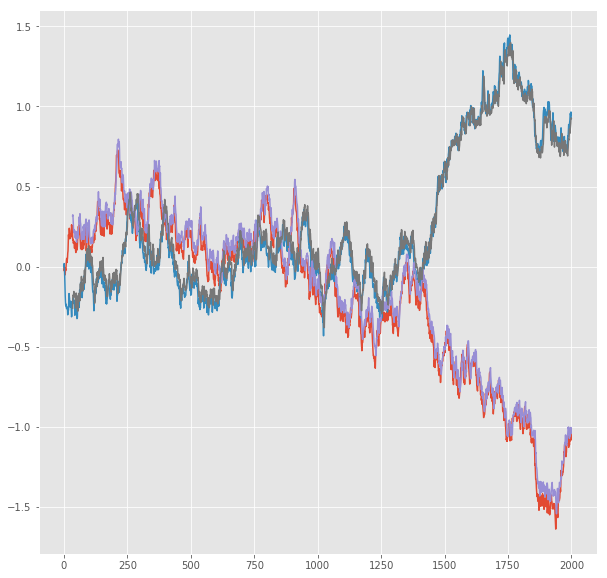

R^2 score for regression on Error: 0.8897
k = 0.9655


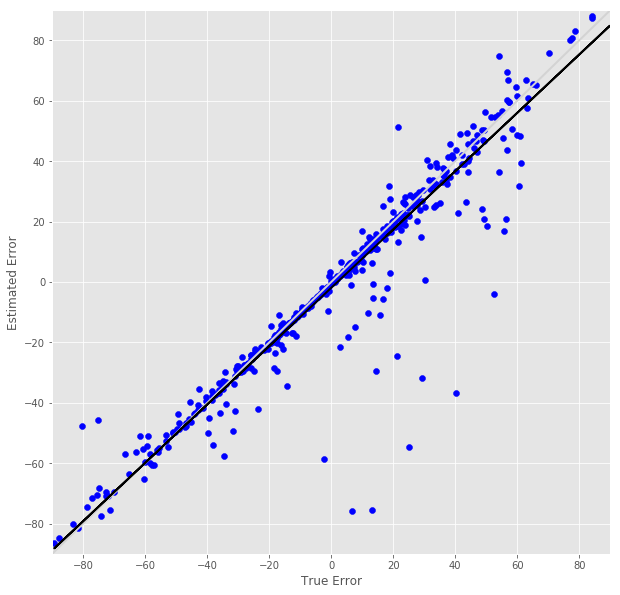

R^2 score for regression on RT: 0.7971
k = 0.9010


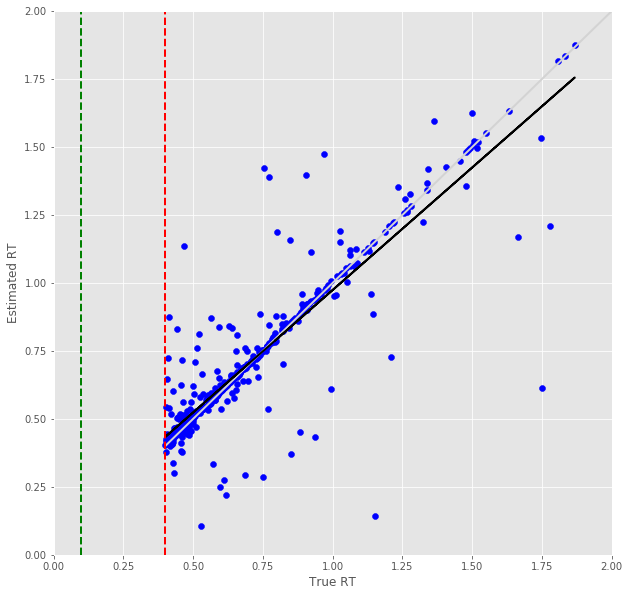

Error Prediction Score: 0.1526 RMSE
RT Prediction Score: 0.0592 RMSE
Error Prediction Corr: 0.9728
RT Prediction Corr: 0.9846
R^2 score for regression on Error: 0.9463
k = 0.9334


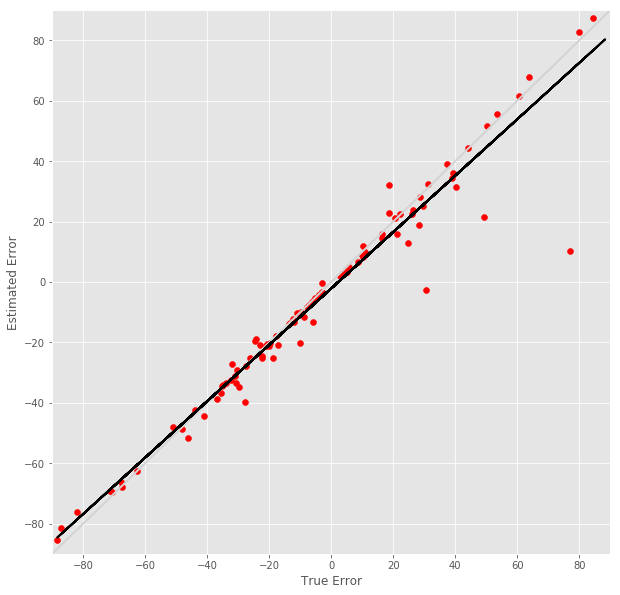

R^2 score for regression on RT: 0.9694
k = 0.9917


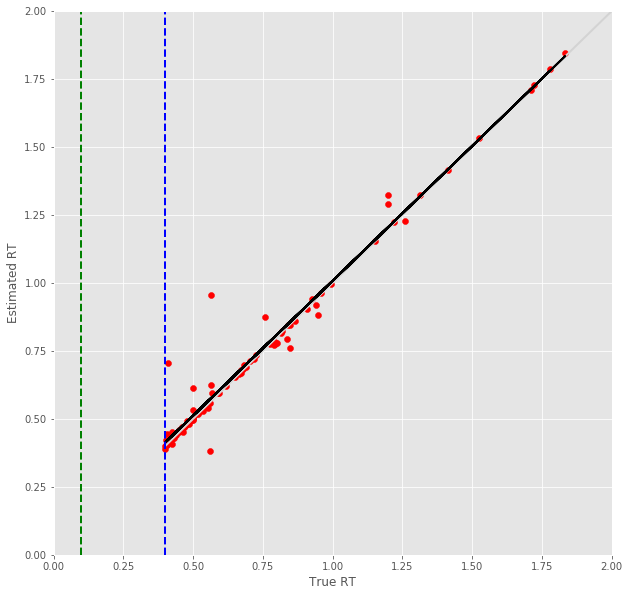

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.1260 RMSE
Predict Score for 4 -steps forecast: 0.1228 RMSE
Error Test Score for 4 -steps forecast: 0.2600 RMSE
RT Test Score for 4 -steps forecast: 0.1746 RMSE
Error Test Corr for 4 -steps forecast: 0.9154
RT Test Corr for 4 -steps forecast: 0.8156


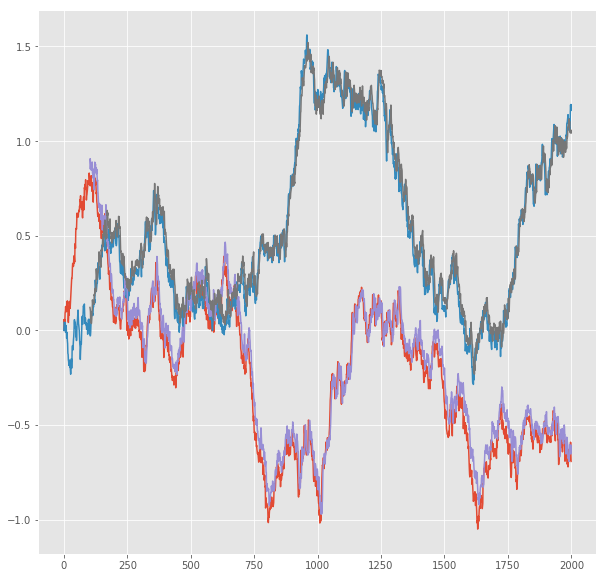

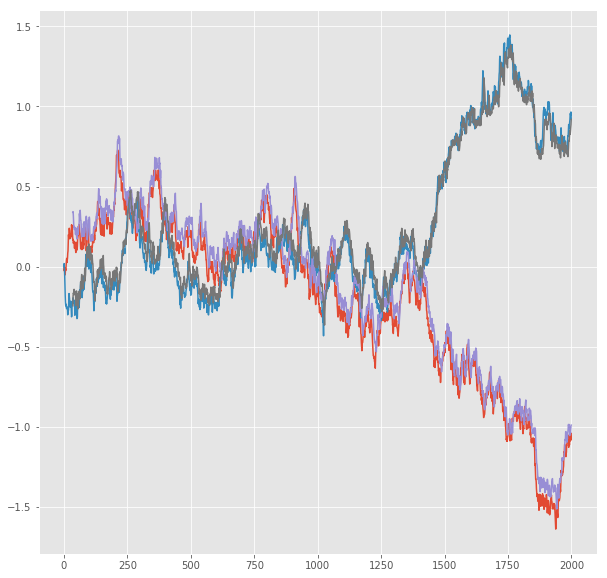

R^2 score for regression on Error: 0.8380
k = 0.9631


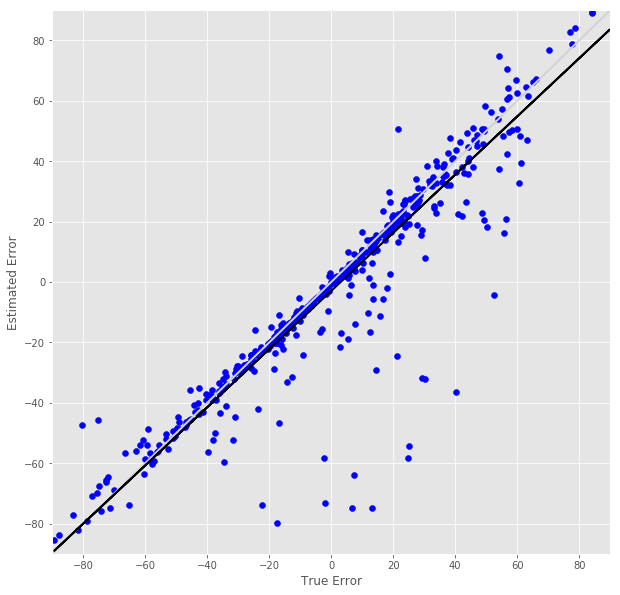

R^2 score for regression on RT: 0.6652
k = 0.8381


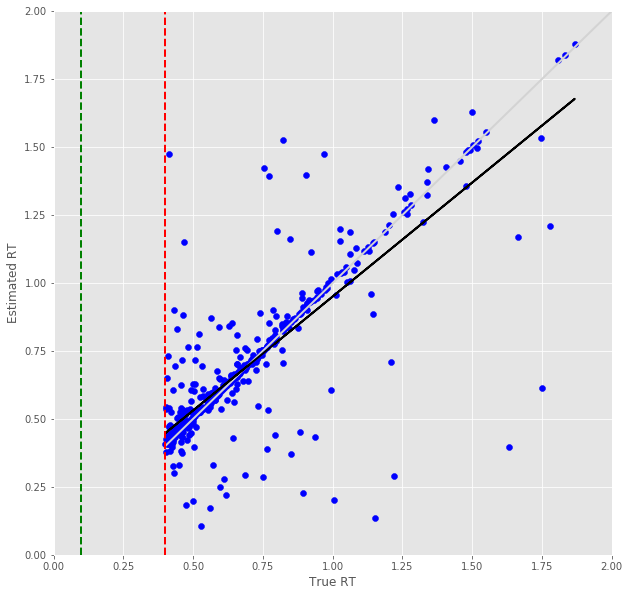

Error Prediction Score: 0.1865 RMSE
RT Prediction Score: 0.0839 RMSE
Error Prediction Corr: 0.9596
RT Prediction Corr: 0.9651
R^2 score for regression on Error: 0.9208
k = 0.9460


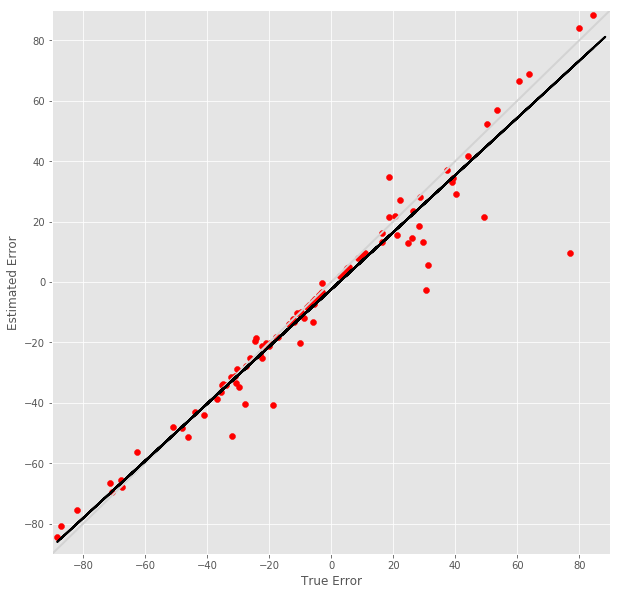

R^2 score for regression on RT: 0.9313
k = 0.9791


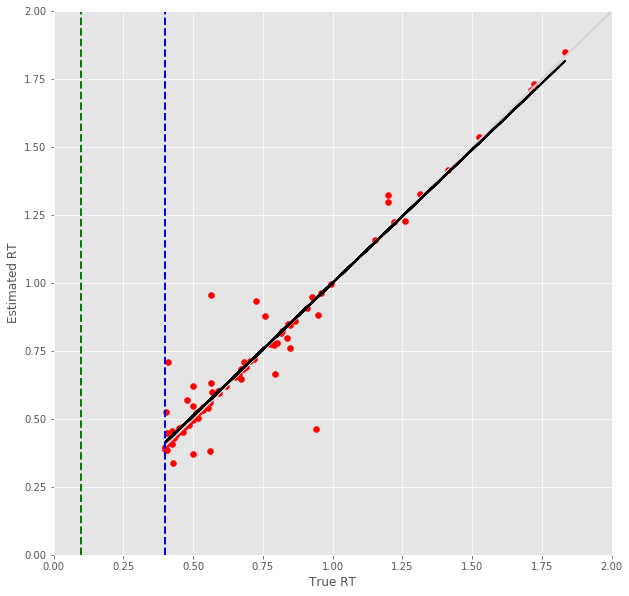

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.1502 RMSE
Predict Score for 5 -steps forecast: 0.1466 RMSE
Error Test Score for 5 -steps forecast: 0.2868 RMSE
RT Test Score for 5 -steps forecast: 0.2006 RMSE
Error Test Corr for 5 -steps forecast: 0.8980
RT Test Corr for 5 -steps forecast: 0.7637


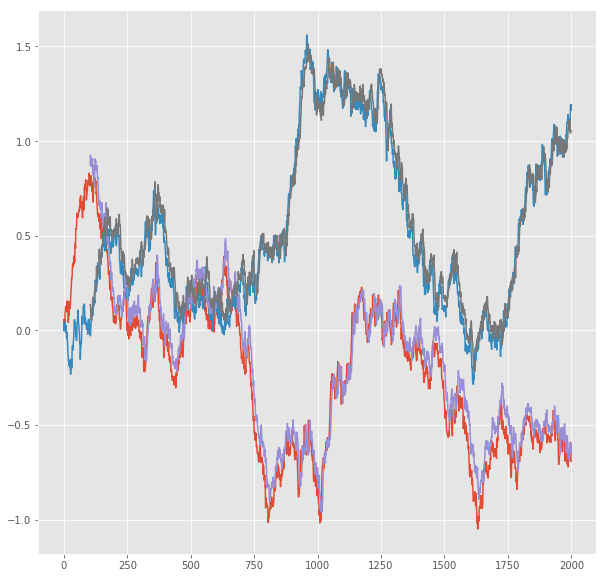

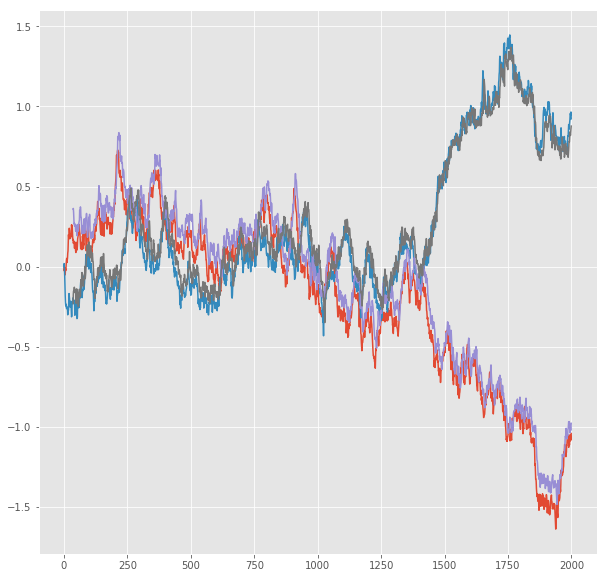

R^2 score for regression on Error: 0.8064
k = 0.9553


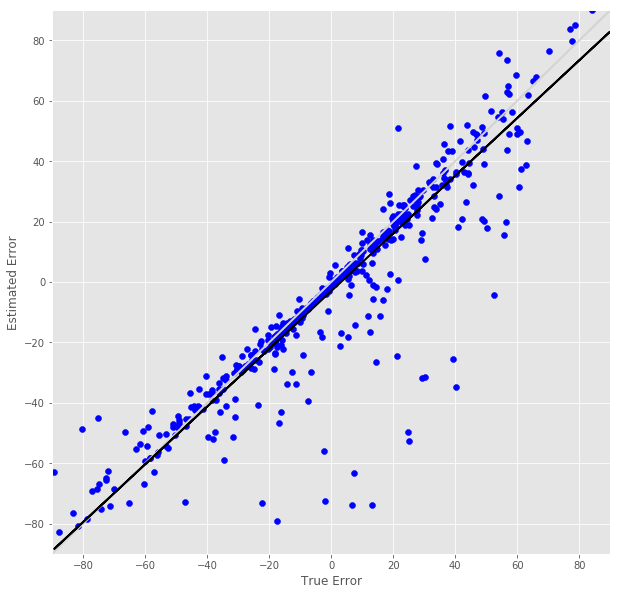

R^2 score for regression on RT: 0.5833
k = 0.8059


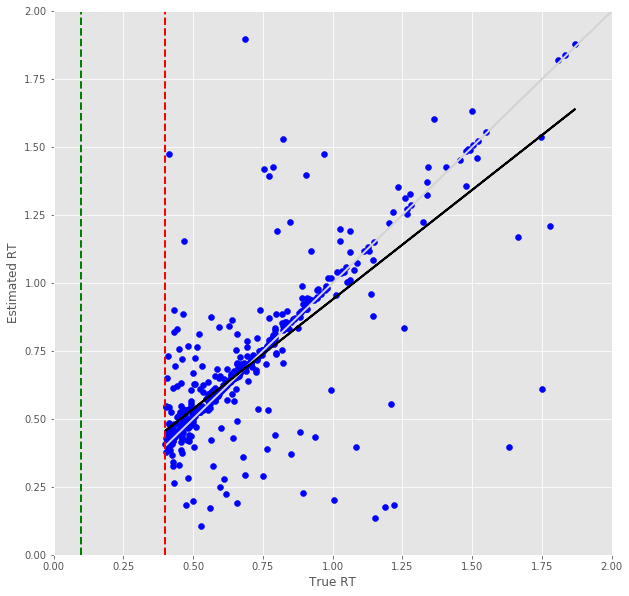

Error Prediction Score: 0.2340 RMSE
RT Prediction Score: 0.1341 RMSE
Error Prediction Corr: 0.9372
RT Prediction Corr: 0.9150
R^2 score for regression on Error: 0.8784
k = 0.9389


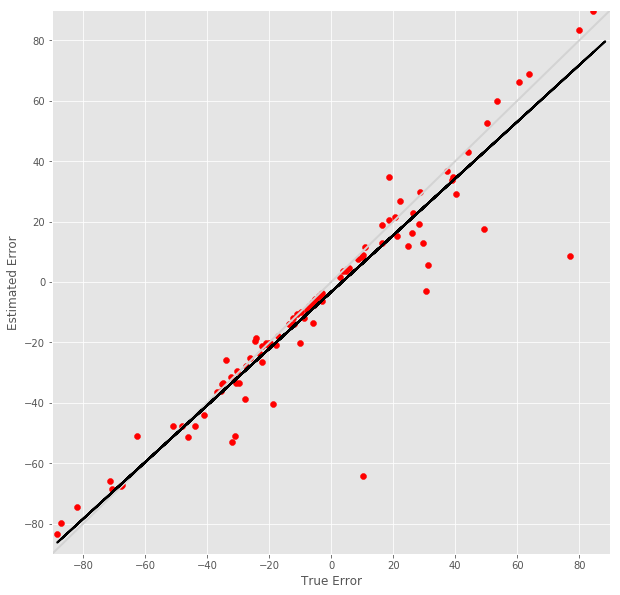

R^2 score for regression on RT: 0.8373
k = 0.8760


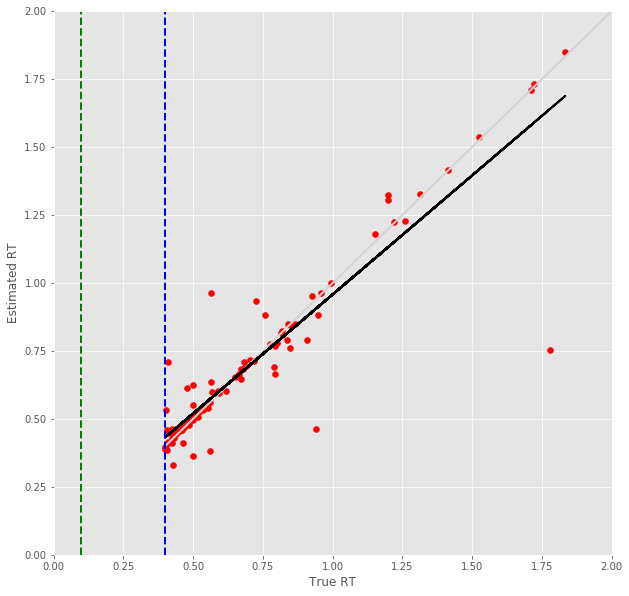

6 -step(s) forecast:
Test Score for 6 -steps forecast: 0.1733 RMSE
Predict Score for 6 -steps forecast: 0.1693 RMSE
Error Test Score for 6 -steps forecast: 0.3200 RMSE
RT Test Score for 6 -steps forecast: 0.2369 RMSE
Error Test Corr for 6 -steps forecast: 0.8774
RT Test Corr for 6 -steps forecast: 0.6700


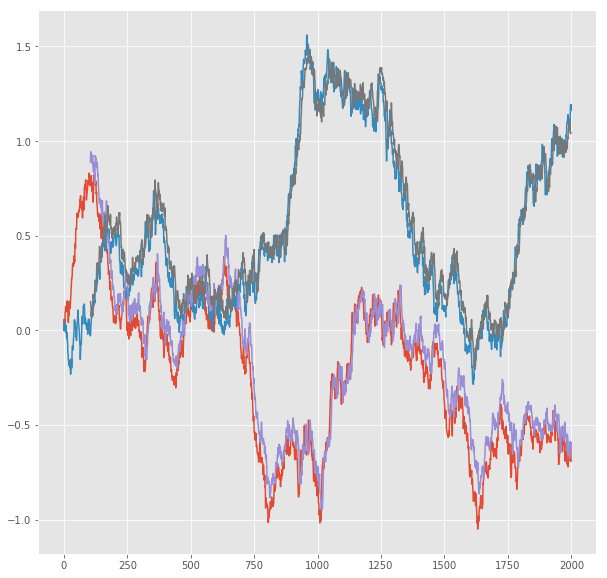

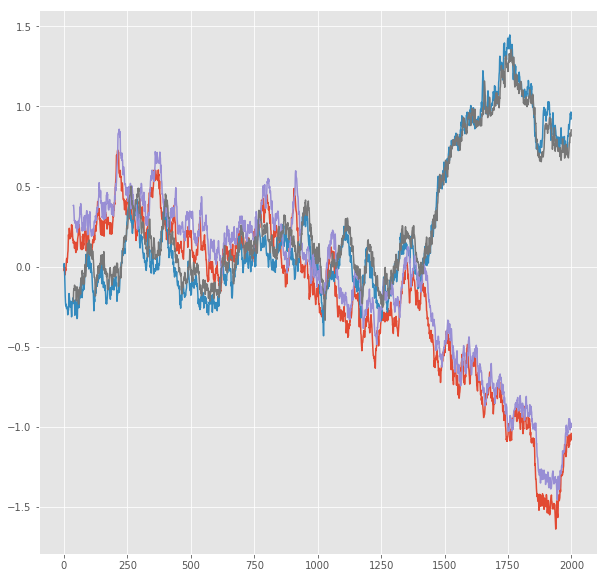

R^2 score for regression on Error: 0.7699
k = 0.9567


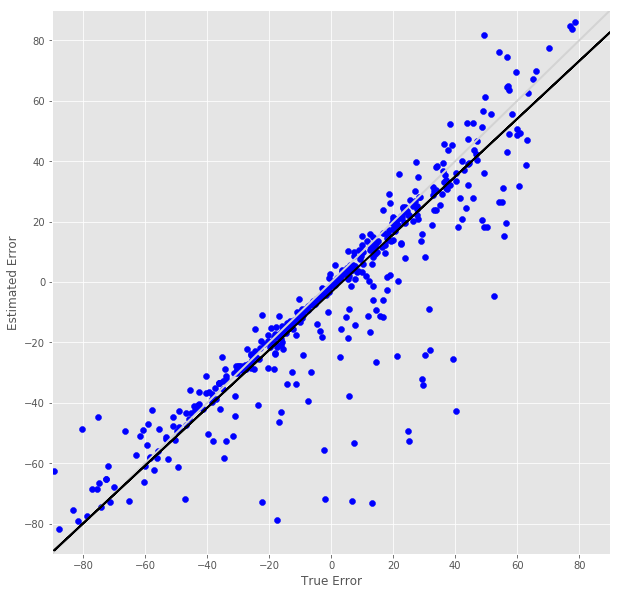

R^2 score for regression on RT: 0.4489
k = 0.7070


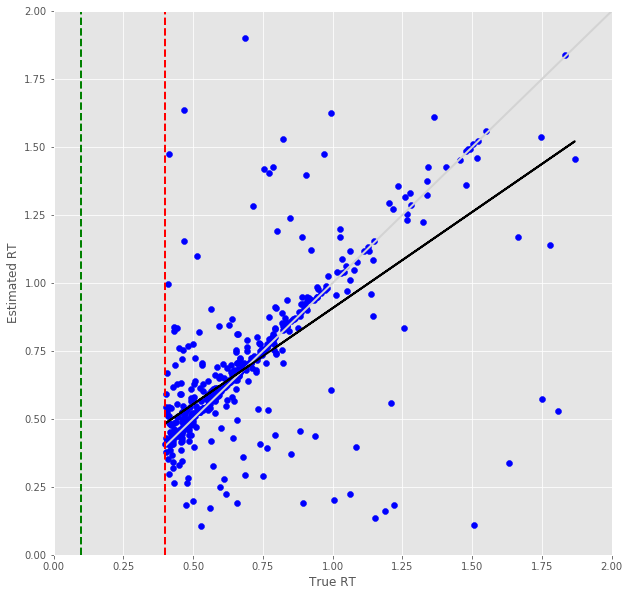

Error Prediction Score: 0.2461 RMSE
RT Prediction Score: 0.1411 RMSE
Error Prediction Corr: 0.9296
RT Prediction Corr: 0.9060
R^2 score for regression on Error: 0.8642
k = 0.9148


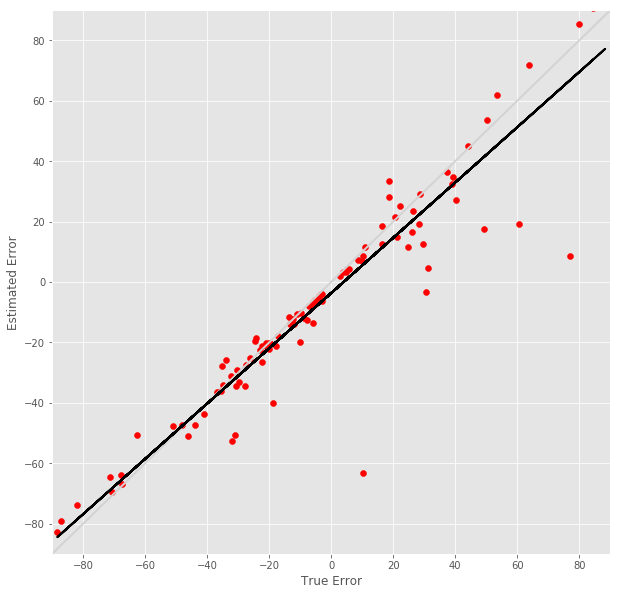

R^2 score for regression on RT: 0.8208
k = 0.8699


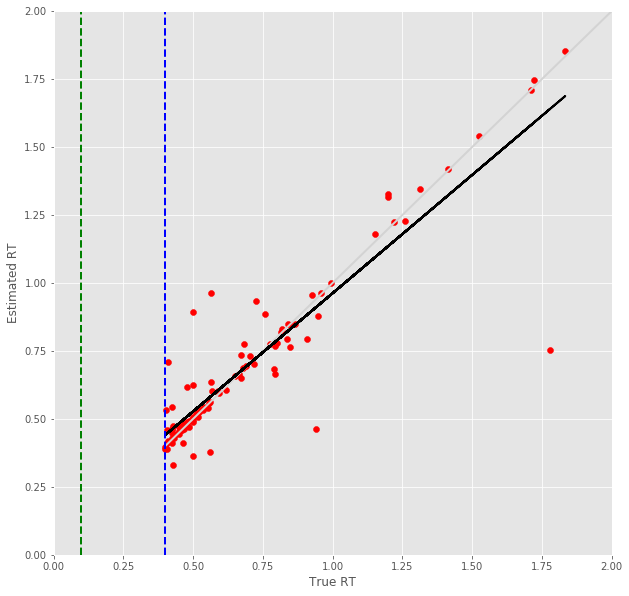

7 -step(s) forecast:
Test Score for 7 -steps forecast: 0.1955 RMSE
Predict Score for 7 -steps forecast: 0.1911 RMSE
Error Test Score for 7 -steps forecast: 0.3477 RMSE
RT Test Score for 7 -steps forecast: 0.2625 RMSE
Error Test Corr for 7 -steps forecast: 0.8566
RT Test Corr for 7 -steps forecast: 0.6015


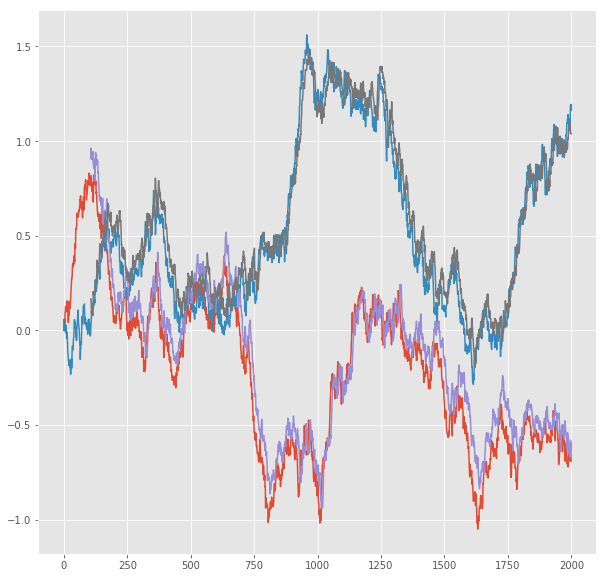

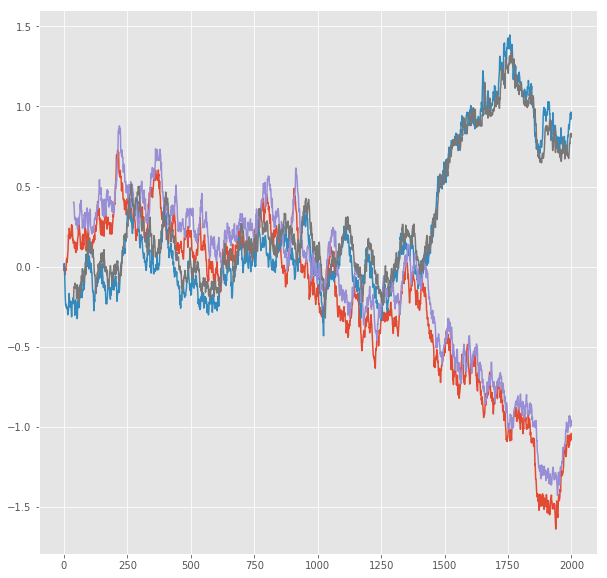

R^2 score for regression on Error: 0.7338
k = 0.9259


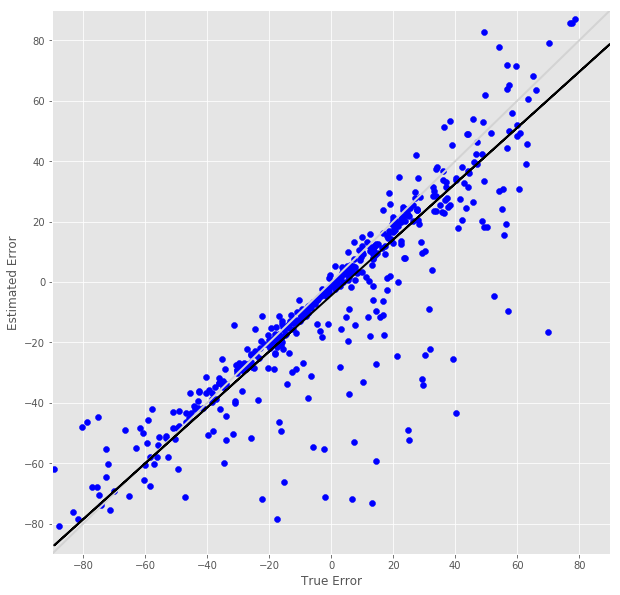

R^2 score for regression on RT: 0.3618
k = 0.6449


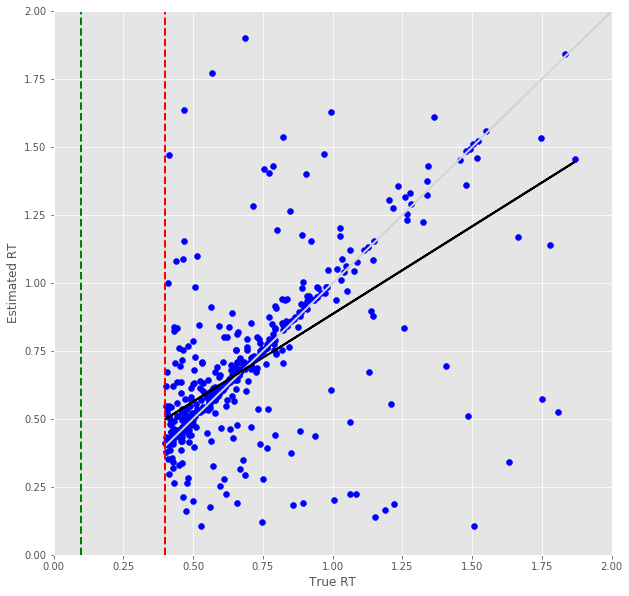

Error Prediction Score: 0.2613 RMSE
RT Prediction Score: 0.1465 RMSE
Error Prediction Corr: 0.9217
RT Prediction Corr: 0.8976
R^2 score for regression on Error: 0.8496
k = 0.9065


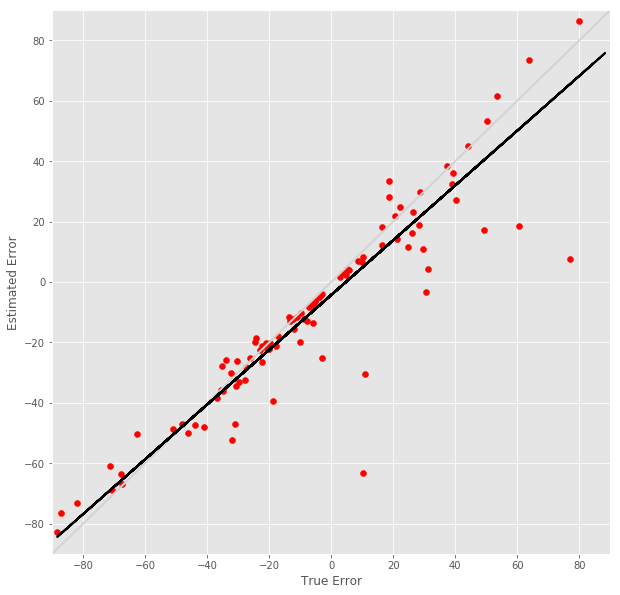

R^2 score for regression on RT: 0.8058
k = 0.8480


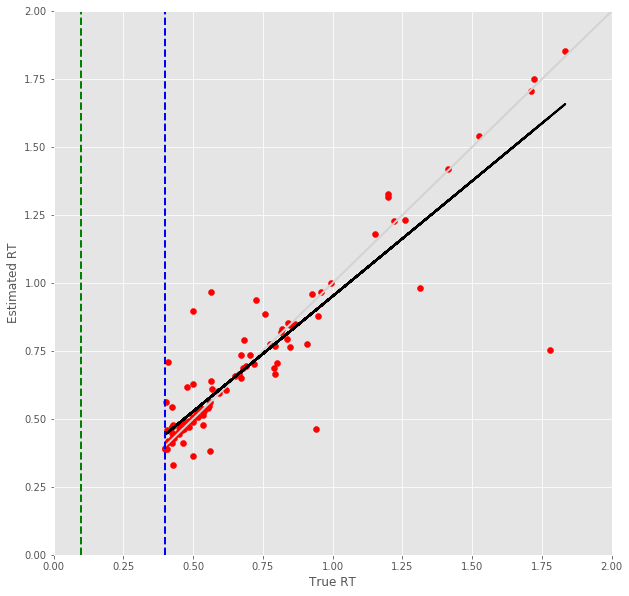

8 -step(s) forecast:
Test Score for 8 -steps forecast: 0.2169 RMSE
Predict Score for 8 -steps forecast: 0.2123 RMSE
Error Test Score for 8 -steps forecast: 0.3643 RMSE
RT Test Score for 8 -steps forecast: 0.2755 RMSE
Error Test Corr for 8 -steps forecast: 0.8459
RT Test Corr for 8 -steps forecast: 0.5682


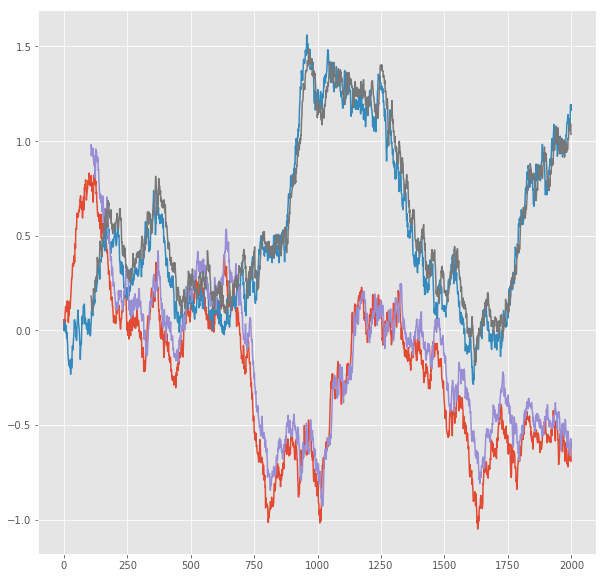

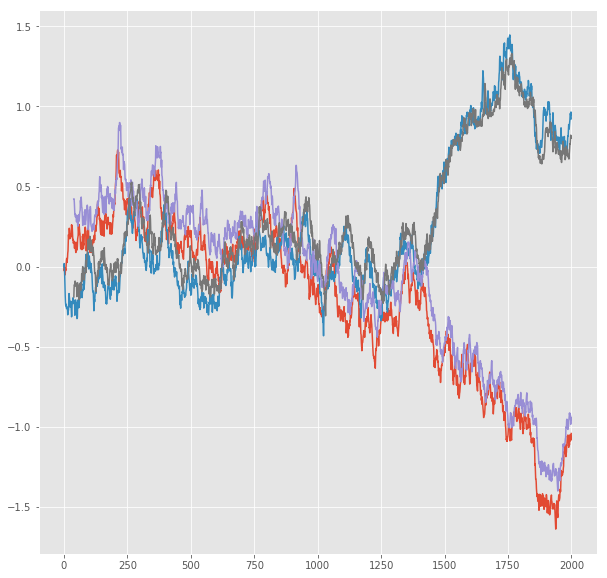

R^2 score for regression on Error: 0.7155
k = 0.9270


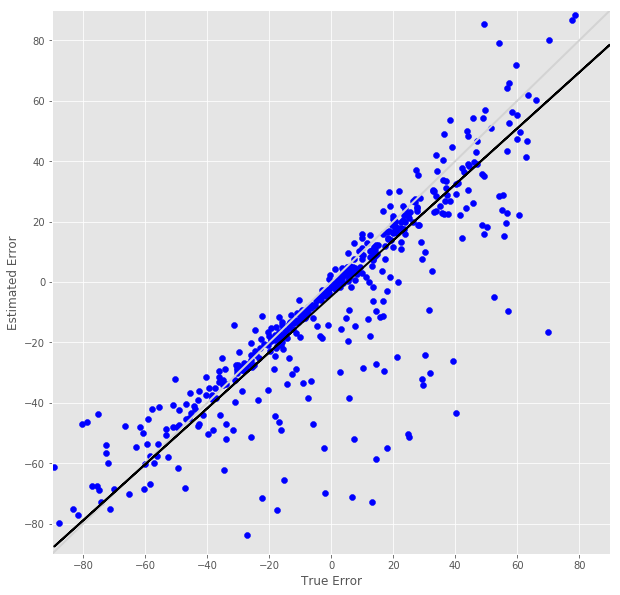

R^2 score for regression on RT: 0.3228
k = 0.6177


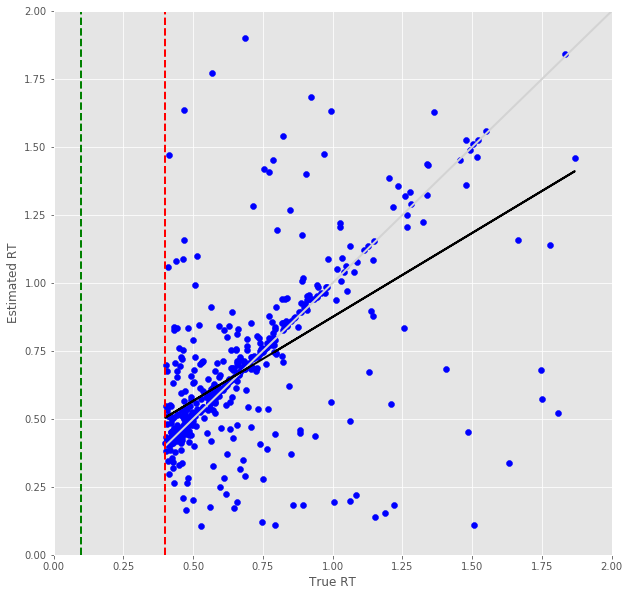

Error Prediction Score: 0.3043 RMSE
RT Prediction Score: 0.1973 RMSE
Error Prediction Corr: 0.9003
RT Prediction Corr: 0.8054
R^2 score for regression on Error: 0.8106
k = 0.9142


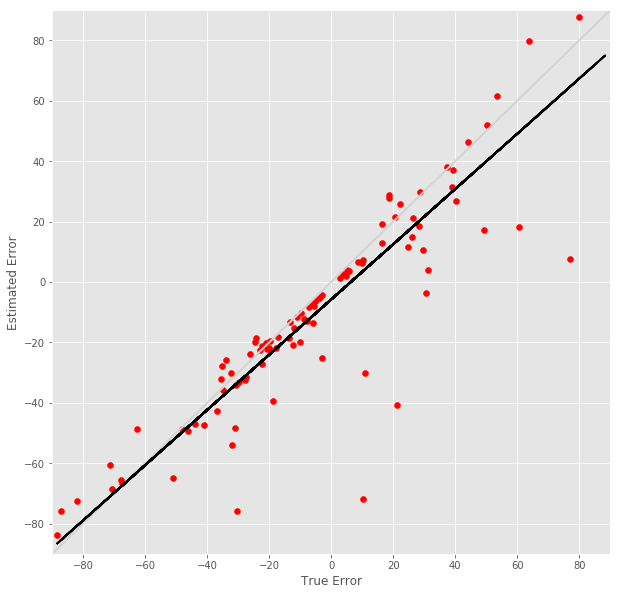

R^2 score for regression on RT: 0.6486
k = 0.6609


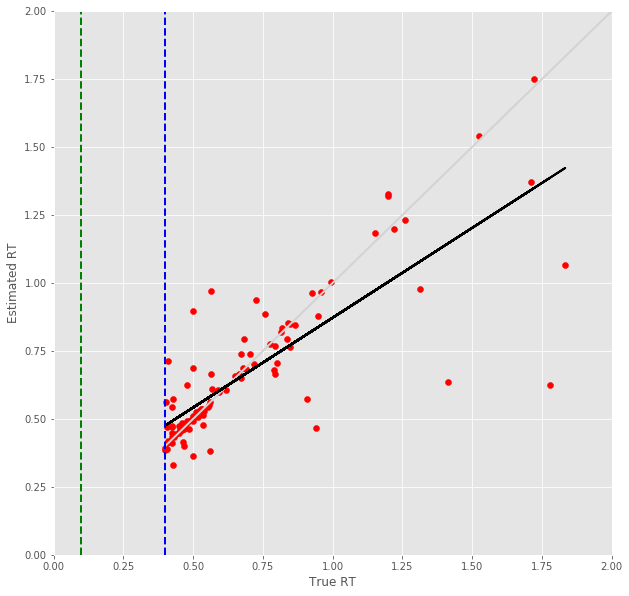

9 -step(s) forecast:
Test Score for 9 -steps forecast: 0.2377 RMSE
Predict Score for 9 -steps forecast: 0.2328 RMSE
Error Test Score for 9 -steps forecast: 0.3870 RMSE
RT Test Score for 9 -steps forecast: 0.2909 RMSE
Error Test Corr for 9 -steps forecast: 0.8341
RT Test Corr for 9 -steps forecast: 0.5315


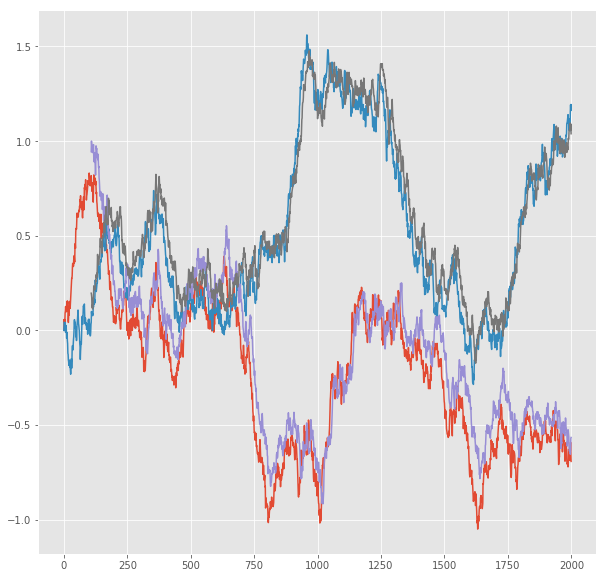

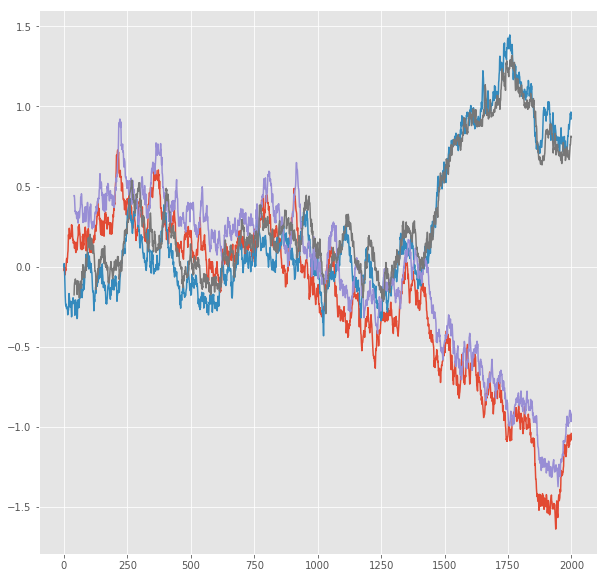

R^2 score for regression on Error: 0.6957
k = 0.9389


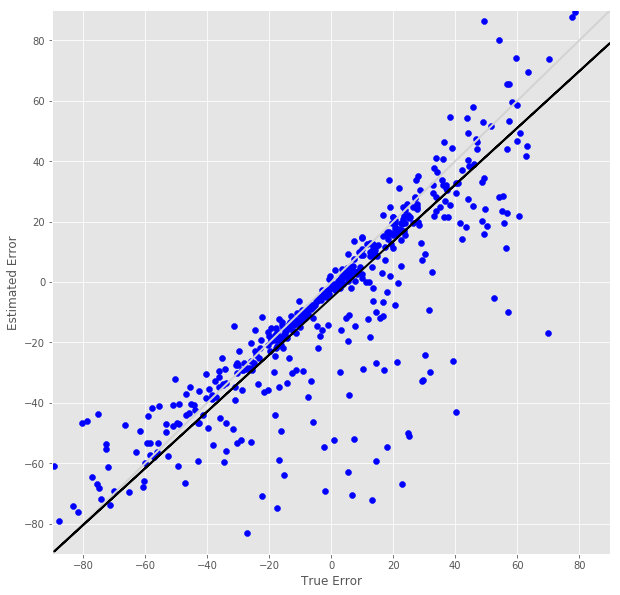

R^2 score for regression on RT: 0.2825
k = 0.5914


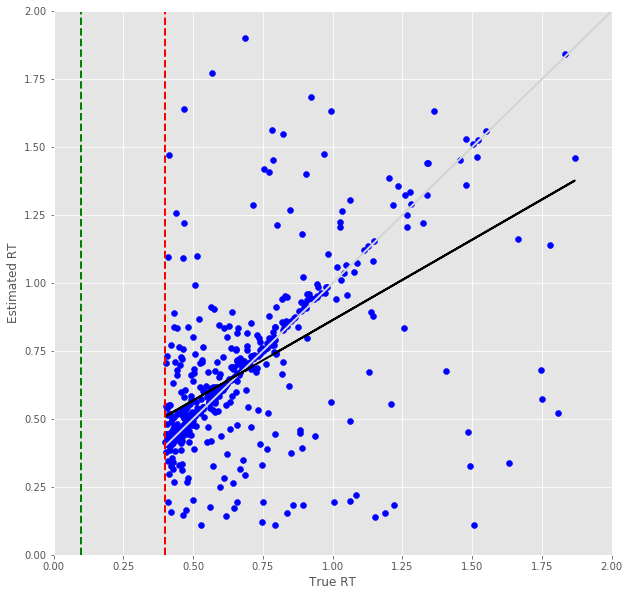

Error Prediction Score: 0.3476 RMSE
RT Prediction Score: 0.2447 RMSE
Error Prediction Corr: 0.8775
RT Prediction Corr: 0.6989
R^2 score for regression on Error: 0.7699
k = 0.9285


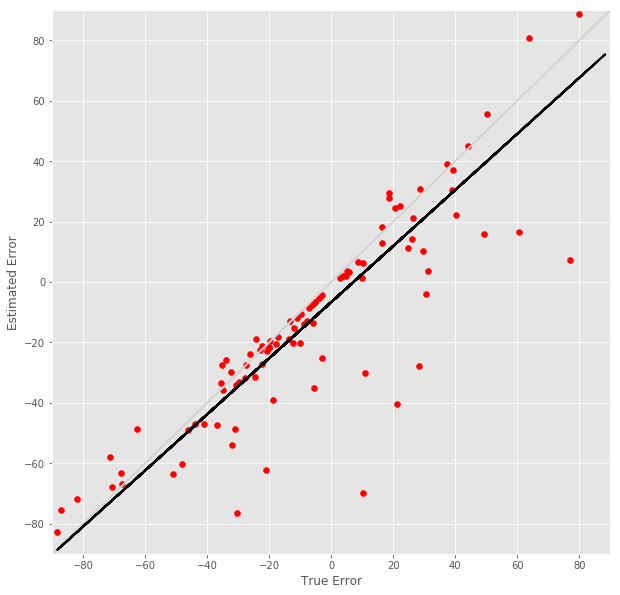

R^2 score for regression on RT: 0.4884
k = 0.5707


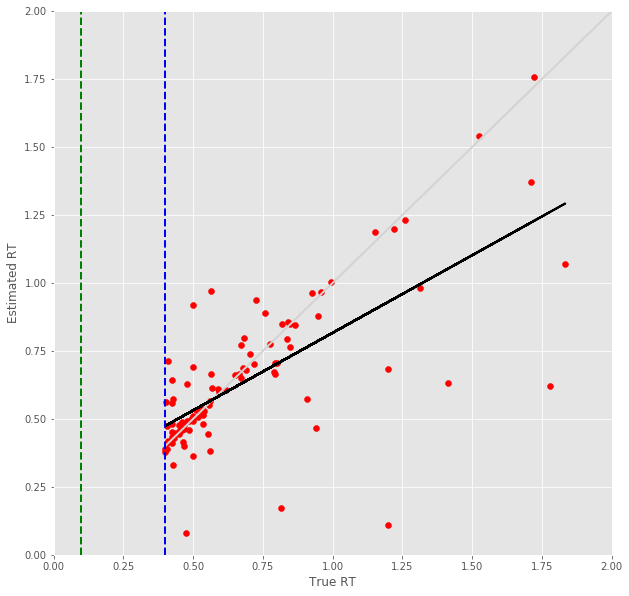

10 -step(s) forecast:
Test Score for 10 -steps forecast: 0.2577 RMSE
Predict Score for 10 -steps forecast: 0.2528 RMSE
Error Test Score for 10 -steps forecast: 0.4159 RMSE
RT Test Score for 10 -steps forecast: 0.3139 RMSE
Error Test Corr for 10 -steps forecast: 0.8136
RT Test Corr for 10 -steps forecast: 0.4549


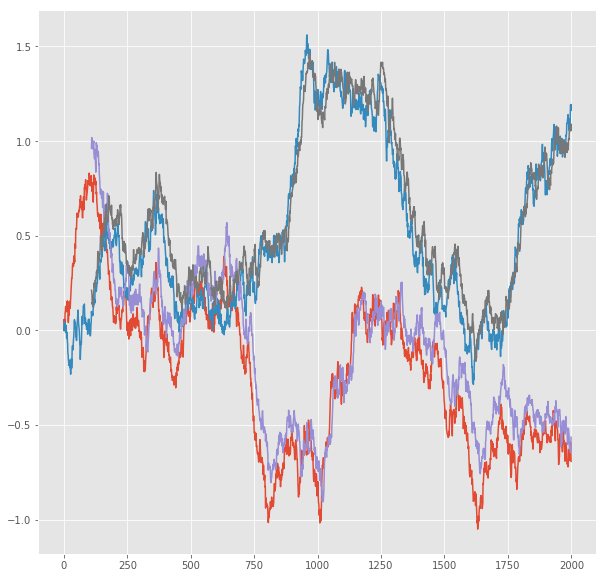

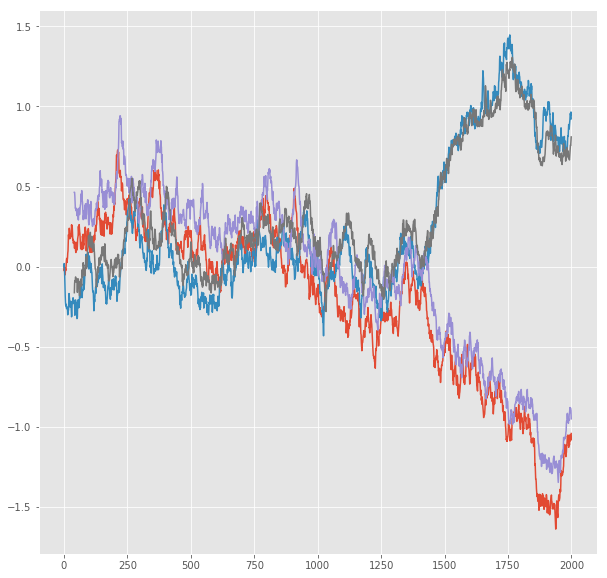

R^2 score for regression on Error: 0.6619
k = 0.9239


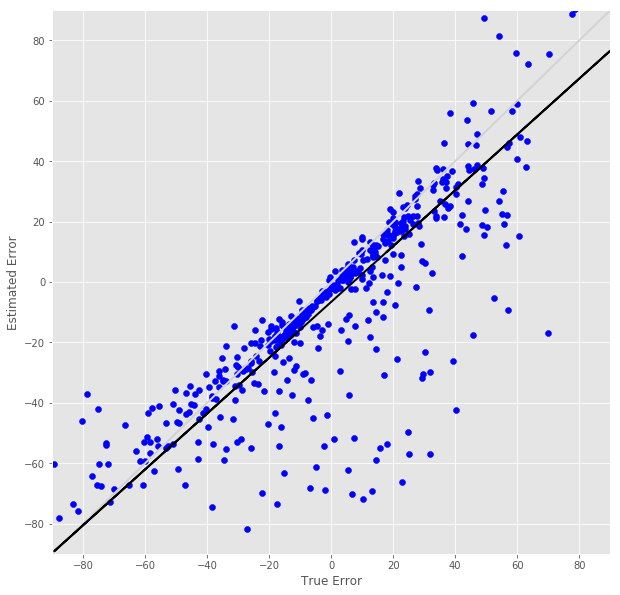

R^2 score for regression on RT: 0.2070
k = 0.5054


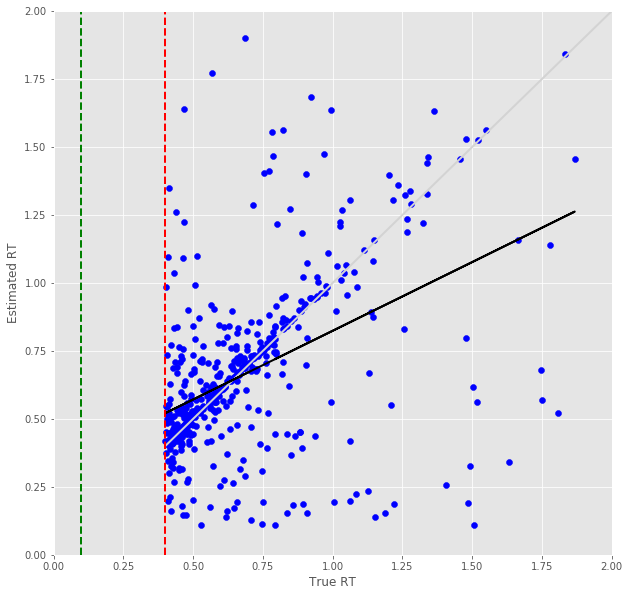

Error Prediction Score: 0.3519 RMSE
RT Prediction Score: 0.2693 RMSE
Error Prediction Corr: 0.8754
RT Prediction Corr: 0.6375
R^2 score for regression on Error: 0.7663
k = 0.9300


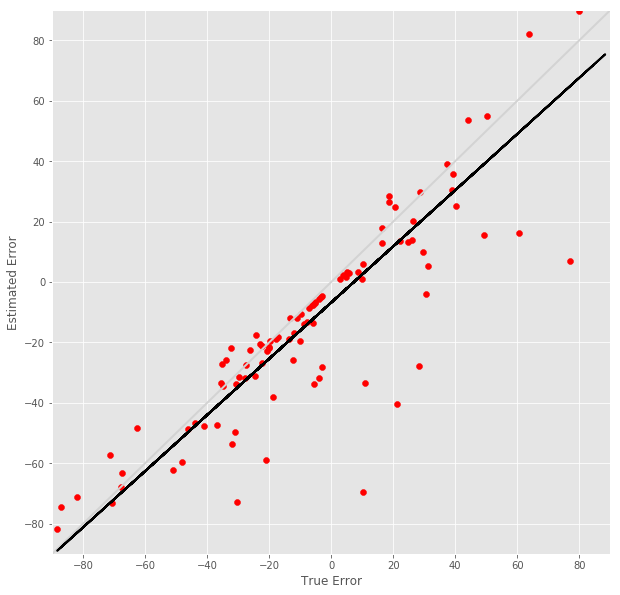

R^2 score for regression on RT: 0.4064
k = 0.5286


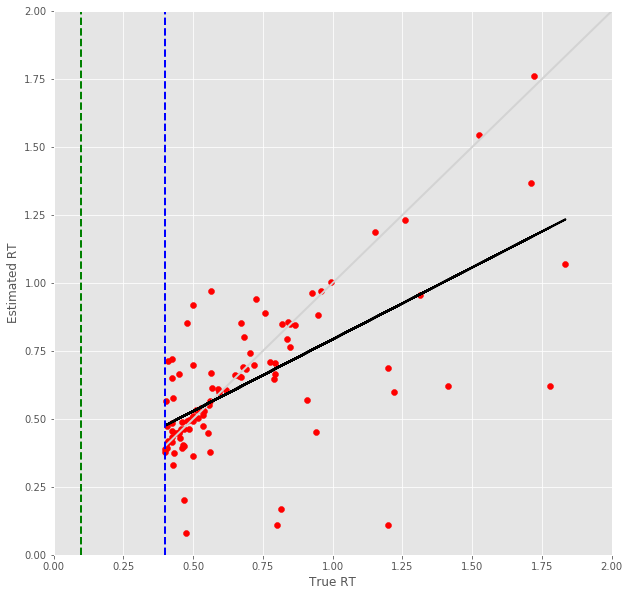

11 -step(s) forecast:
Test Score for 11 -steps forecast: 0.2773 RMSE
Predict Score for 11 -steps forecast: 0.2723 RMSE
Error Test Score for 11 -steps forecast: 0.4251 RMSE
RT Test Score for 11 -steps forecast: 0.3169 RMSE
Error Test Corr for 11 -steps forecast: 0.8110
RT Test Corr for 11 -steps forecast: 0.4511


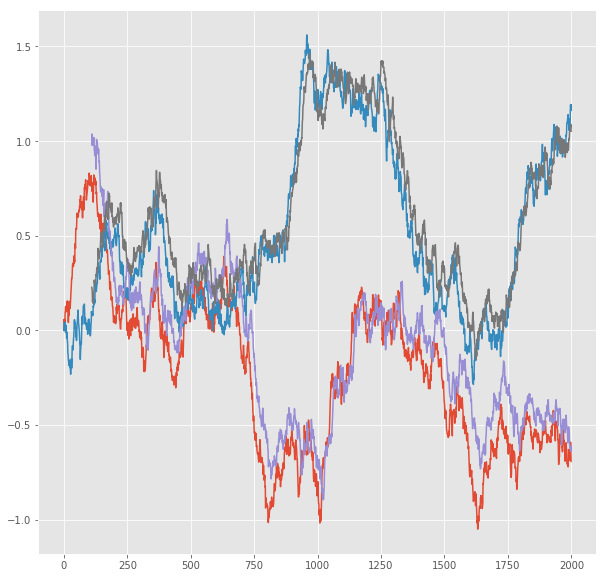

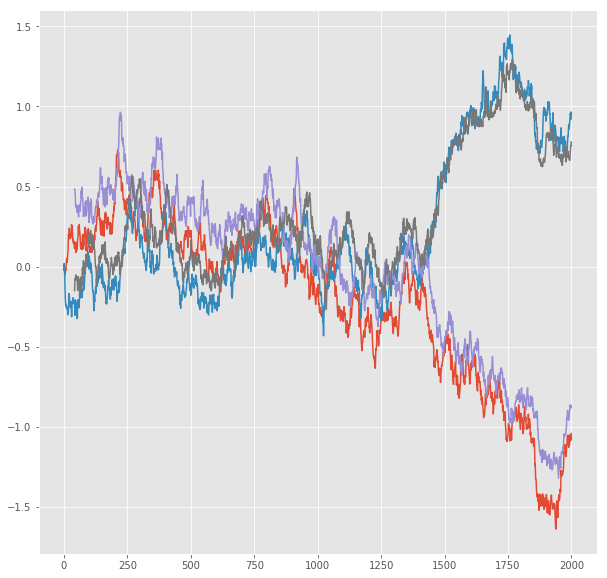

R^2 score for regression on Error: 0.6578
k = 0.9325


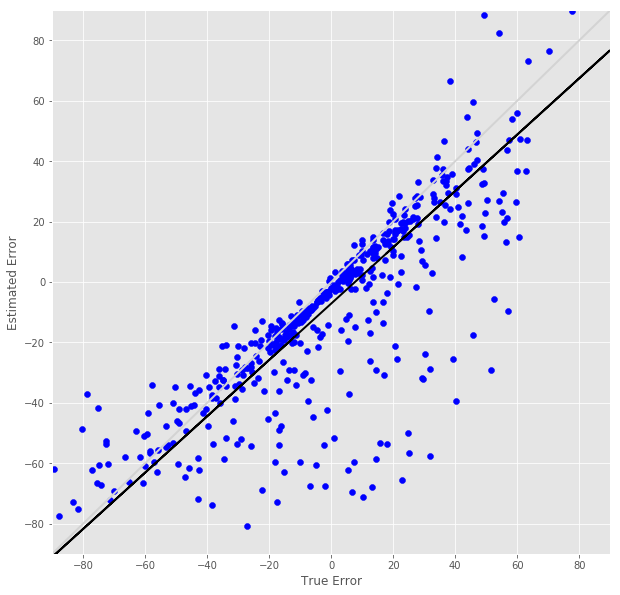

R^2 score for regression on RT: 0.2035
k = 0.5056


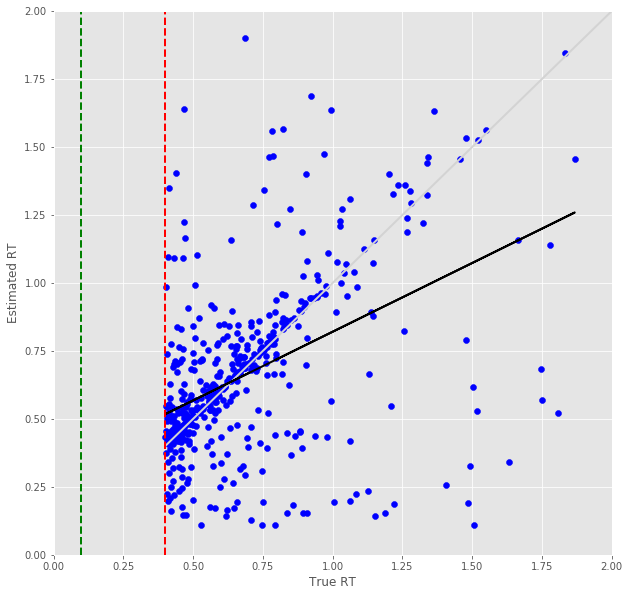

Error Prediction Score: 0.3555 RMSE
RT Prediction Score: 0.3001 RMSE
Error Prediction Corr: 0.8719
RT Prediction Corr: 0.5523
R^2 score for regression on Error: 0.7602
k = 0.9058


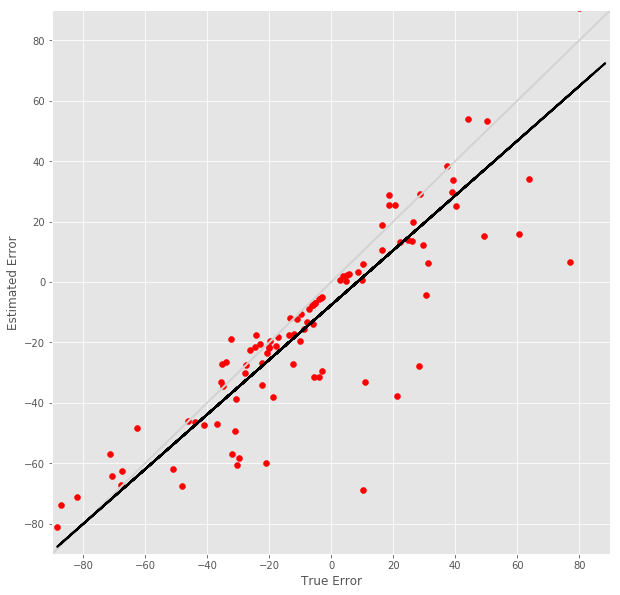

R^2 score for regression on RT: 0.3051
k = 0.4801


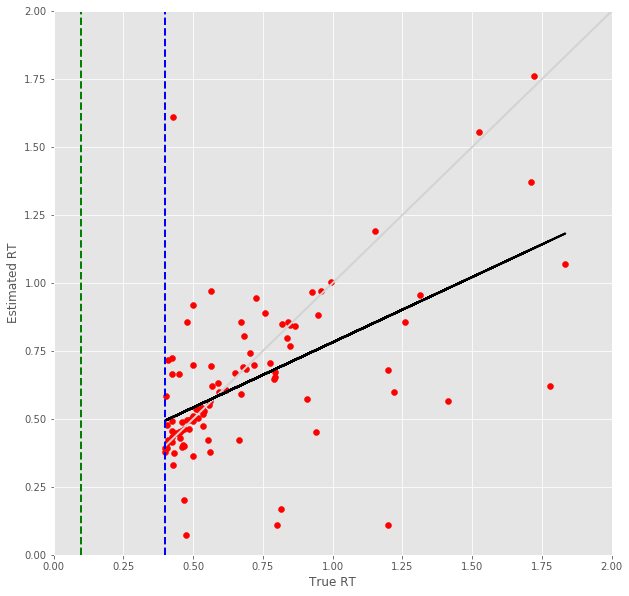

12 -step(s) forecast:
Test Score for 12 -steps forecast: 0.2963 RMSE
Predict Score for 12 -steps forecast: 0.2914 RMSE
Error Test Score for 12 -steps forecast: 0.4436 RMSE
RT Test Score for 12 -steps forecast: 0.3381 RMSE
Error Test Corr for 12 -steps forecast: 0.7966
RT Test Corr for 12 -steps forecast: 0.3952


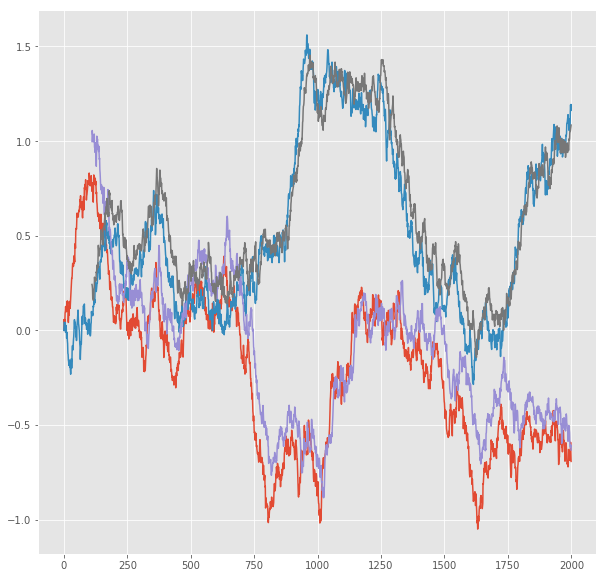

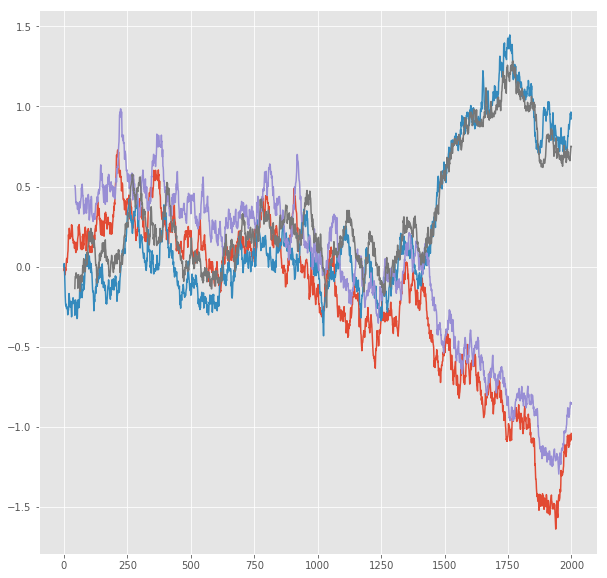

R^2 score for regression on Error: 0.6346
k = 0.9273


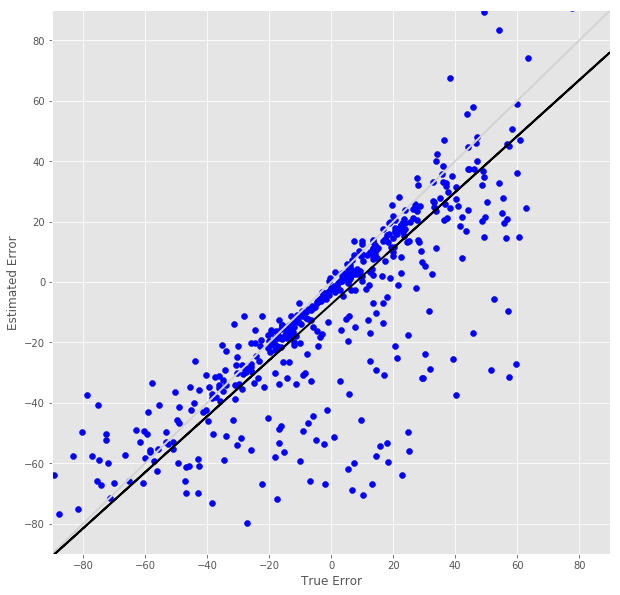

R^2 score for regression on RT: 0.1562
k = 0.4548


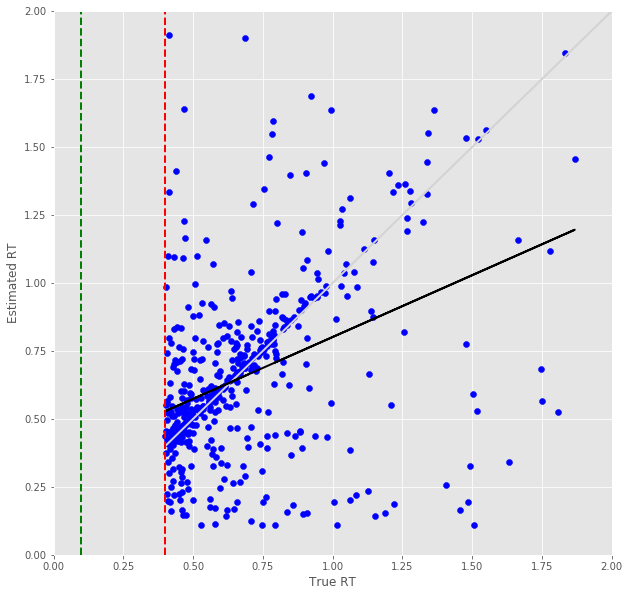

Error Prediction Score: 0.3861 RMSE
RT Prediction Score: 0.3463 RMSE
Error Prediction Corr: 0.8519
RT Prediction Corr: 0.4086
R^2 score for regression on Error: 0.7257
k = 0.9053


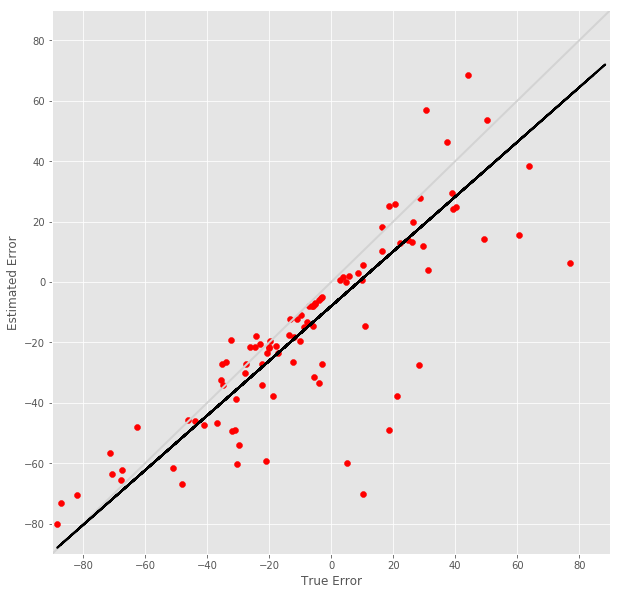

R^2 score for regression on RT: 0.1669
k = 0.3612


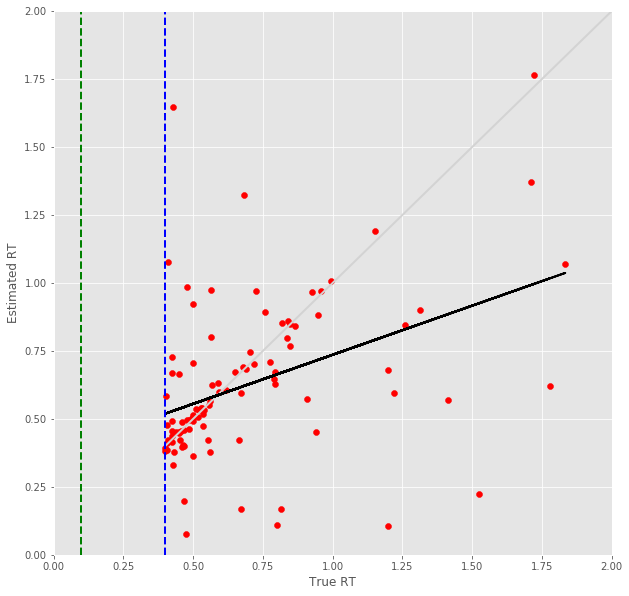

13 -step(s) forecast:
Test Score for 13 -steps forecast: 0.3148 RMSE
Predict Score for 13 -steps forecast: 0.3100 RMSE
Error Test Score for 13 -steps forecast: 0.4513 RMSE
RT Test Score for 13 -steps forecast: 0.3486 RMSE
Error Test Corr for 13 -steps forecast: 0.7921
RT Test Corr for 13 -steps forecast: 0.3623


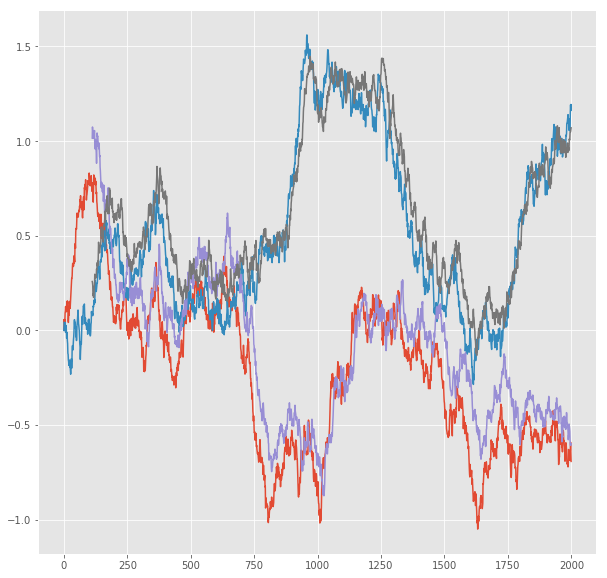

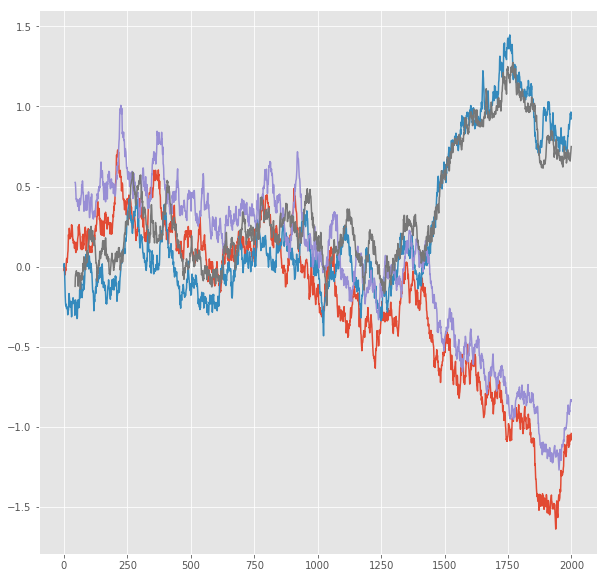

R^2 score for regression on Error: 0.6275
k = 0.9270


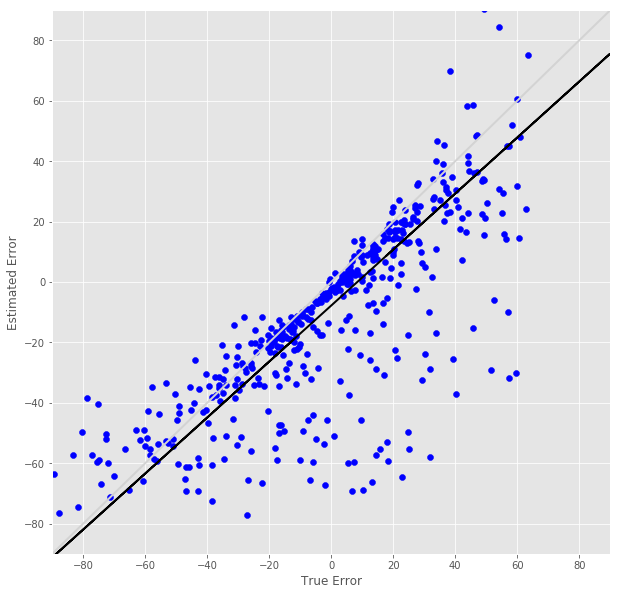

R^2 score for regression on RT: 0.1313
k = 0.4185


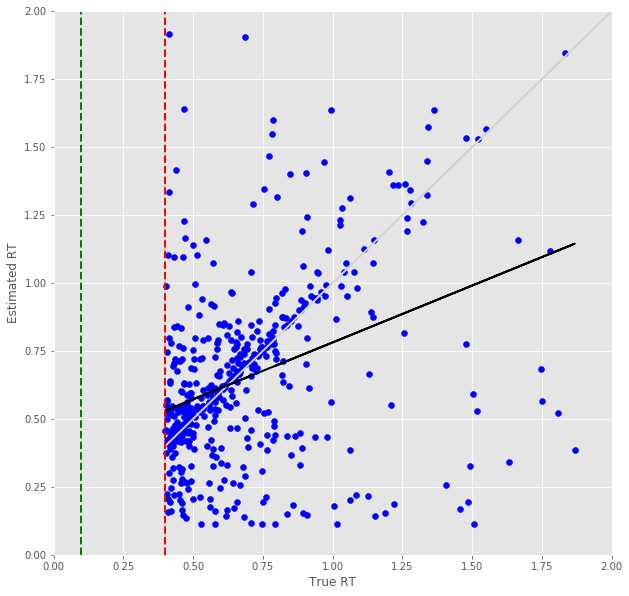

Error Prediction Score: 0.3849 RMSE
RT Prediction Score: 0.3586 RMSE
Error Prediction Corr: 0.8517
RT Prediction Corr: 0.3745
R^2 score for regression on Error: 0.7253
k = 0.9008


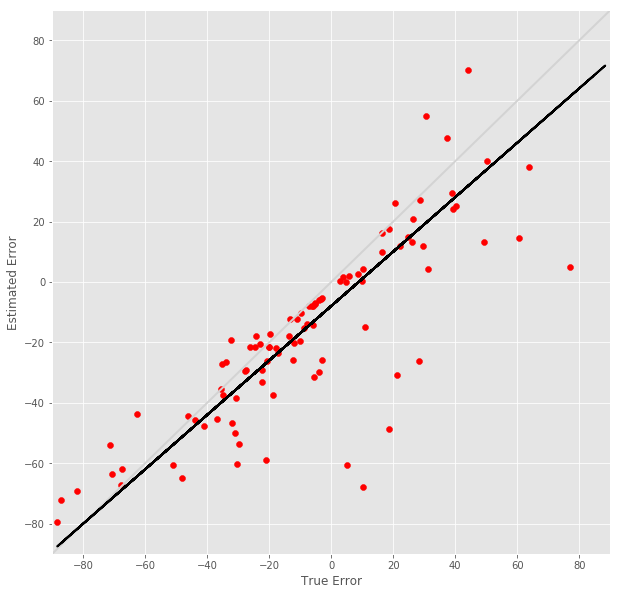

R^2 score for regression on RT: 0.1403
k = 0.3390


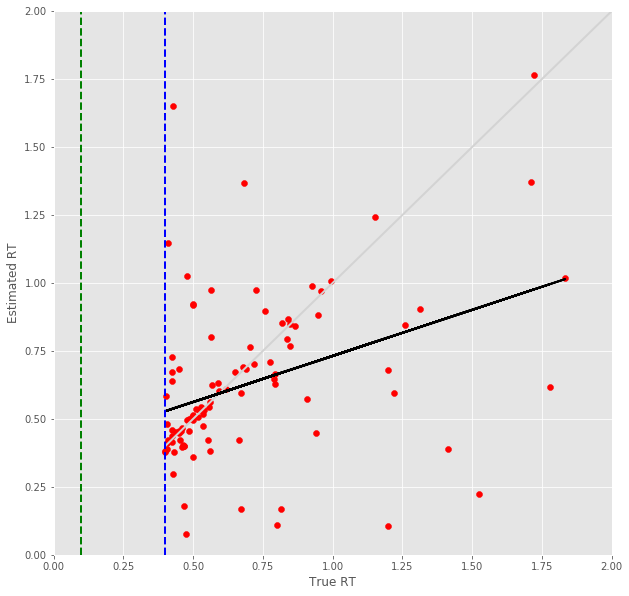

14 -step(s) forecast:
Test Score for 14 -steps forecast: 0.3329 RMSE
Predict Score for 14 -steps forecast: 0.3283 RMSE
Error Test Score for 14 -steps forecast: 0.4643 RMSE
RT Test Score for 14 -steps forecast: 0.3595 RMSE
Error Test Corr for 14 -steps forecast: 0.7828
RT Test Corr for 14 -steps forecast: 0.3285


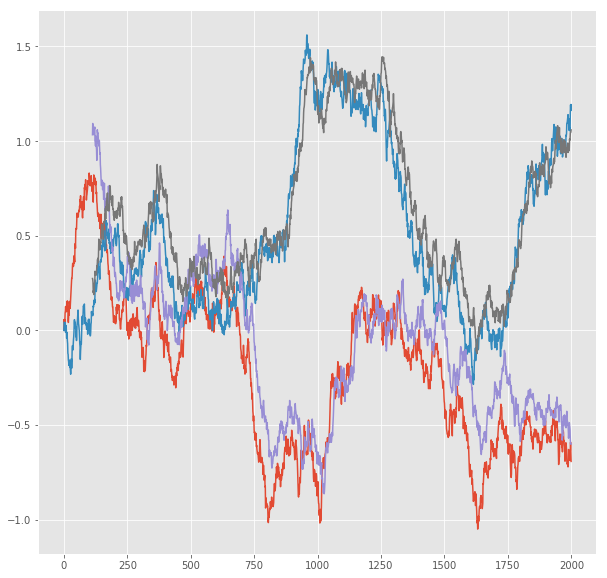

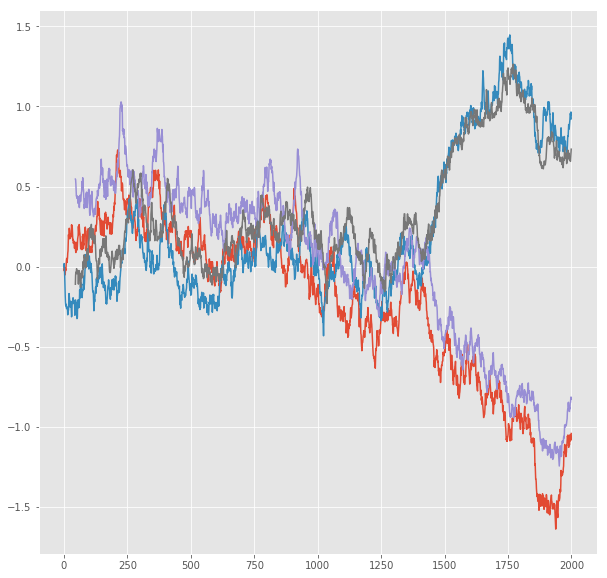

R^2 score for regression on Error: 0.6128
k = 0.9242


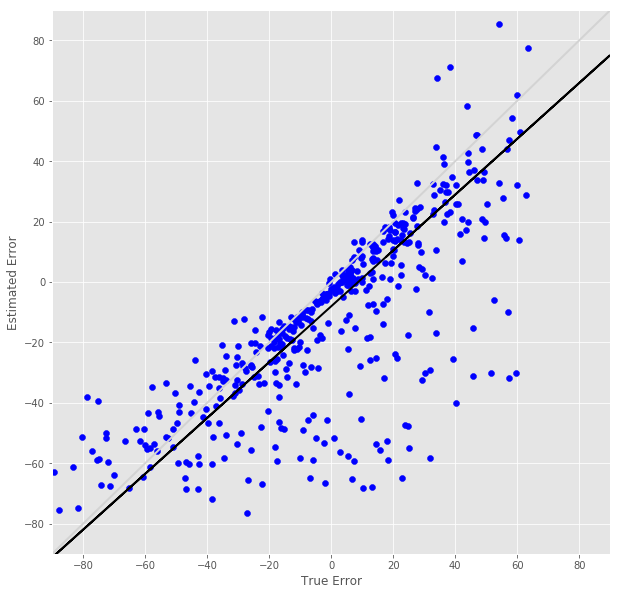

R^2 score for regression on RT: 0.1079
k = 0.3821


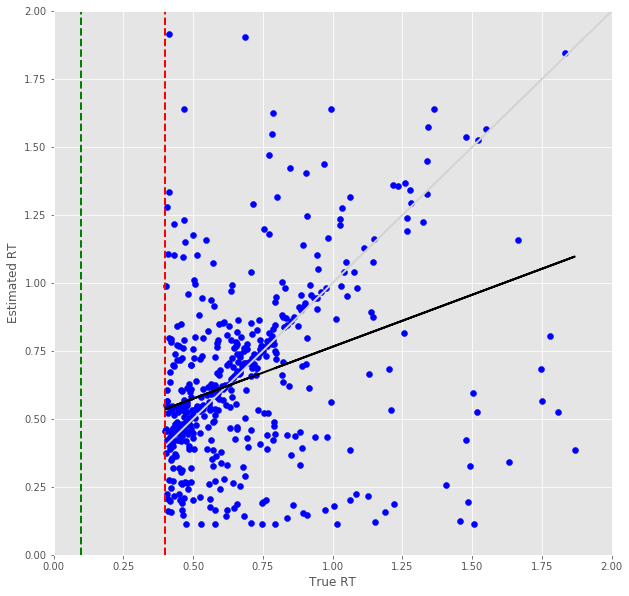

Error Prediction Score: 0.3895 RMSE
RT Prediction Score: 0.3579 RMSE
Error Prediction Corr: 0.8496
RT Prediction Corr: 0.3924
R^2 score for regression on Error: 0.7218
k = 0.8883


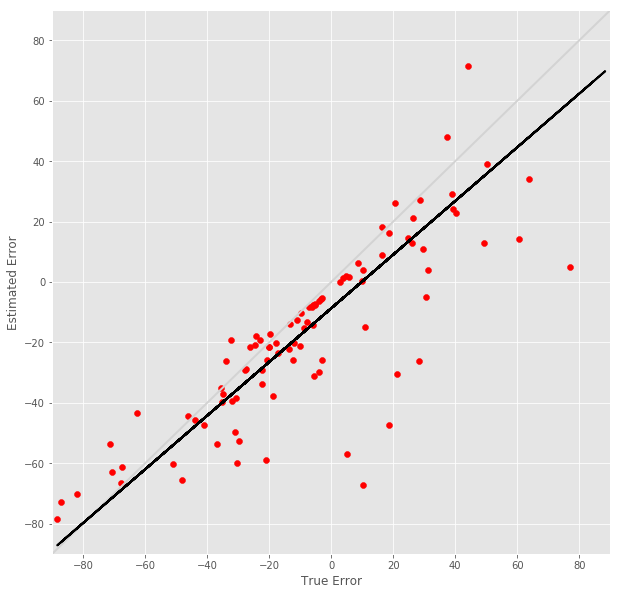

R^2 score for regression on RT: 0.1540
k = 0.3600


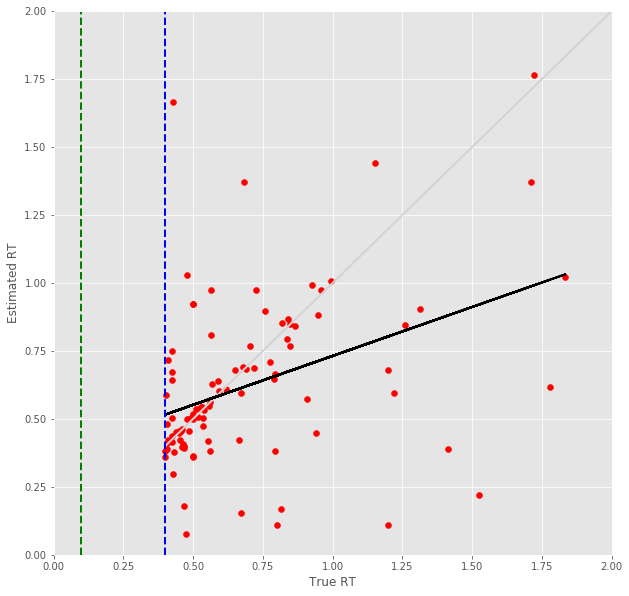

15 -step(s) forecast:
Test Score for 15 -steps forecast: 0.3506 RMSE
Predict Score for 15 -steps forecast: 0.3463 RMSE
Error Test Score for 15 -steps forecast: 0.4776 RMSE
RT Test Score for 15 -steps forecast: 0.3700 RMSE
Error Test Corr for 15 -steps forecast: 0.7792
RT Test Corr for 15 -steps forecast: 0.3005


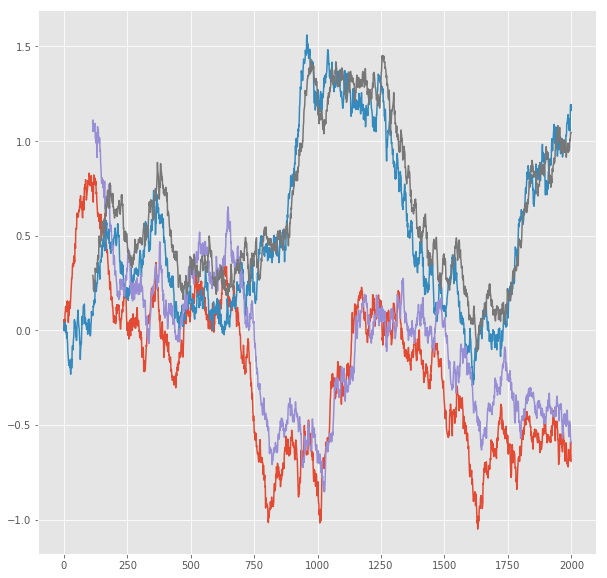

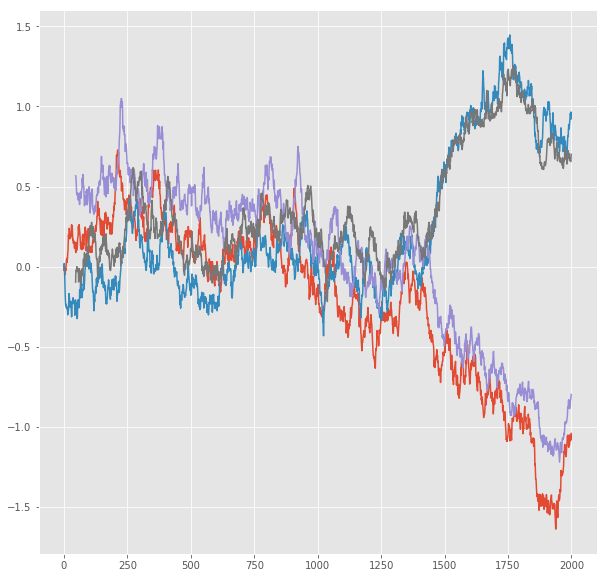

R^2 score for regression on Error: 0.6071
k = 0.9469


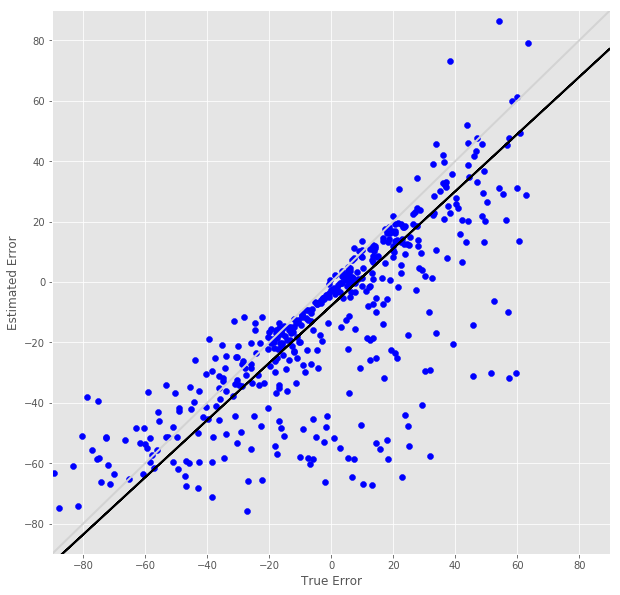

R^2 score for regression on RT: 0.0903
k = 0.3502


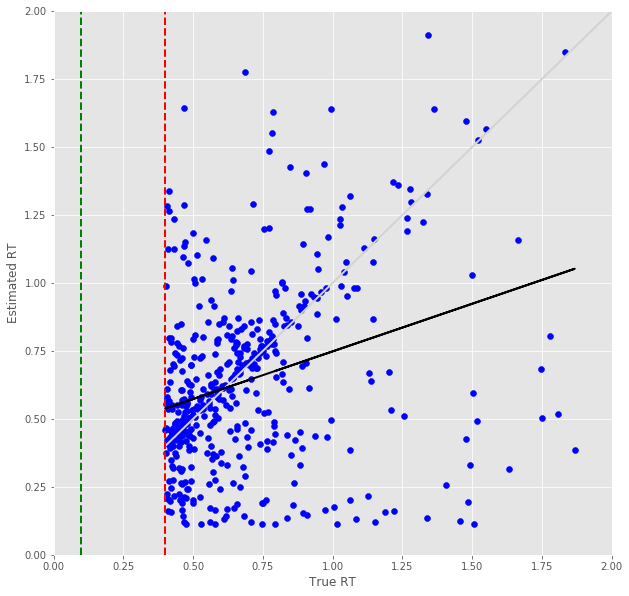

Error Prediction Score: 0.4238 RMSE
RT Prediction Score: 0.3774 RMSE
Error Prediction Corr: 0.8247
RT Prediction Corr: 0.3537
R^2 score for regression on Error: 0.6801
k = 0.9007


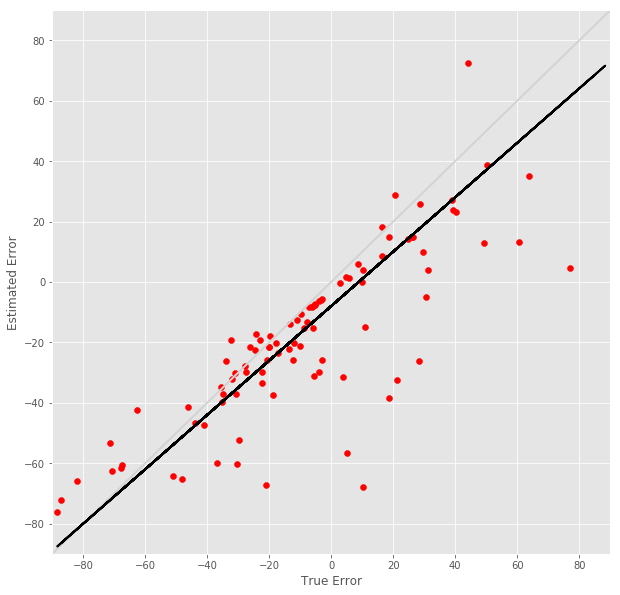

R^2 score for regression on RT: 0.1251
k = 0.3417


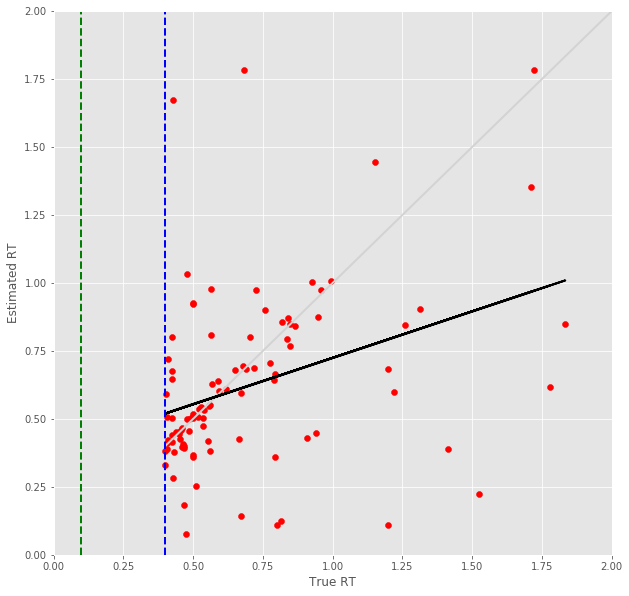

16 -step(s) forecast:
Test Score for 16 -steps forecast: 0.3679 RMSE
Predict Score for 16 -steps forecast: 0.3639 RMSE
Error Test Score for 16 -steps forecast: 0.4865 RMSE
RT Test Score for 16 -steps forecast: 0.3805 RMSE
Error Test Corr for 16 -steps forecast: 0.7790
RT Test Corr for 16 -steps forecast: 0.2928


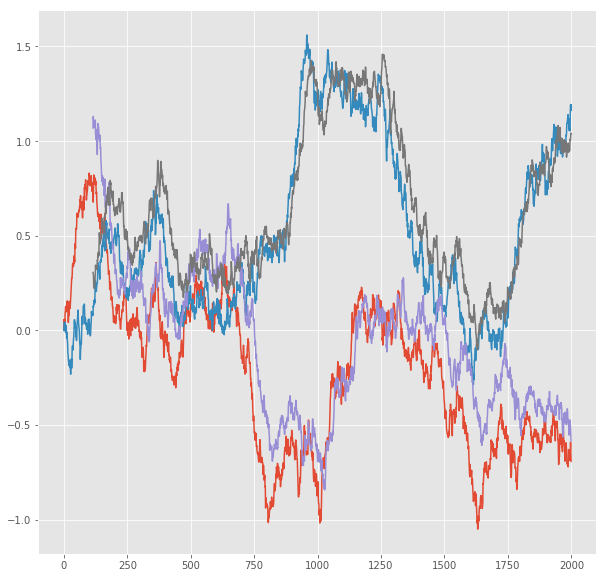

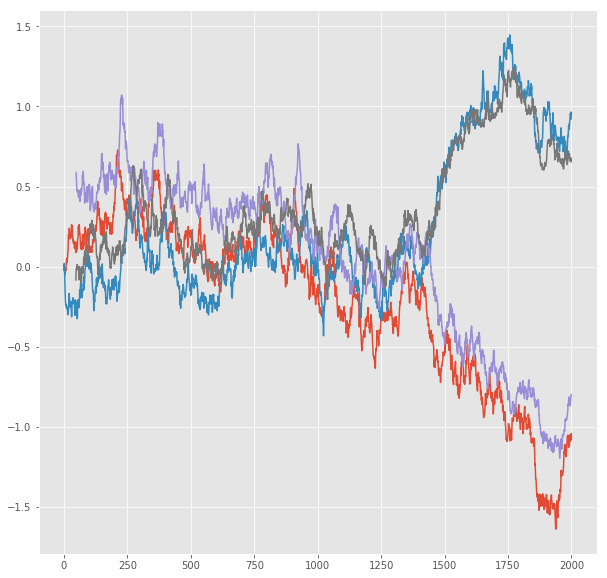

R^2 score for regression on Error: 0.6068
k = 0.9720


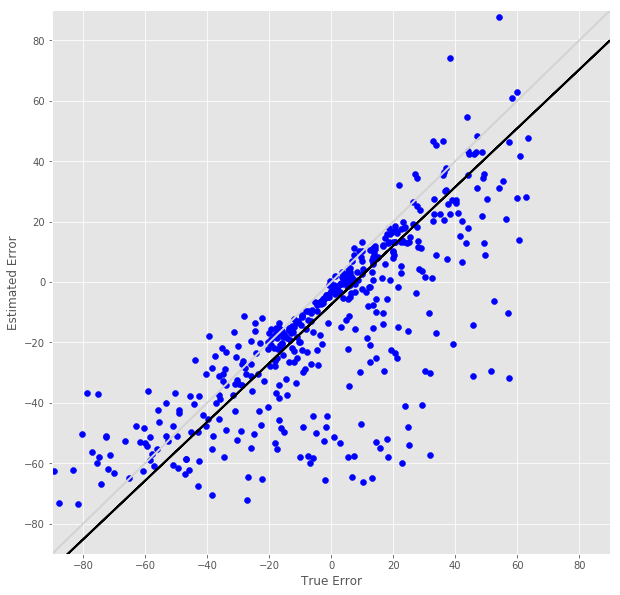

R^2 score for regression on RT: 0.0857
k = 0.3547


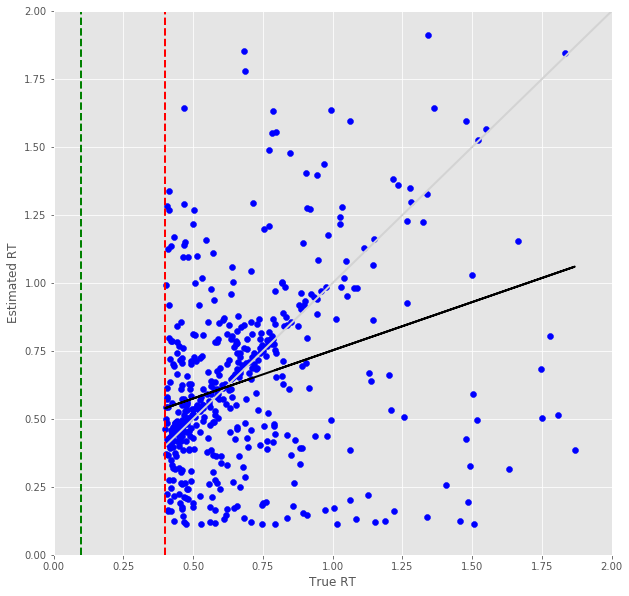

Error Prediction Score: 0.4332 RMSE
RT Prediction Score: 0.3912 RMSE
Error Prediction Corr: 0.8192
RT Prediction Corr: 0.3174
R^2 score for regression on Error: 0.6711
k = 0.8965


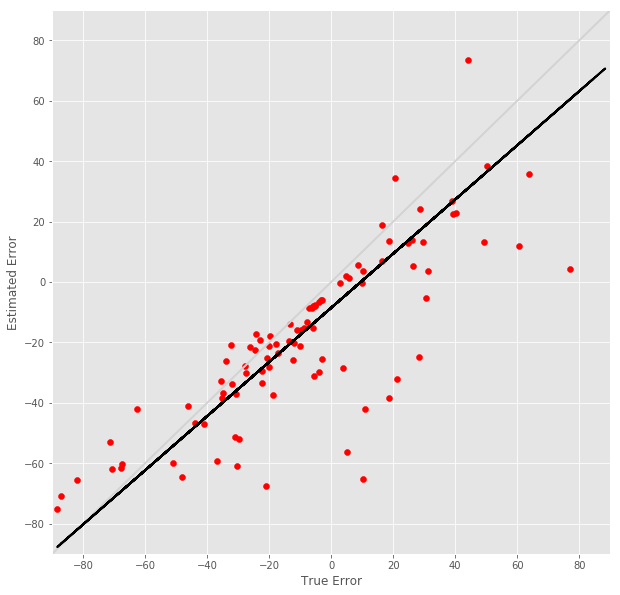

R^2 score for regression on RT: 0.1007
k = 0.3113


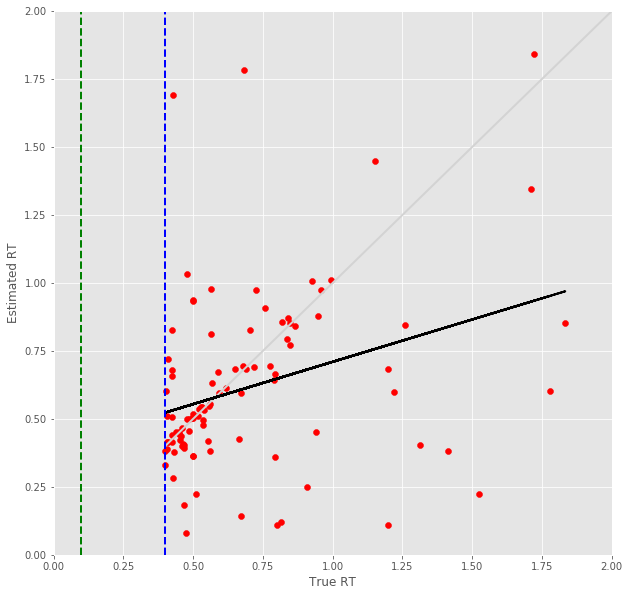

17 -step(s) forecast:
Test Score for 17 -steps forecast: 0.3849 RMSE
Predict Score for 17 -steps forecast: 0.3812 RMSE
Error Test Score for 17 -steps forecast: 0.4923 RMSE
RT Test Score for 17 -steps forecast: 0.3928 RMSE
Error Test Corr for 17 -steps forecast: 0.7714
RT Test Corr for 17 -steps forecast: 0.2702


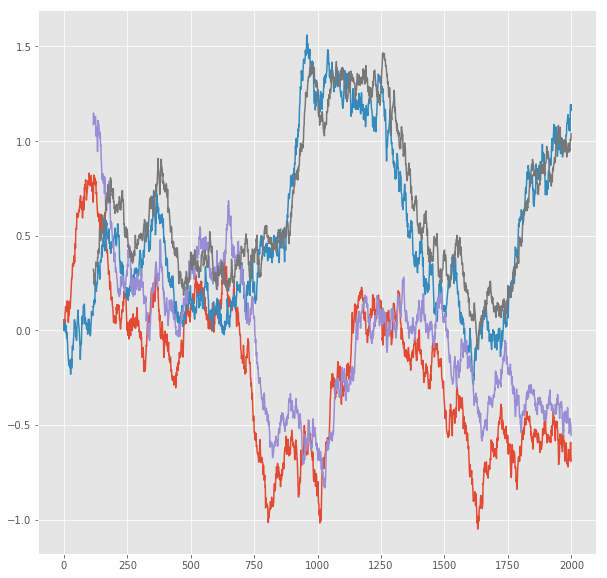

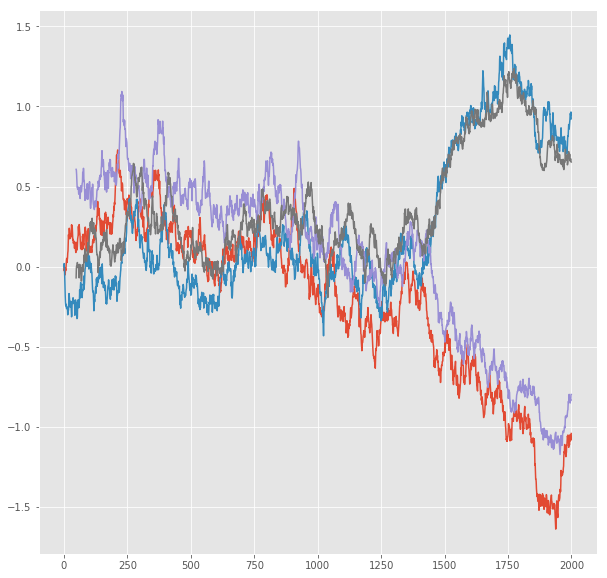

R^2 score for regression on Error: 0.5951
k = 0.9539


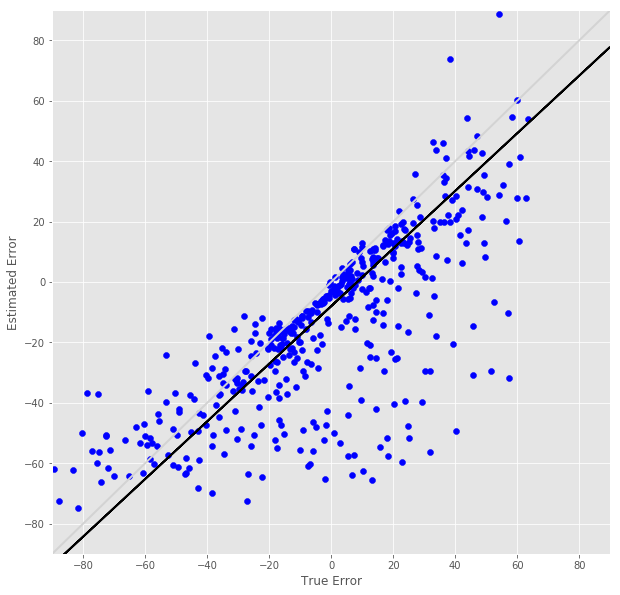

R^2 score for regression on RT: 0.0730
k = 0.3363


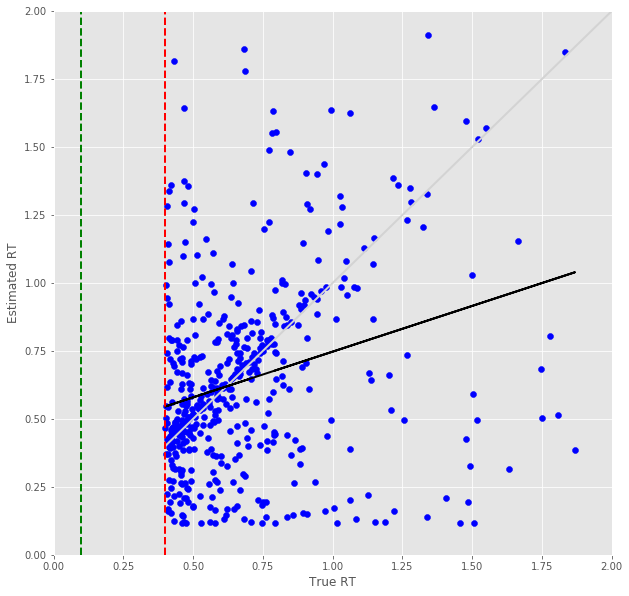

Error Prediction Score: 0.4557 RMSE
RT Prediction Score: 0.4084 RMSE
Error Prediction Corr: 0.8043
RT Prediction Corr: 0.2783
R^2 score for regression on Error: 0.6469
k = 0.8817


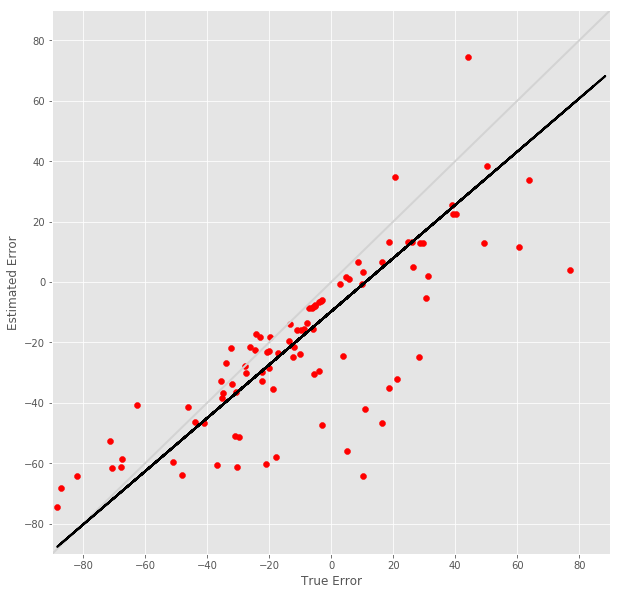

R^2 score for regression on RT: 0.0775
k = 0.2784


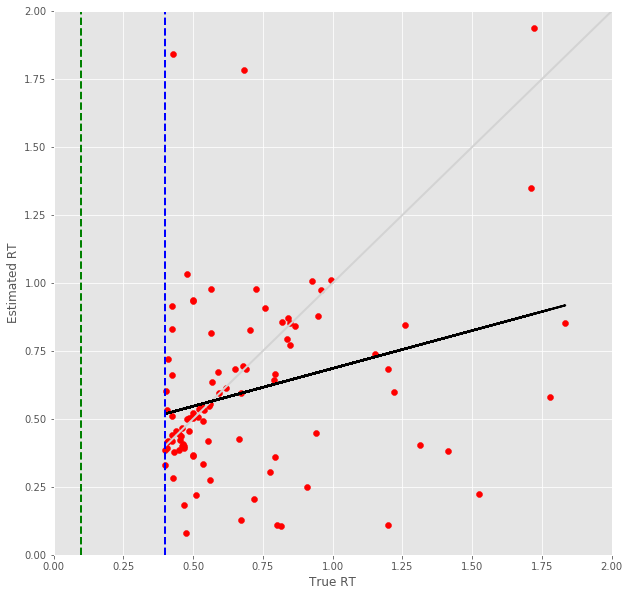

18 -step(s) forecast:
Test Score for 18 -steps forecast: 0.4015 RMSE
Predict Score for 18 -steps forecast: 0.3982 RMSE
Error Test Score for 18 -steps forecast: 0.5070 RMSE
RT Test Score for 18 -steps forecast: 0.3995 RMSE
Error Test Corr for 18 -steps forecast: 0.7612
RT Test Corr for 18 -steps forecast: 0.2598


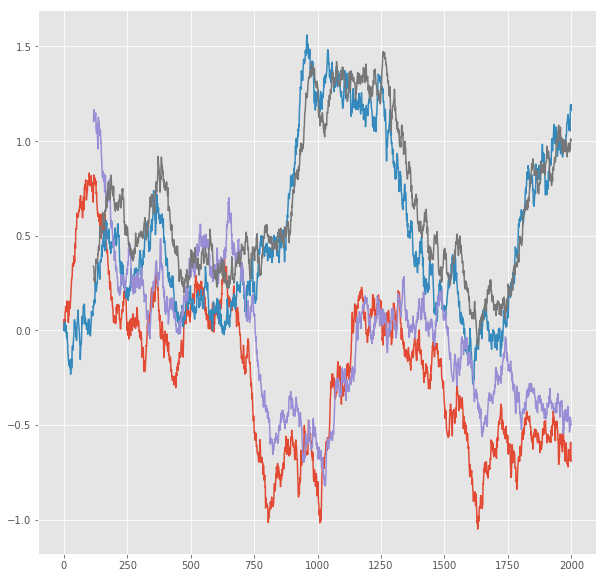

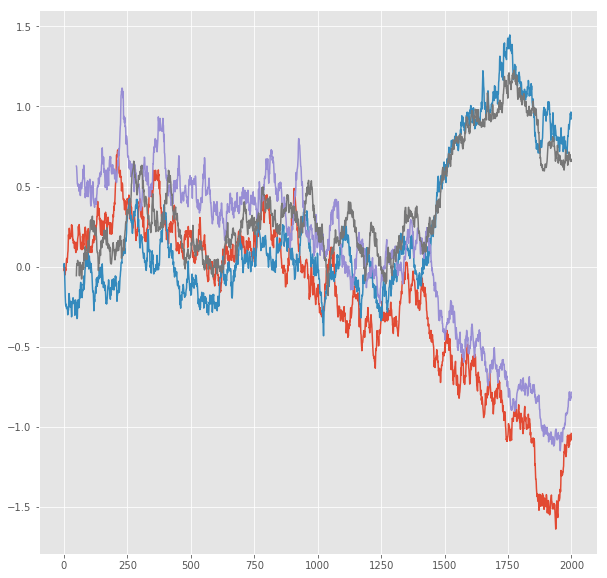

R^2 score for regression on Error: 0.5795
k = 0.9545


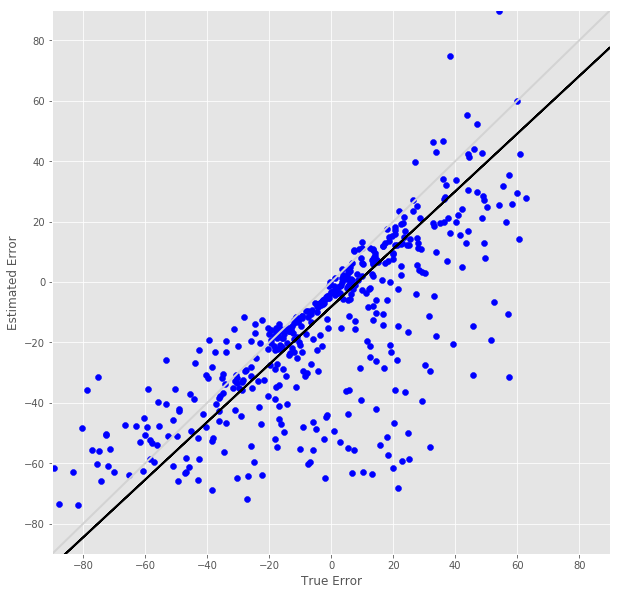

R^2 score for regression on RT: 0.0675
k = 0.3265


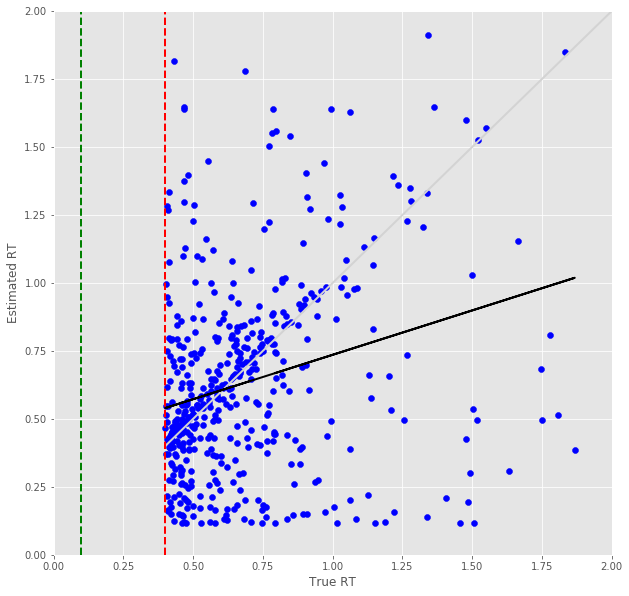

Error Prediction Score: 0.4817 RMSE
RT Prediction Score: 0.4224 RMSE
Error Prediction Corr: 0.8037
RT Prediction Corr: 0.2407
R^2 score for regression on Error: 0.6459
k = 0.9494


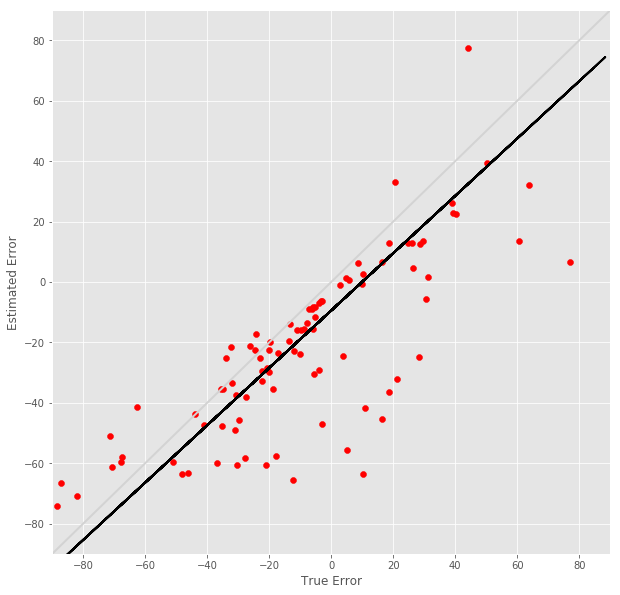

R^2 score for regression on RT: 0.0579
k = 0.2323


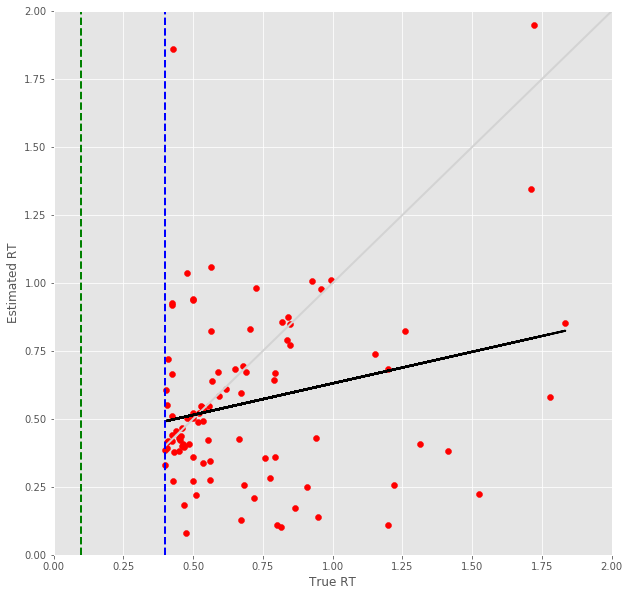

19 -step(s) forecast:
Test Score for 19 -steps forecast: 0.4178 RMSE
Predict Score for 19 -steps forecast: 0.4150 RMSE
Error Test Score for 19 -steps forecast: 0.5260 RMSE
RT Test Score for 19 -steps forecast: 0.4088 RMSE
Error Test Corr for 19 -steps forecast: 0.7486
RT Test Corr for 19 -steps forecast: 0.2372


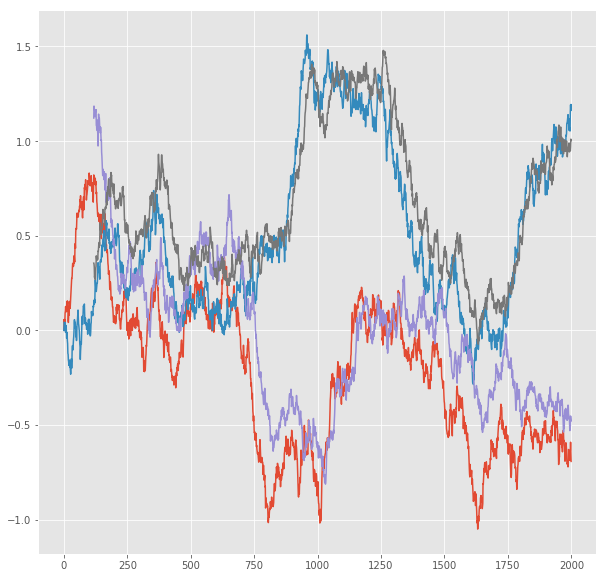

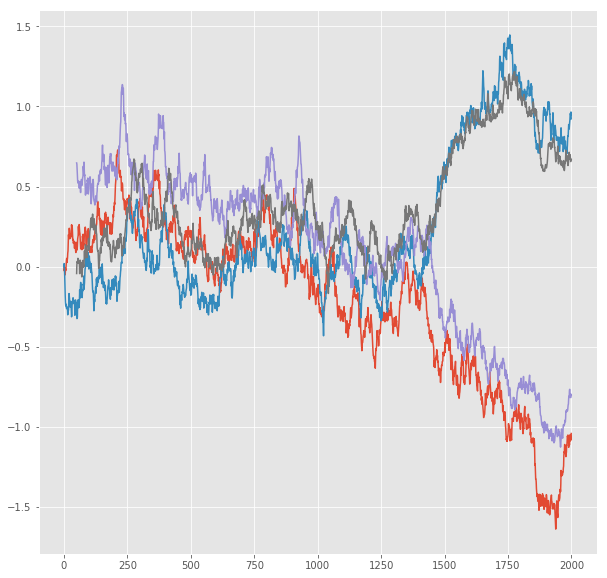

R^2 score for regression on Error: 0.5604
k = 0.9516


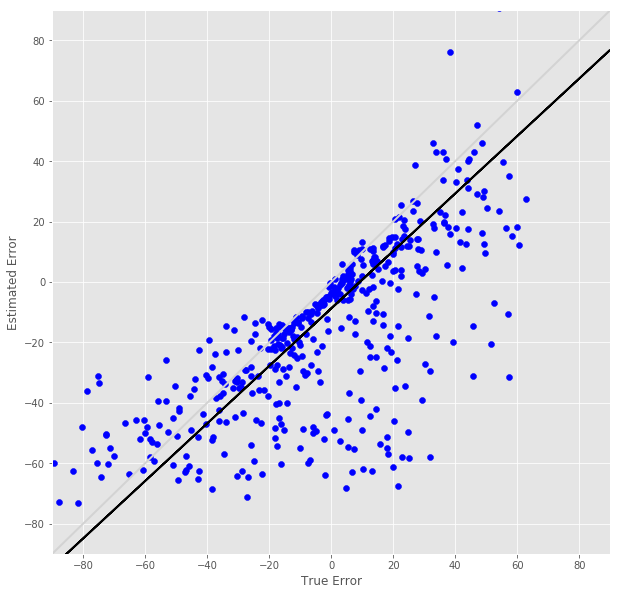

R^2 score for regression on RT: 0.0563
k = 0.3003


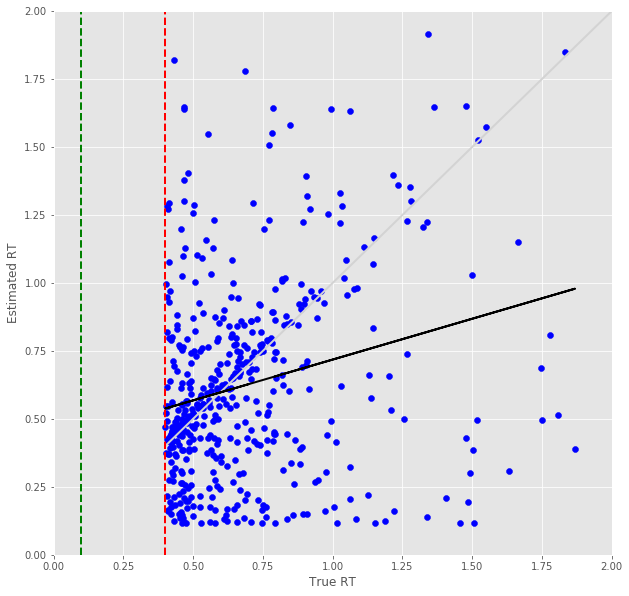

Error Prediction Score: 0.4814 RMSE
RT Prediction Score: 0.4313 RMSE
Error Prediction Corr: 0.8032
RT Prediction Corr: 0.2229
R^2 score for regression on Error: 0.6451
k = 0.9511


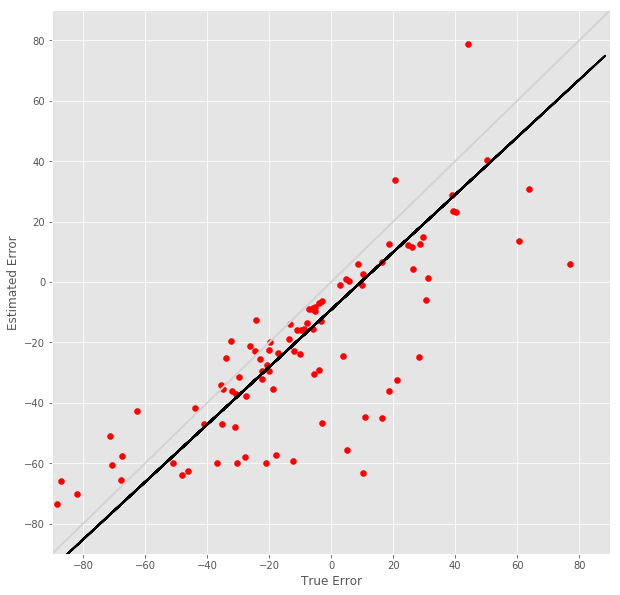

R^2 score for regression on RT: 0.0497
k = 0.2173


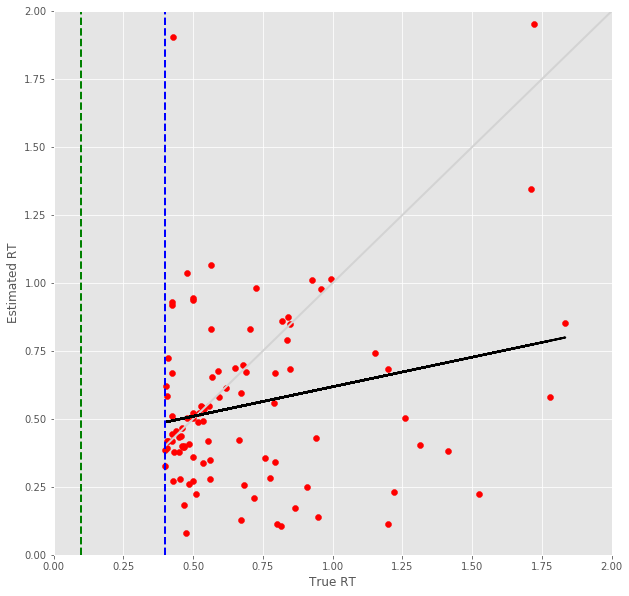

20 -step(s) forecast:
Test Score for 20 -steps forecast: 0.4338 RMSE
Predict Score for 20 -steps forecast: 0.4314 RMSE
Error Test Score for 20 -steps forecast: 0.5411 RMSE
RT Test Score for 20 -steps forecast: 0.4197 RMSE
Error Test Corr for 20 -steps forecast: 0.7377
RT Test Corr for 20 -steps forecast: 0.2091


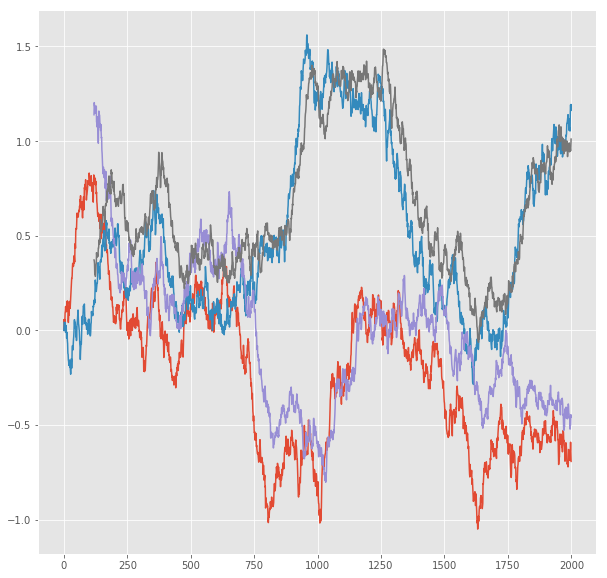

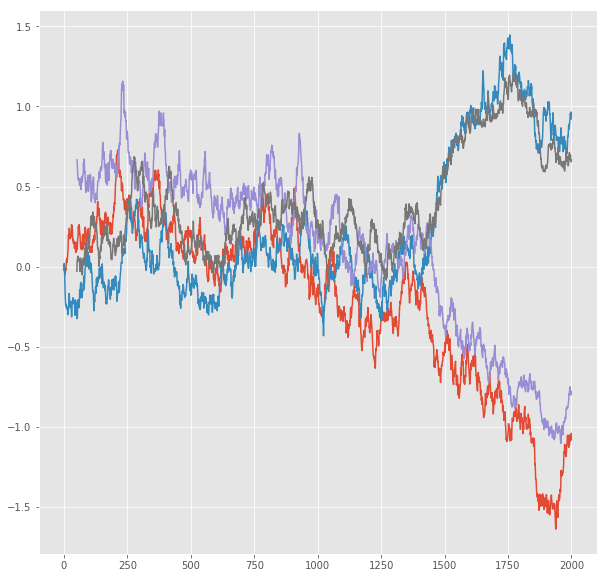

R^2 score for regression on Error: 0.5443
k = 0.9424


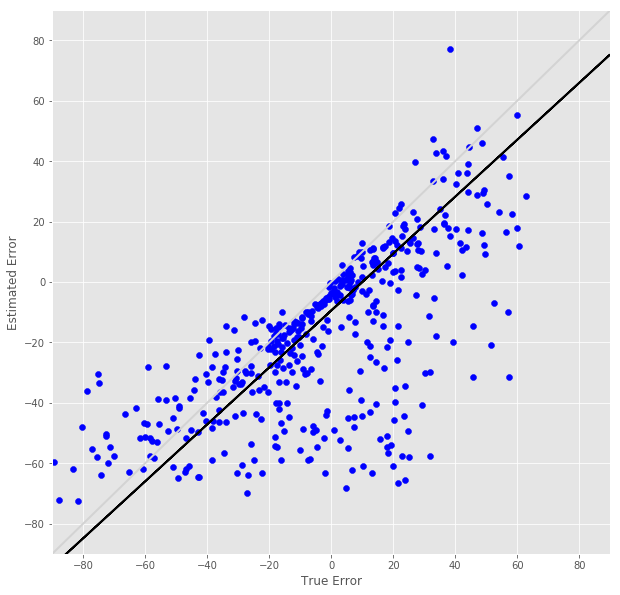

R^2 score for regression on RT: 0.0437
k = 0.2682


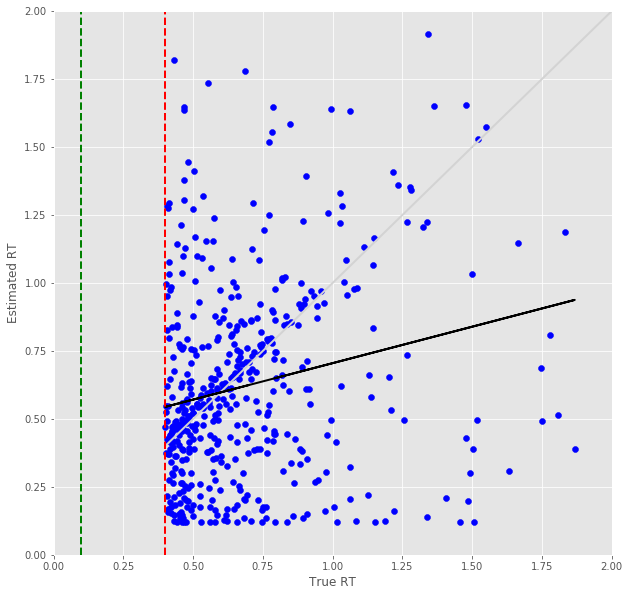

Error Prediction Score: 0.4872 RMSE
RT Prediction Score: 0.4139 RMSE
Error Prediction Corr: 0.8053
RT Prediction Corr: 0.2676
R^2 score for regression on Error: 0.6485
k = 0.9796


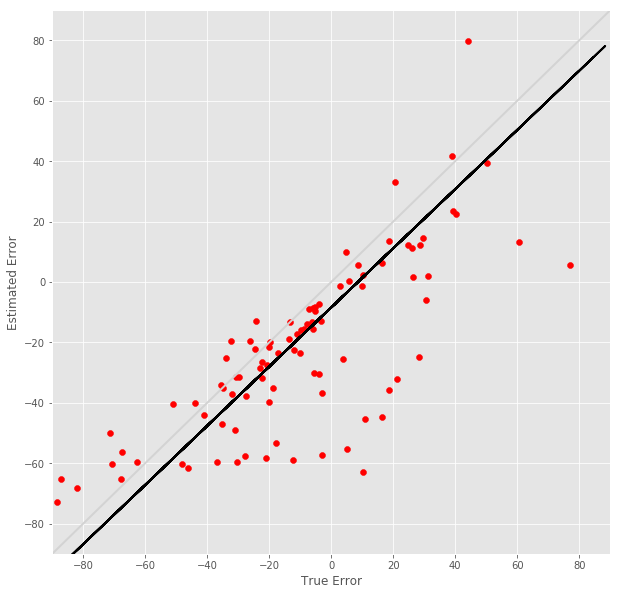

R^2 score for regression on RT: 0.0716
k = 0.2406


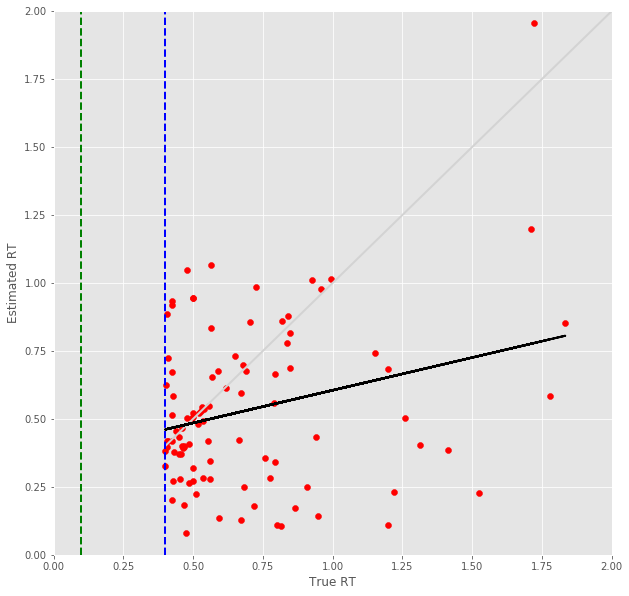

21 -step(s) forecast:
Test Score for 21 -steps forecast: 0.4495 RMSE
Predict Score for 21 -steps forecast: 0.4477 RMSE
Error Test Score for 21 -steps forecast: 0.5547 RMSE
RT Test Score for 21 -steps forecast: 0.4399 RMSE
Error Test Corr for 21 -steps forecast: 0.7317
RT Test Corr for 21 -steps forecast: 0.1601


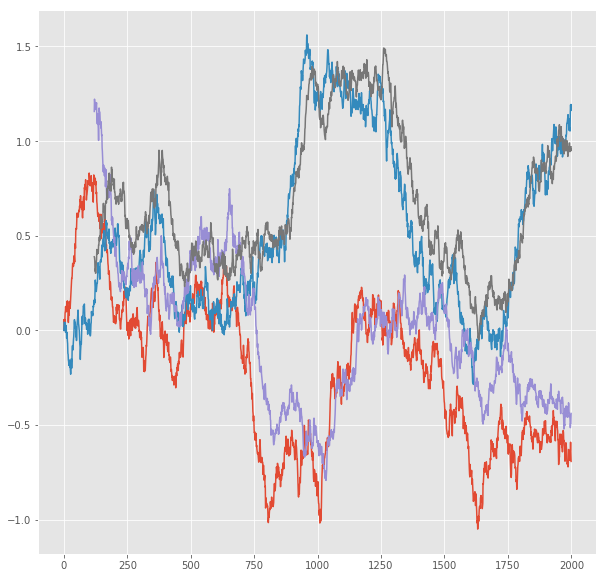

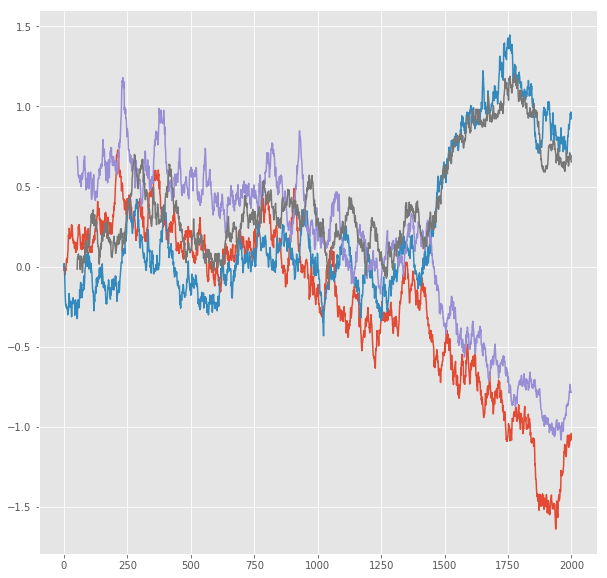

R^2 score for regression on Error: 0.5354
k = 0.9458


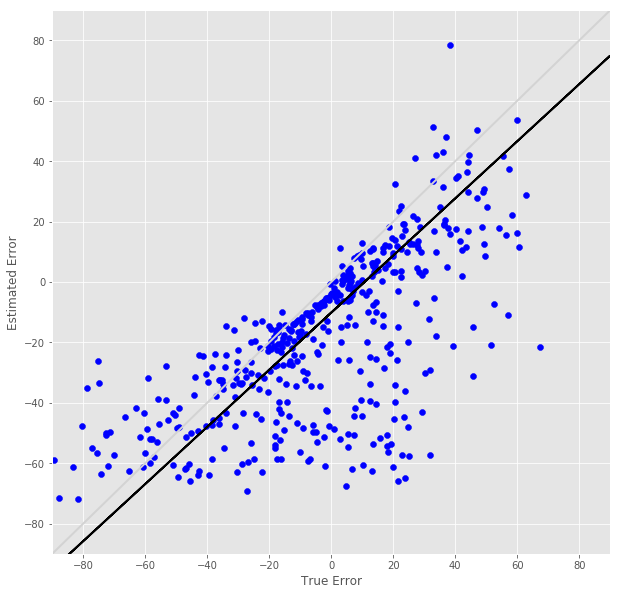

R^2 score for regression on RT: 0.0256
k = 0.2100


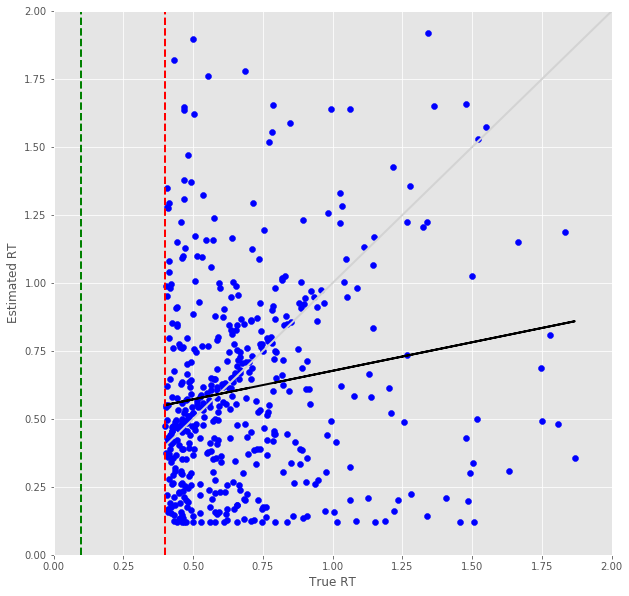

Error Prediction Score: 0.4906 RMSE
RT Prediction Score: 0.4151 RMSE
Error Prediction Corr: 0.7980
RT Prediction Corr: 0.2863
R^2 score for regression on Error: 0.6367
k = 0.9611


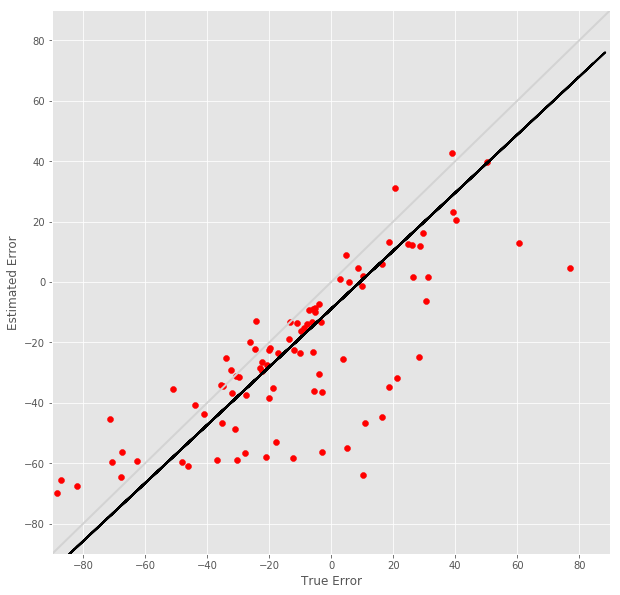

R^2 score for regression on RT: 0.0820
k = 0.2578


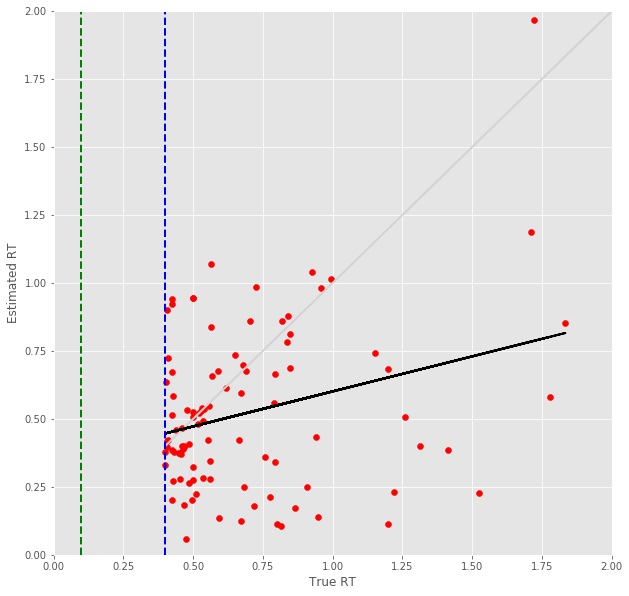

22 -step(s) forecast:
Test Score for 22 -steps forecast: 0.4649 RMSE
Predict Score for 22 -steps forecast: 0.4637 RMSE
Error Test Score for 22 -steps forecast: 0.5851 RMSE
RT Test Score for 22 -steps forecast: 0.4483 RMSE
Error Test Corr for 22 -steps forecast: 0.7124
RT Test Corr for 22 -steps forecast: 0.1085


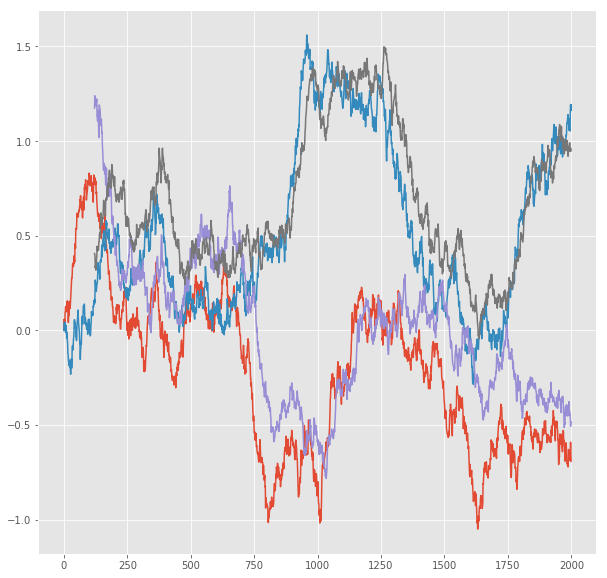

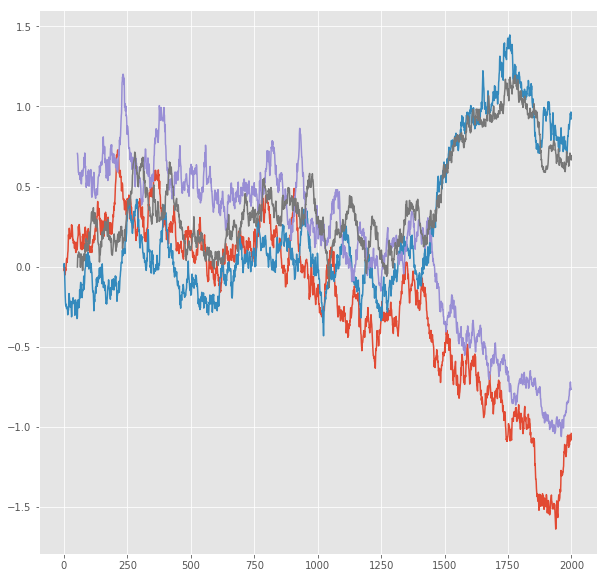

R^2 score for regression on Error: 0.5076
k = 0.9394


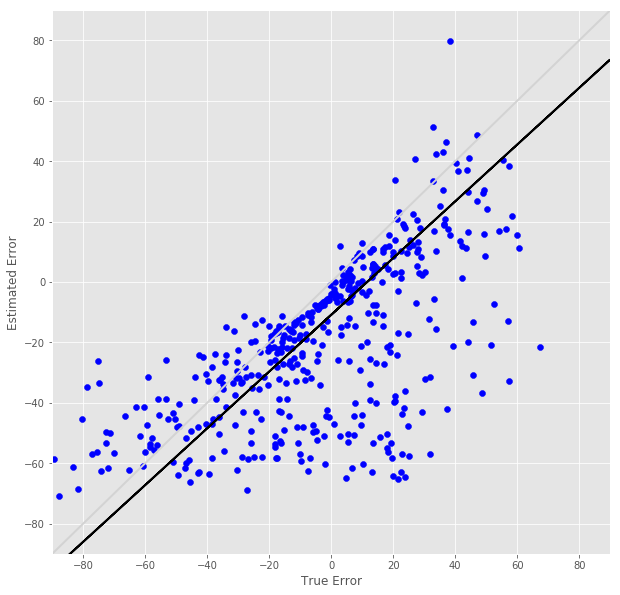

R^2 score for regression on RT: 0.0118
k = 0.1382


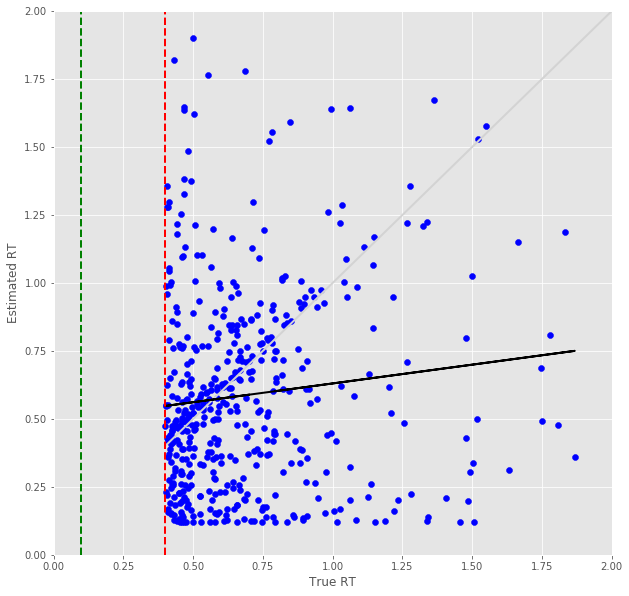

Error Prediction Score: 0.4860 RMSE
RT Prediction Score: 0.4240 RMSE
Error Prediction Corr: 0.8173
RT Prediction Corr: 0.1463
R^2 score for regression on Error: 0.6680
k = 1.0206


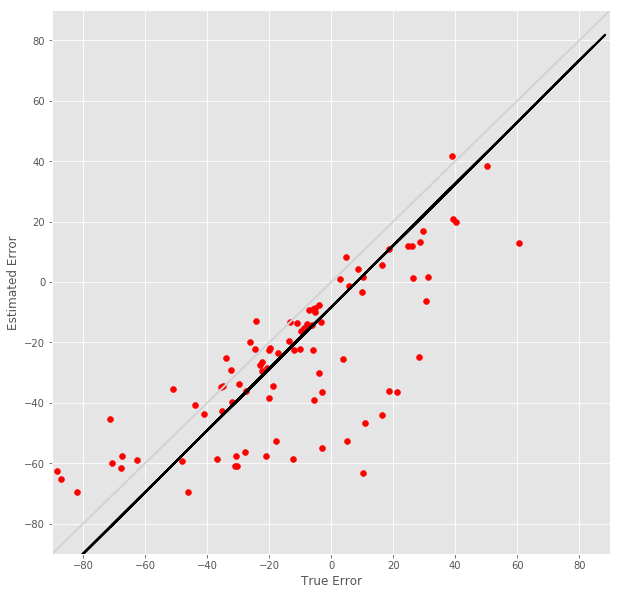

R^2 score for regression on RT: 0.0214
k = 0.1201


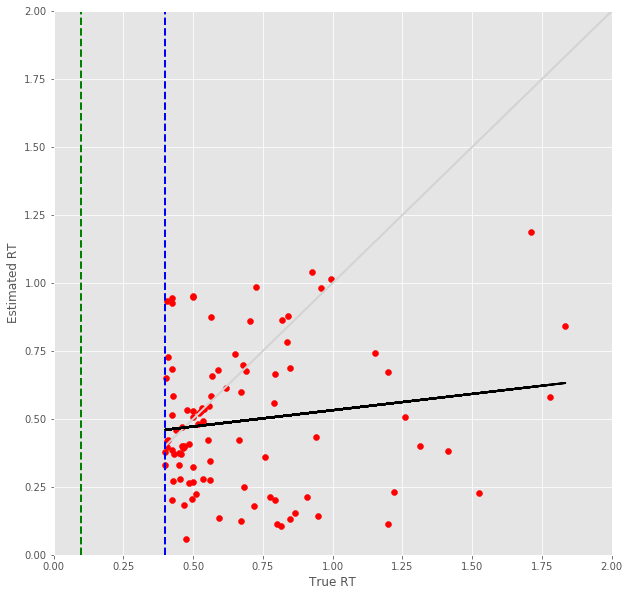

23 -step(s) forecast:
Test Score for 23 -steps forecast: 0.4801 RMSE
Predict Score for 23 -steps forecast: 0.4795 RMSE
Error Test Score for 23 -steps forecast: 0.5959 RMSE
RT Test Score for 23 -steps forecast: 0.4567 RMSE
Error Test Corr for 23 -steps forecast: 0.7079
RT Test Corr for 23 -steps forecast: 0.0952


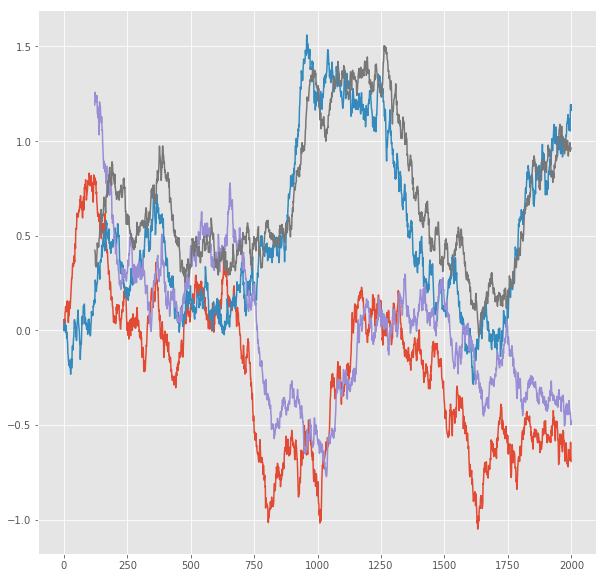

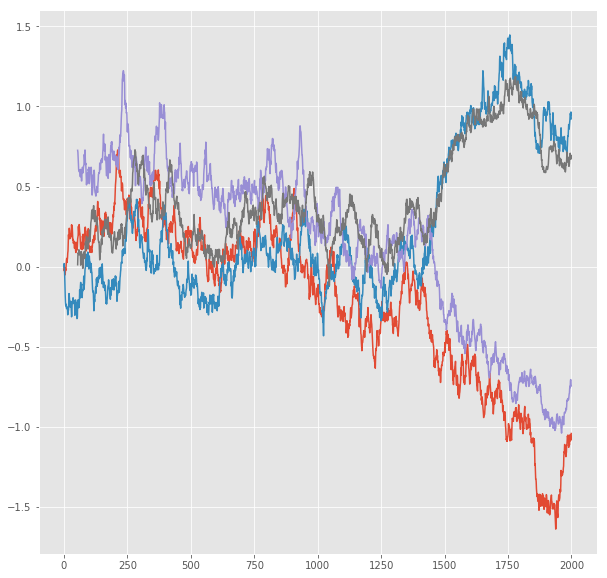

R^2 score for regression on Error: 0.5011
k = 0.9498


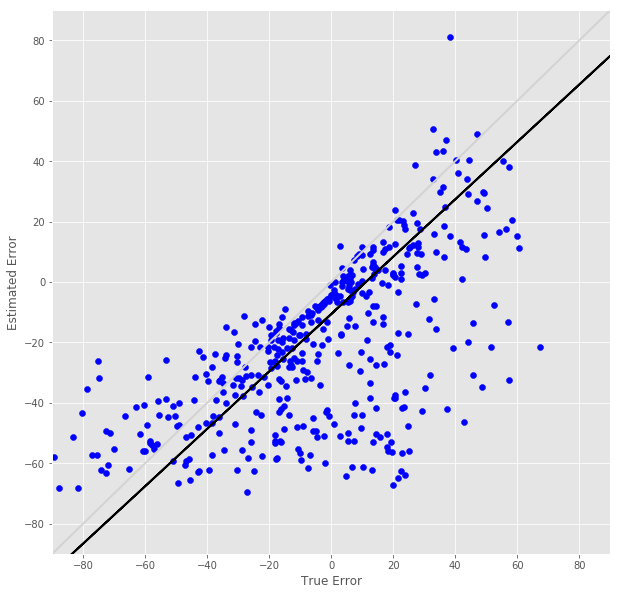

R^2 score for regression on RT: 0.0091
k = 0.1232


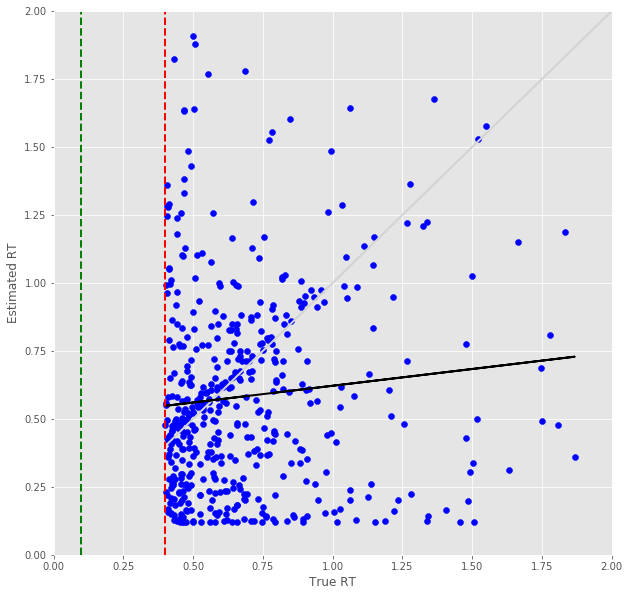

Error Prediction Score: 0.4992 RMSE
RT Prediction Score: 0.4433 RMSE
Error Prediction Corr: 0.8148
RT Prediction Corr: 0.0881
R^2 score for regression on Error: 0.6639
k = 1.0441


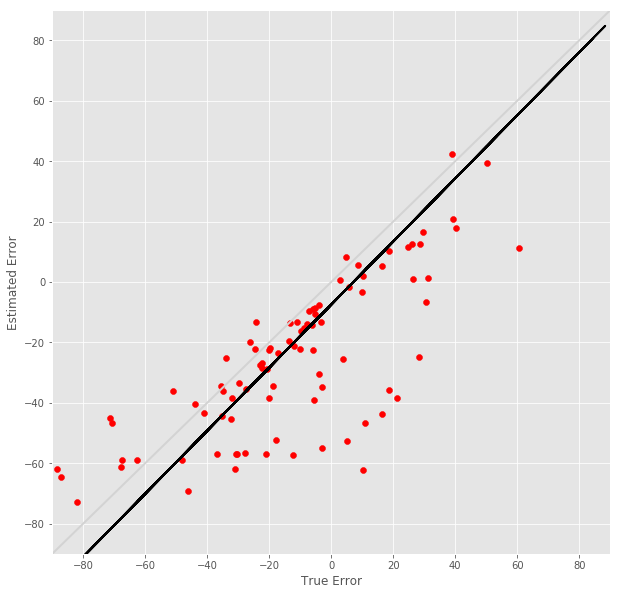

R^2 score for regression on RT: 0.0078
k = 0.0793


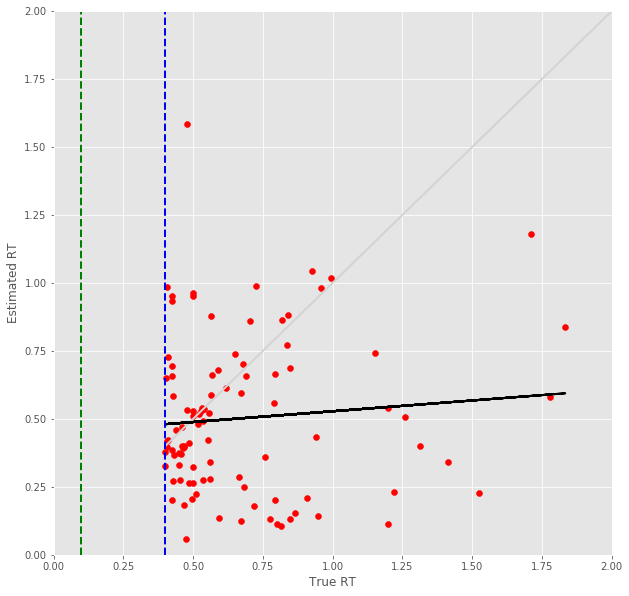

24 -step(s) forecast:
Test Score for 24 -steps forecast: 0.4951 RMSE
Predict Score for 24 -steps forecast: 0.4951 RMSE
Error Test Score for 24 -steps forecast: 0.6085 RMSE
RT Test Score for 24 -steps forecast: 0.4734 RMSE
Error Test Corr for 24 -steps forecast: 0.6943
RT Test Corr for 24 -steps forecast: 0.0599


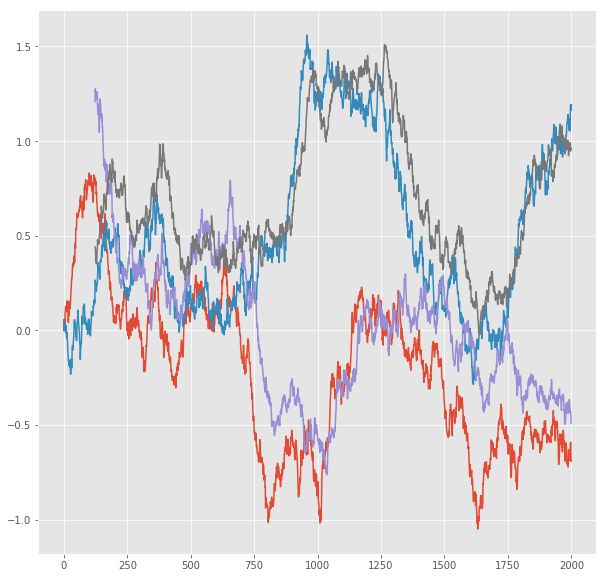

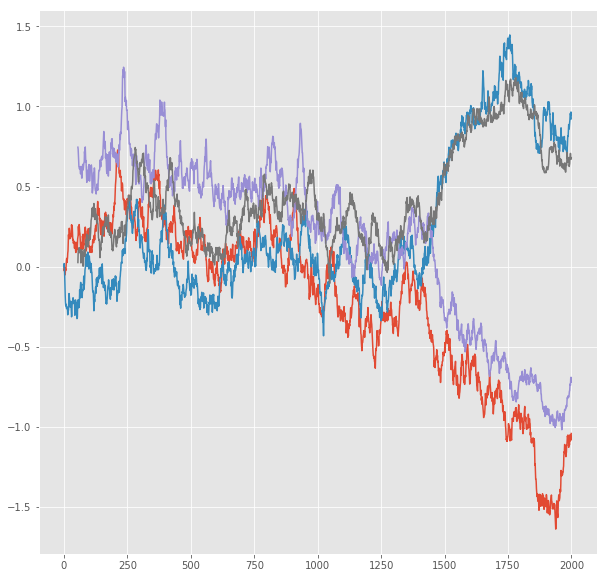

R^2 score for regression on Error: 0.4820
k = 0.9219


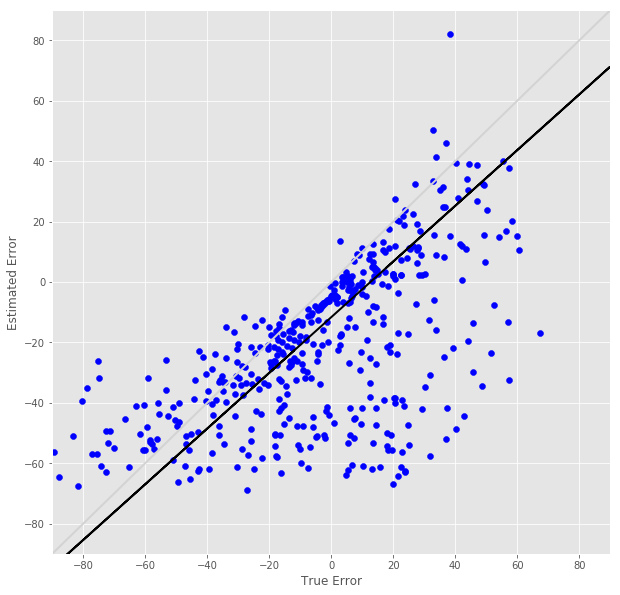

R^2 score for regression on RT: 0.0036
k = 0.0799


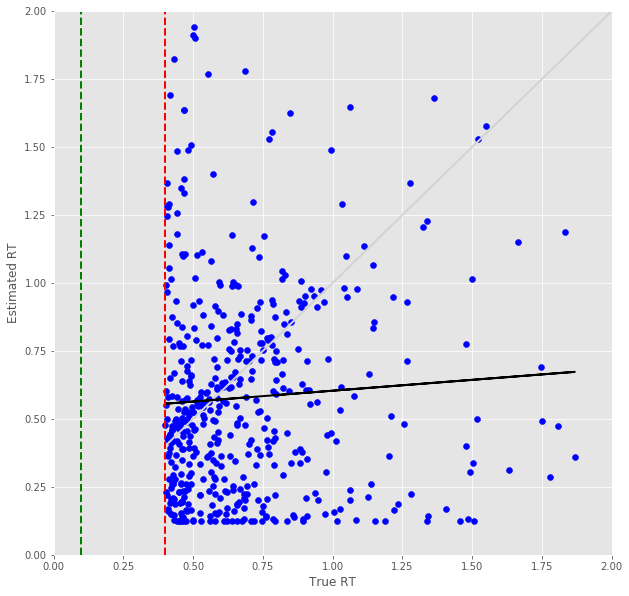

Error Prediction Score: 0.5109 RMSE
RT Prediction Score: 0.4509 RMSE
Error Prediction Corr: 0.8067
RT Prediction Corr: 0.0738
R^2 score for regression on Error: 0.6507
k = 1.0376


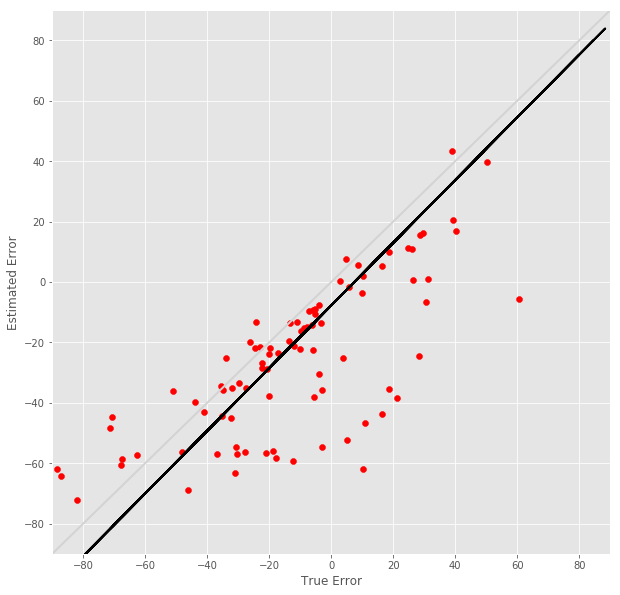

R^2 score for regression on RT: 0.0054
k = 0.0679


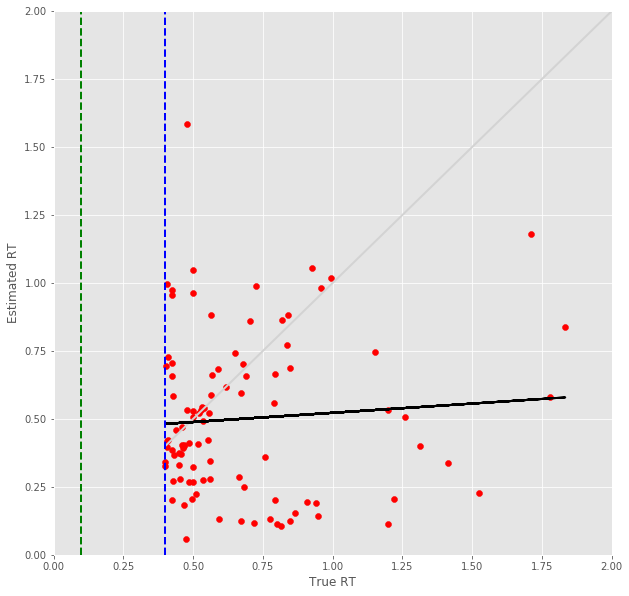

25 -step(s) forecast:
Test Score for 25 -steps forecast: 0.5098 RMSE
Predict Score for 25 -steps forecast: 0.5106 RMSE
Error Test Score for 25 -steps forecast: 0.6206 RMSE
RT Test Score for 25 -steps forecast: 0.4874 RMSE
Error Test Corr for 25 -steps forecast: 0.6884
RT Test Corr for 25 -steps forecast: 0.0320


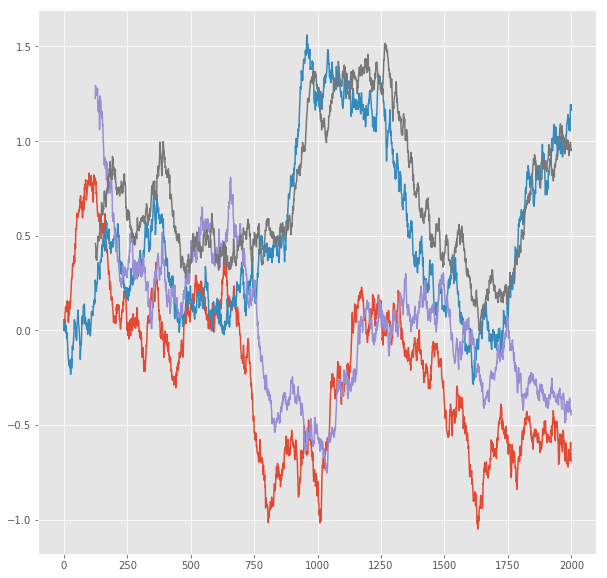

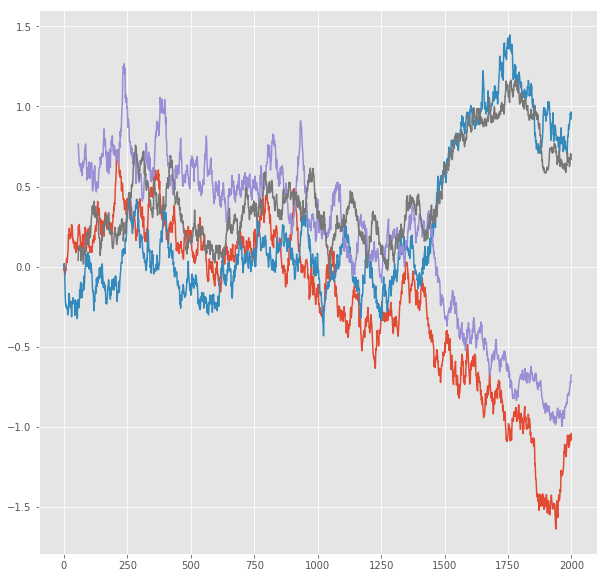

R^2 score for regression on Error: 0.4739
k = 0.9190


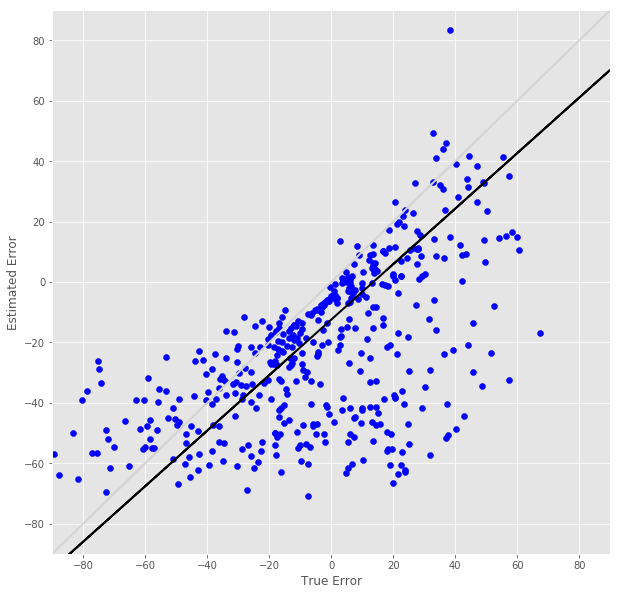

R^2 score for regression on RT: 0.0010
k = 0.0433


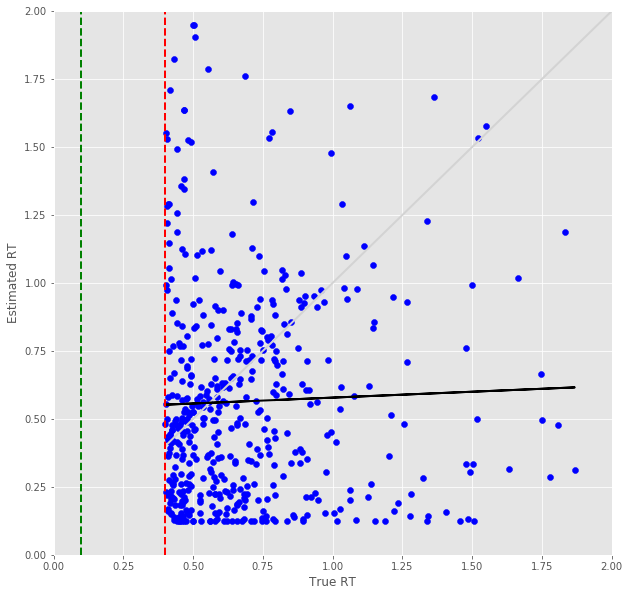

Error Prediction Score: 0.5132 RMSE
RT Prediction Score: 0.4537 RMSE
Error Prediction Corr: 0.8062
RT Prediction Corr: 0.0726
R^2 score for regression on Error: 0.6499
k = 1.0412


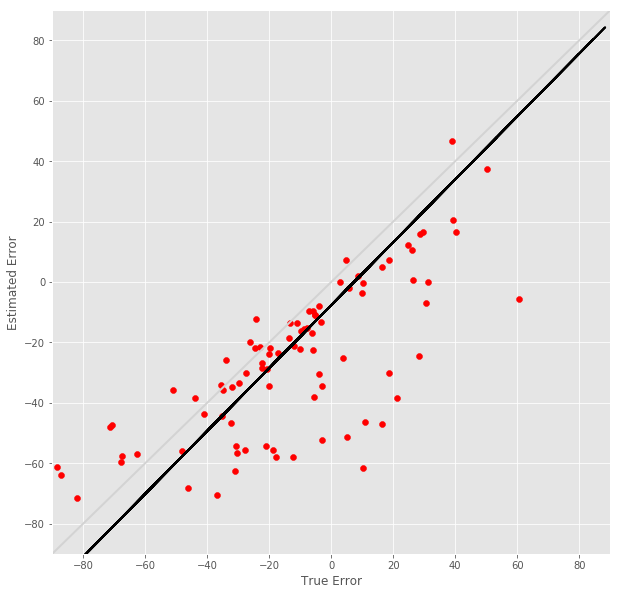

R^2 score for regression on RT: 0.0053
k = 0.0677


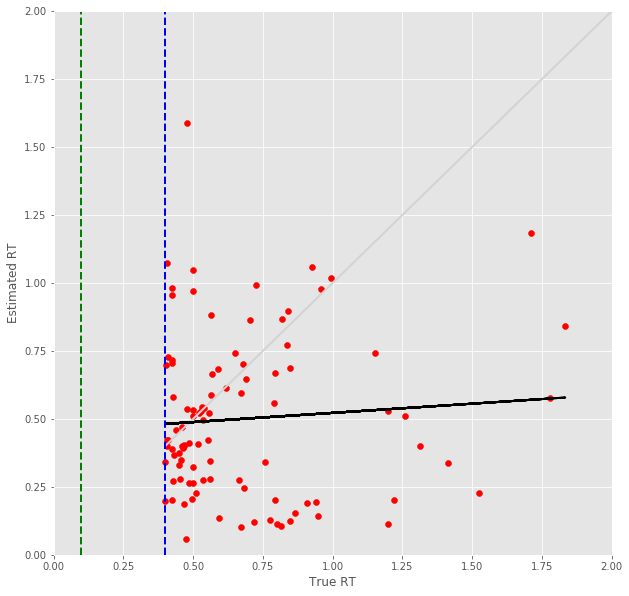

26 -step(s) forecast:
Test Score for 26 -steps forecast: 0.5243 RMSE
Predict Score for 26 -steps forecast: 0.5258 RMSE
Error Test Score for 26 -steps forecast: 0.6363 RMSE
RT Test Score for 26 -steps forecast: 0.4922 RMSE
Error Test Corr for 26 -steps forecast: 0.6782
RT Test Corr for 26 -steps forecast: 0.0271


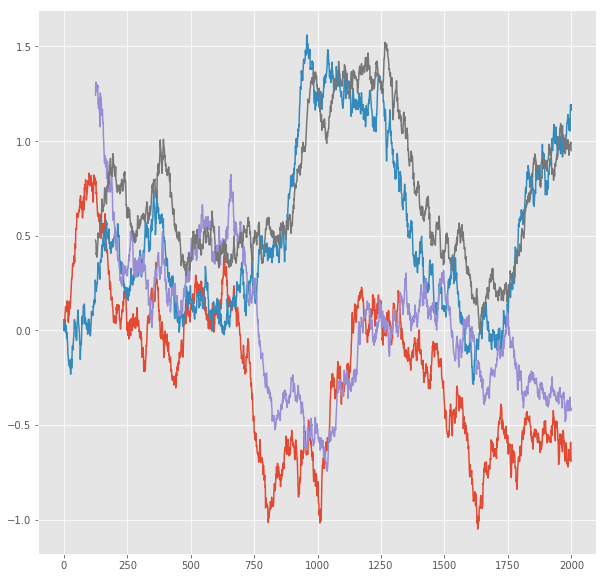

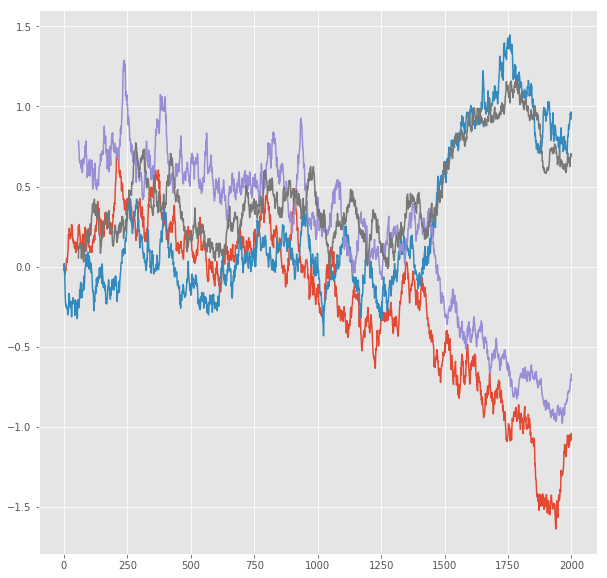

R^2 score for regression on Error: 0.4600
k = 0.9126


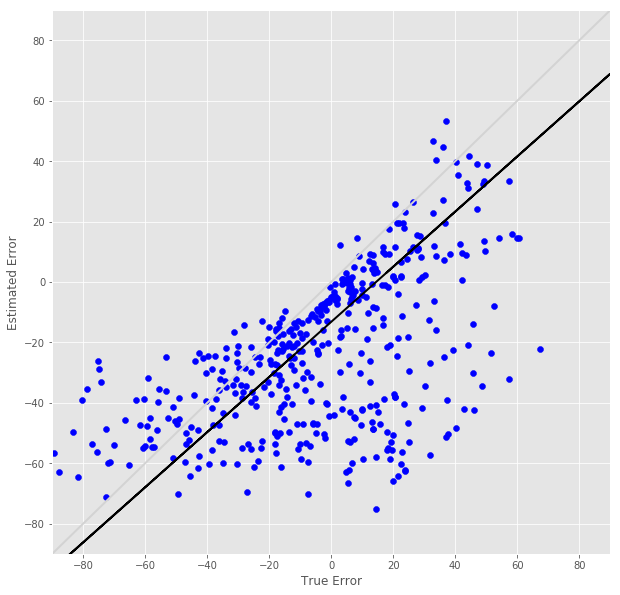

R^2 score for regression on RT: 0.0007
k = 0.0365


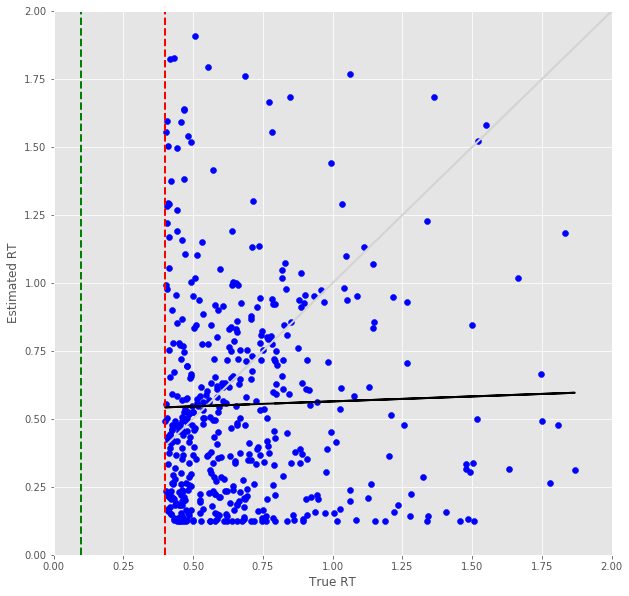

Error Prediction Score: 0.5370 RMSE
RT Prediction Score: 0.4756 RMSE
Error Prediction Corr: 0.7968
RT Prediction Corr: 0.0608
R^2 score for regression on Error: 0.6349
k = 1.0522


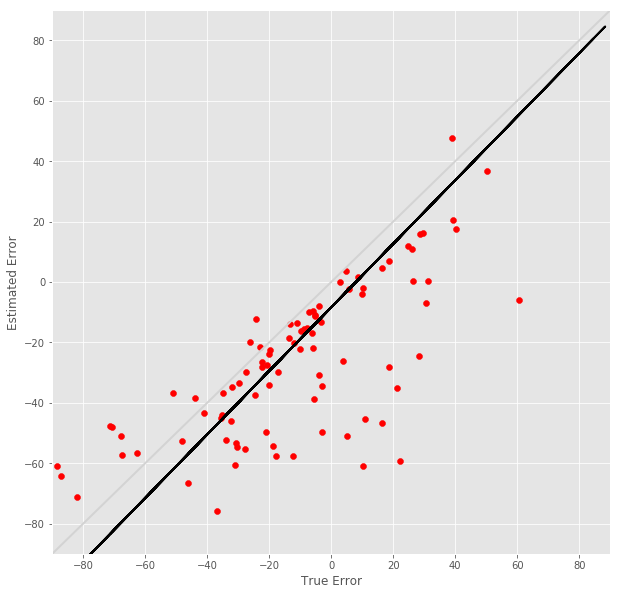

R^2 score for regression on RT: 0.0037
k = 0.0631


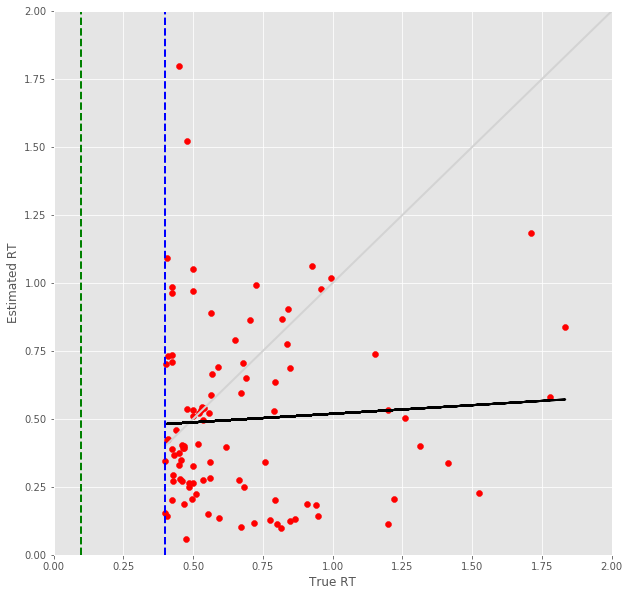

27 -step(s) forecast:
Test Score for 27 -steps forecast: 0.5386 RMSE
Predict Score for 27 -steps forecast: 0.5409 RMSE
Error Test Score for 27 -steps forecast: 0.6520 RMSE
RT Test Score for 27 -steps forecast: 0.5018 RMSE
Error Test Corr for 27 -steps forecast: 0.6718
RT Test Corr for 27 -steps forecast: 0.0234


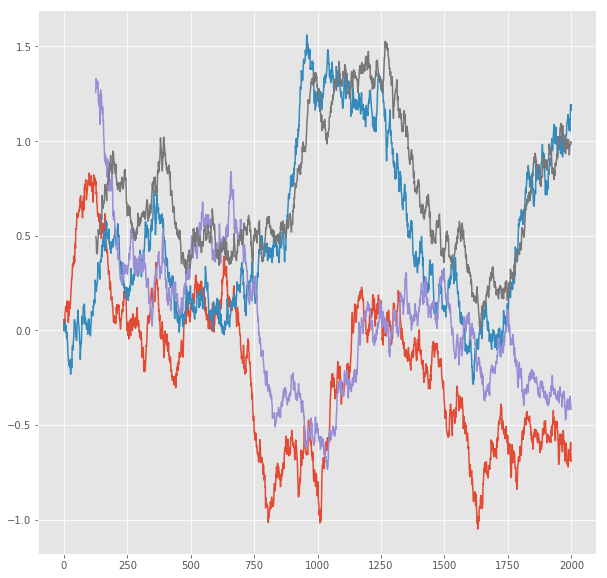

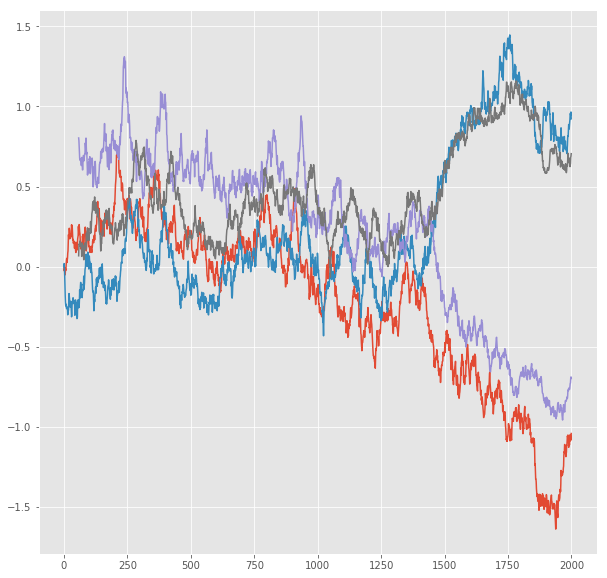

R^2 score for regression on Error: 0.4513
k = 0.9148


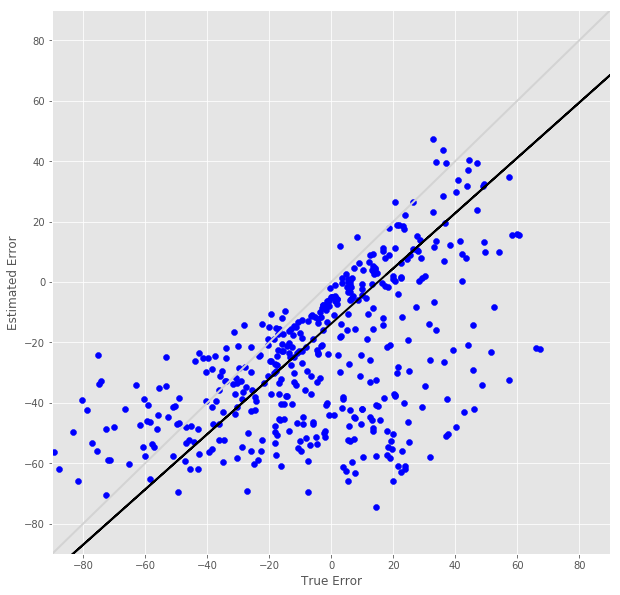

R^2 score for regression on RT: 0.0005
k = 0.0321


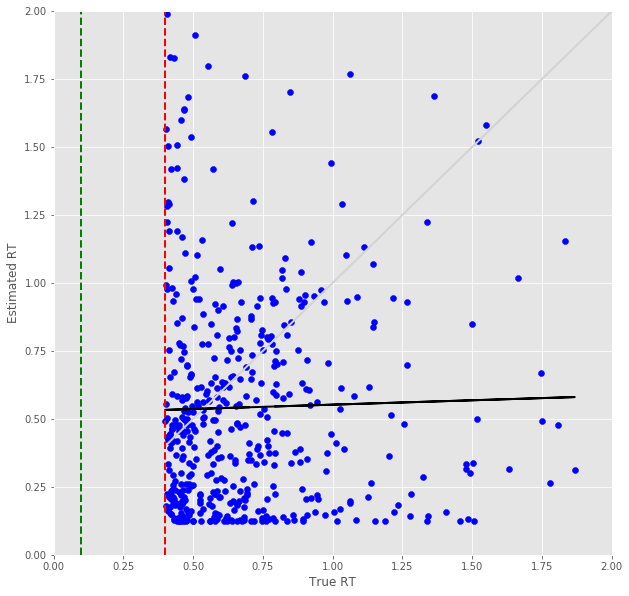

Error Prediction Score: 0.5454 RMSE
RT Prediction Score: 0.4772 RMSE
Error Prediction Corr: 0.7911
RT Prediction Corr: 0.0623
R^2 score for regression on Error: 0.6259
k = 1.0488


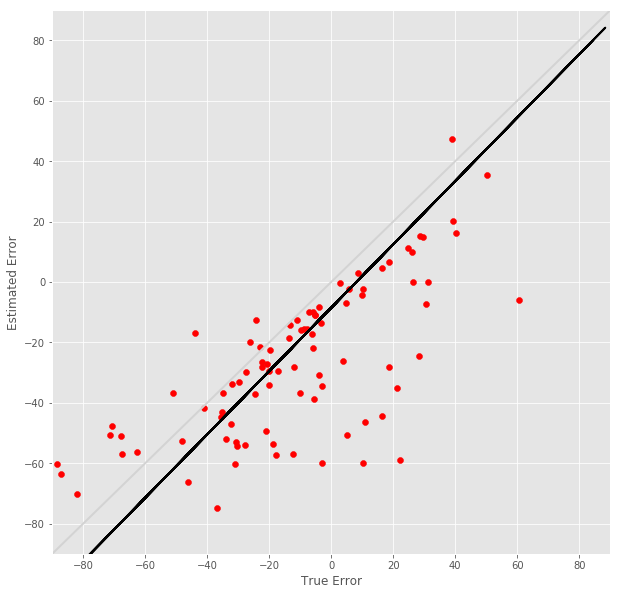

R^2 score for regression on RT: 0.0039
k = 0.0651


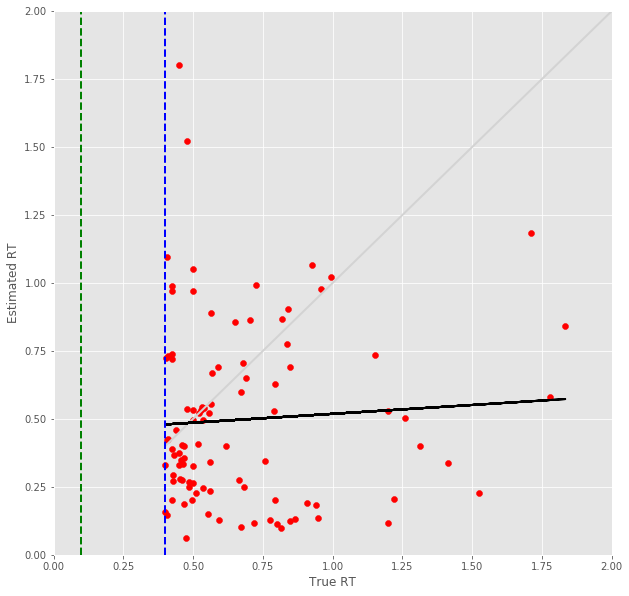

28 -step(s) forecast:
Test Score for 28 -steps forecast: 0.5527 RMSE
Predict Score for 28 -steps forecast: 0.5558 RMSE
Error Test Score for 28 -steps forecast: 0.6671 RMSE
RT Test Score for 28 -steps forecast: 0.5085 RMSE
Error Test Corr for 28 -steps forecast: 0.6723
RT Test Corr for 28 -steps forecast: 0.0164


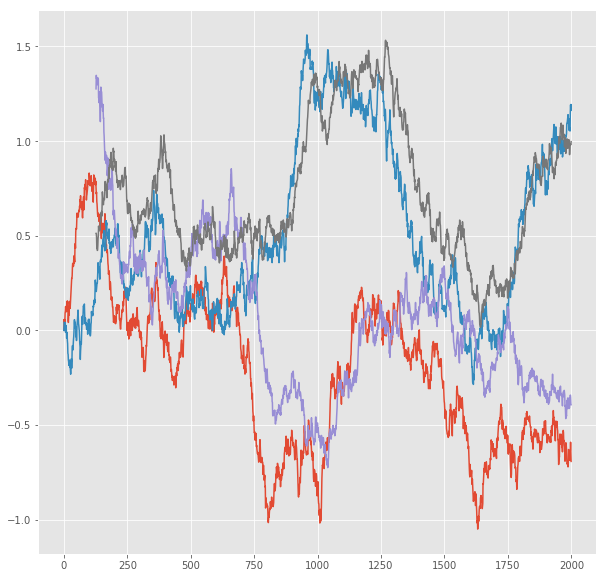

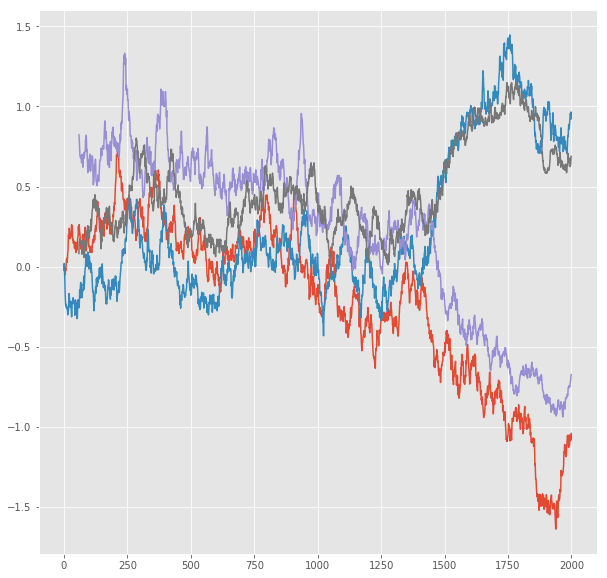

R^2 score for regression on Error: 0.4520
k = 0.9440


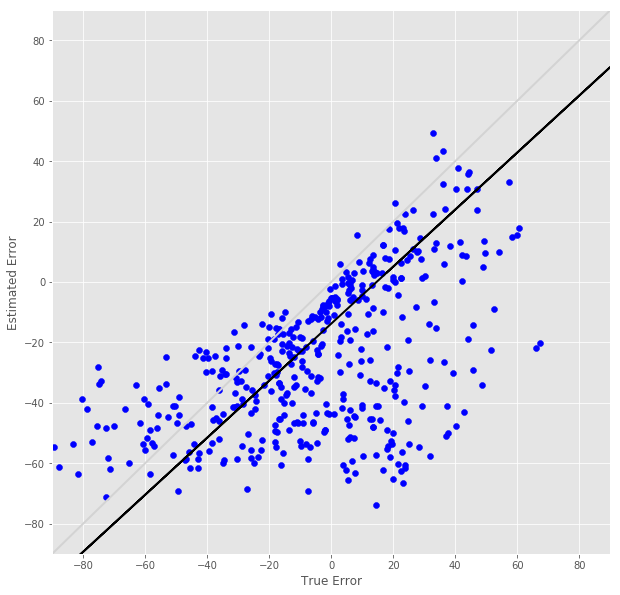

R^2 score for regression on RT: 0.0003
k = 0.0224


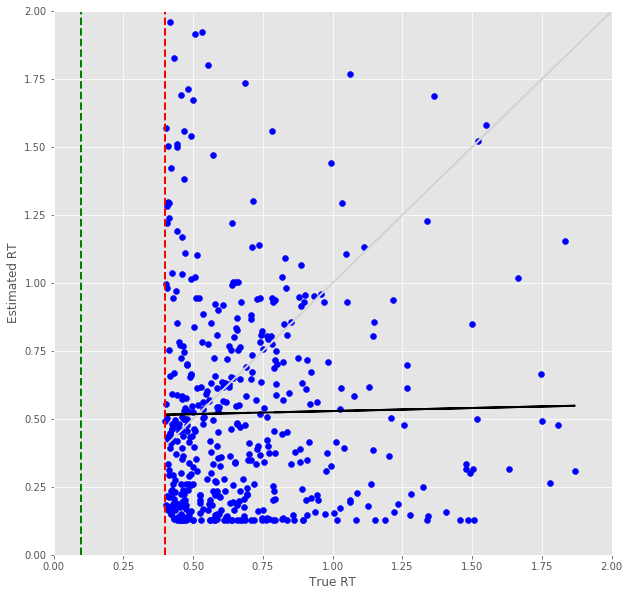

Error Prediction Score: 0.5817 RMSE
RT Prediction Score: 0.5242 RMSE
Error Prediction Corr: 0.7597
RT Prediction Corr: -0.0277
R^2 score for regression on Error: 0.5772
k = 1.0036


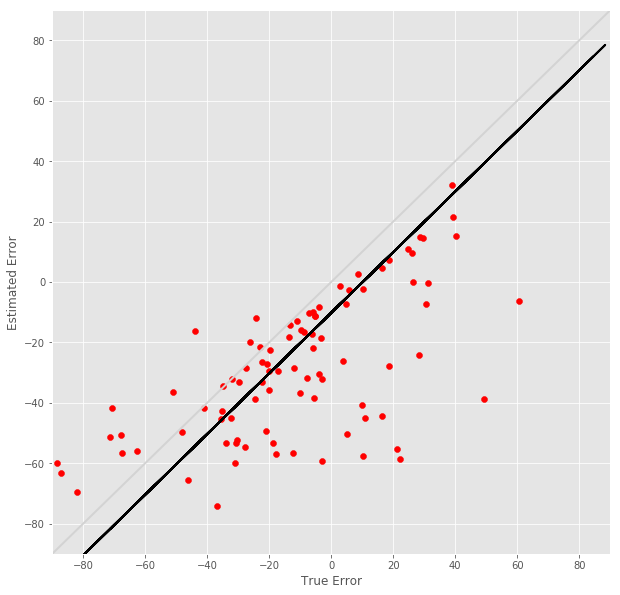

R^2 score for regression on RT: 0.0008
k = -0.0317


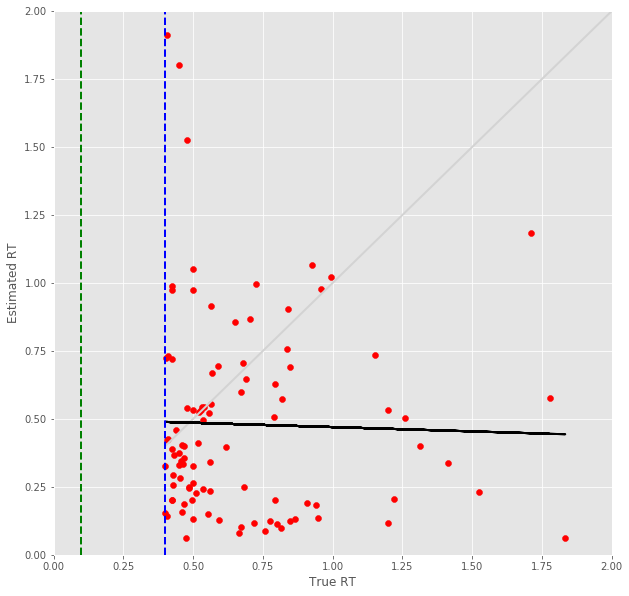

29 -step(s) forecast:
Test Score for 29 -steps forecast: 0.5667 RMSE
Predict Score for 29 -steps forecast: 0.5706 RMSE
Error Test Score for 29 -steps forecast: 0.6805 RMSE
RT Test Score for 29 -steps forecast: 0.5154 RMSE
Error Test Corr for 29 -steps forecast: 0.6698
RT Test Corr for 29 -steps forecast: 0.0192


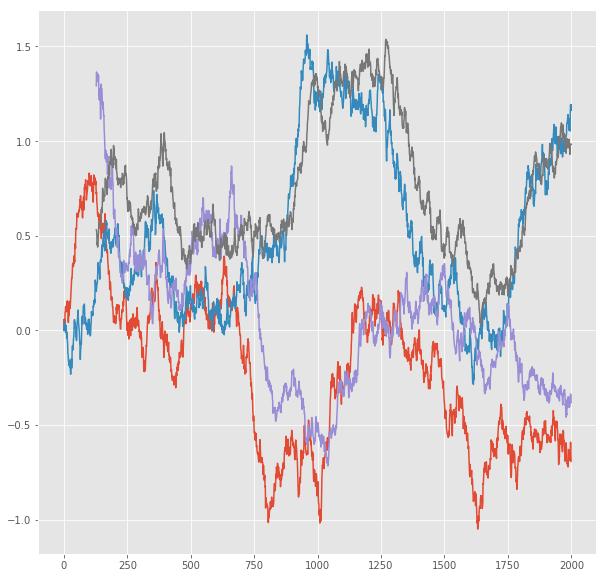

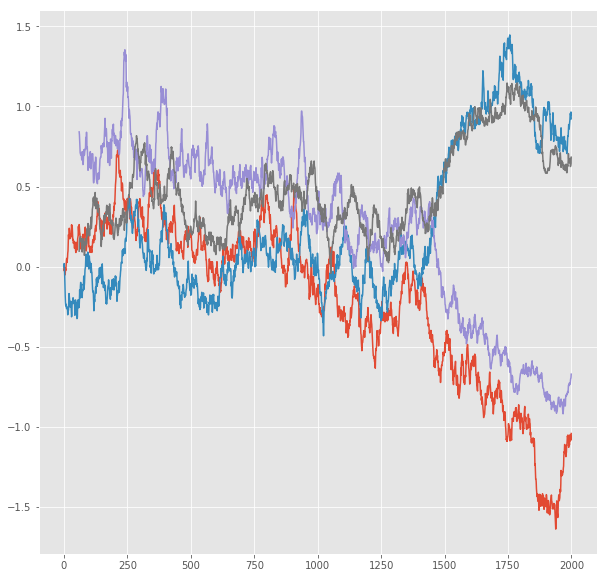

R^2 score for regression on Error: 0.4487
k = 0.9523


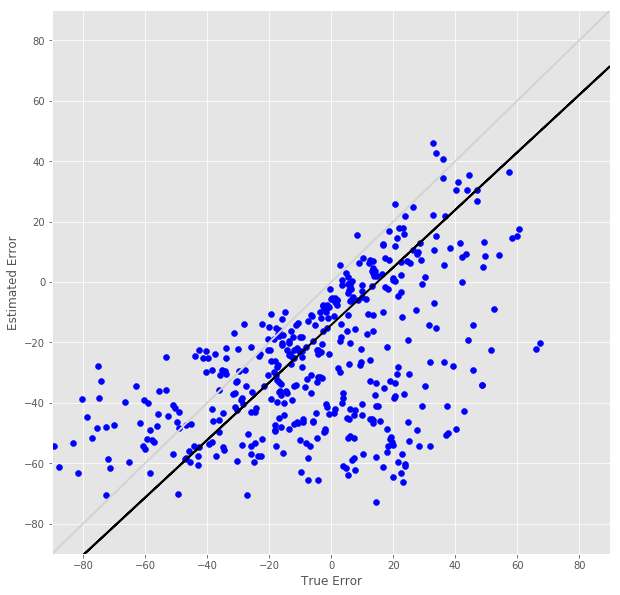

R^2 score for regression on RT: 0.0004
k = 0.0268


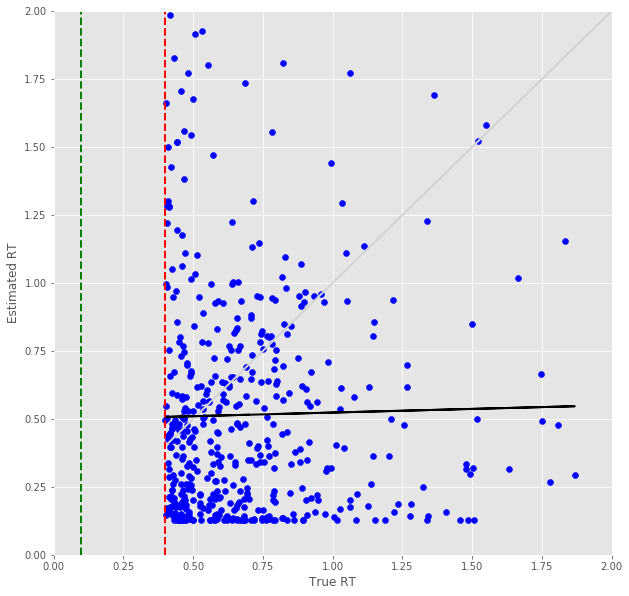

Error Prediction Score: 0.5864 RMSE
RT Prediction Score: 0.5299 RMSE
Error Prediction Corr: 0.7599
RT Prediction Corr: -0.0322
R^2 score for regression on Error: 0.5775
k = 1.0166


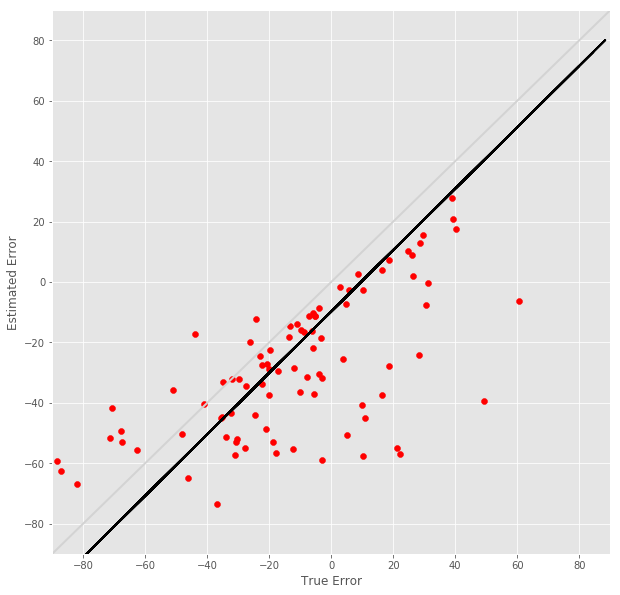

R^2 score for regression on RT: 0.0010
k = -0.0371


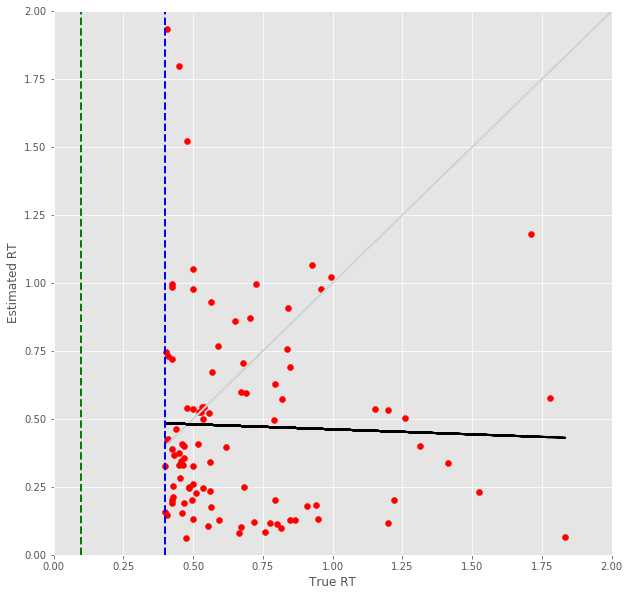

30 -step(s) forecast:
Test Score for 30 -steps forecast: 0.5804 RMSE
Predict Score for 30 -steps forecast: 0.5852 RMSE
Error Test Score for 30 -steps forecast: 0.6856 RMSE
RT Test Score for 30 -steps forecast: 0.5198 RMSE
Error Test Corr for 30 -steps forecast: 0.6628
RT Test Corr for 30 -steps forecast: 0.0097


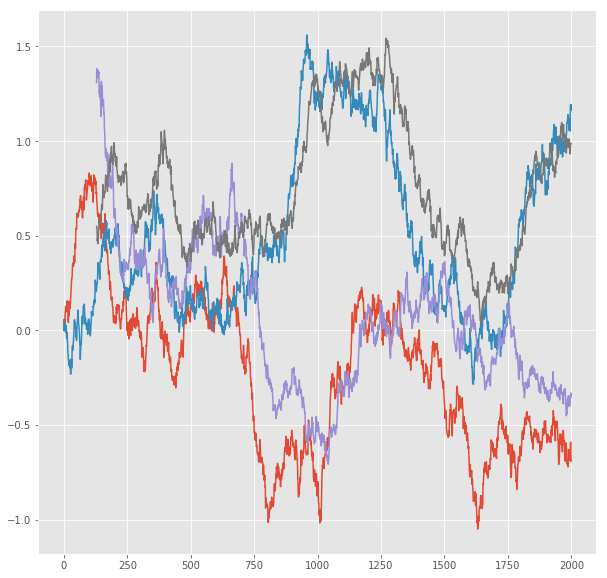

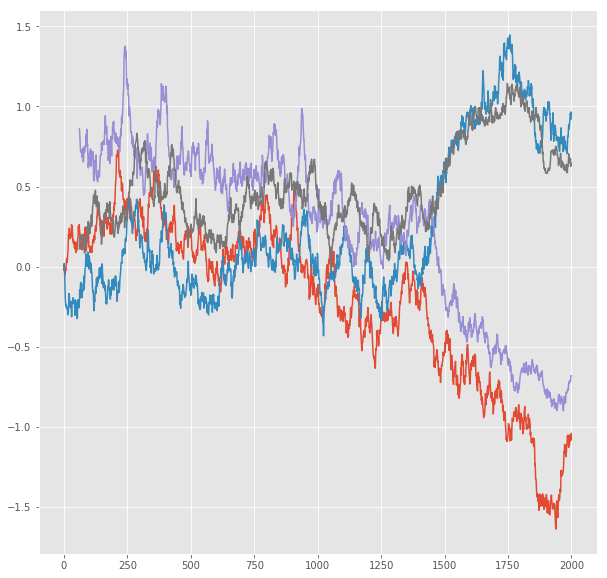

R^2 score for regression on Error: 0.4394
k = 0.9321


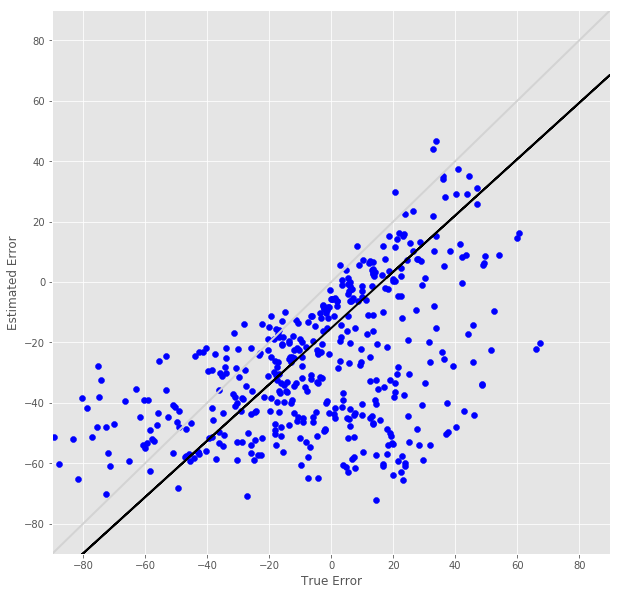

R^2 score for regression on RT: 0.0001
k = 0.0134


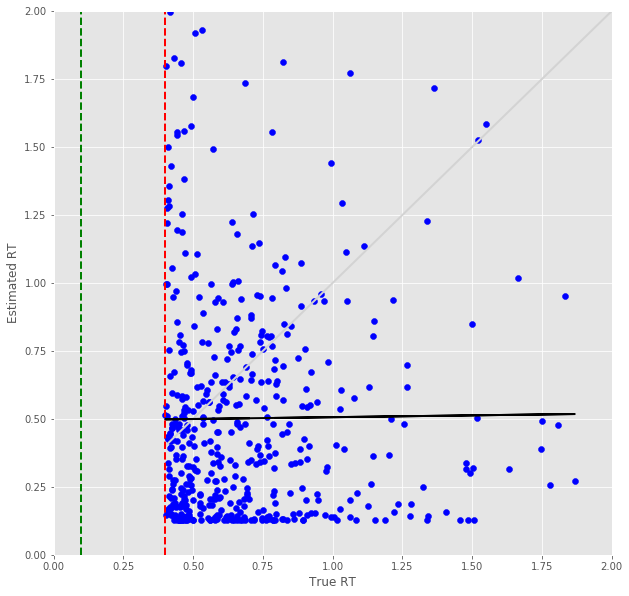

Error Prediction Score: 0.6036 RMSE
RT Prediction Score: 0.5394 RMSE
Error Prediction Corr: 0.7480
RT Prediction Corr: -0.0347
R^2 score for regression on Error: 0.5596
k = 1.0113


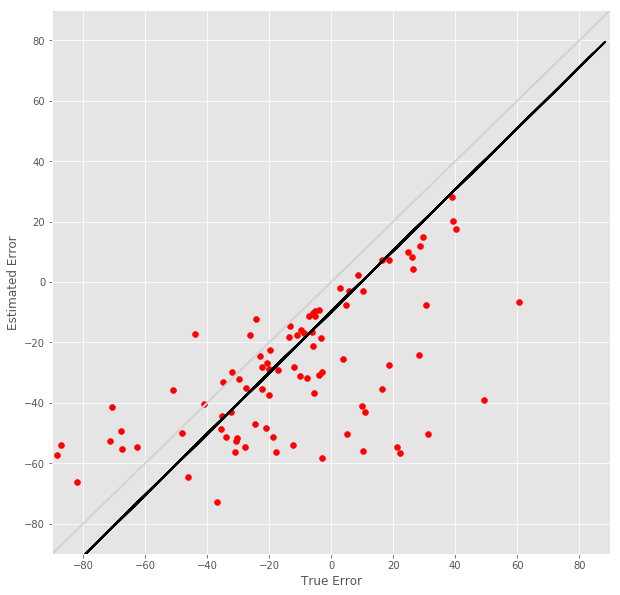

R^2 score for regression on RT: 0.0012
k = -0.0404


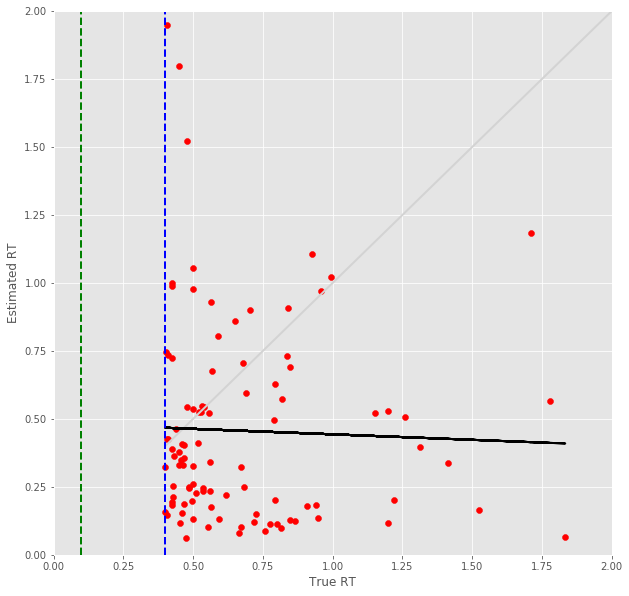

31 -step(s) forecast:
Test Score for 31 -steps forecast: 0.5940 RMSE
Predict Score for 31 -steps forecast: 0.5997 RMSE
Error Test Score for 31 -steps forecast: 0.6946 RMSE
RT Test Score for 31 -steps forecast: 0.5217 RMSE
Error Test Corr for 31 -steps forecast: 0.6544
RT Test Corr for 31 -steps forecast: 0.0136


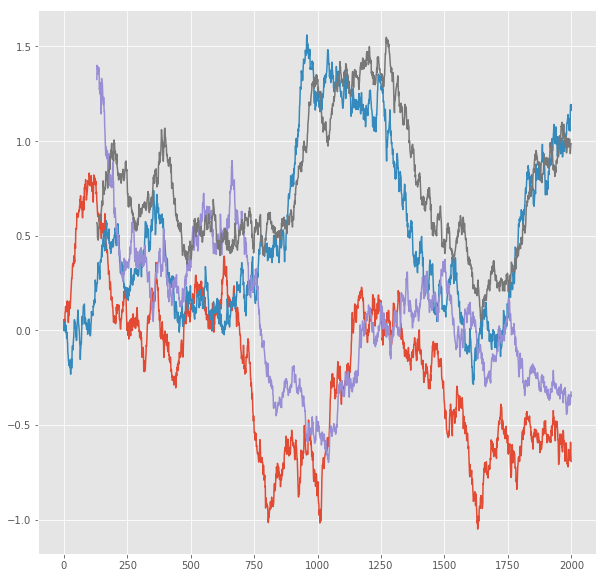

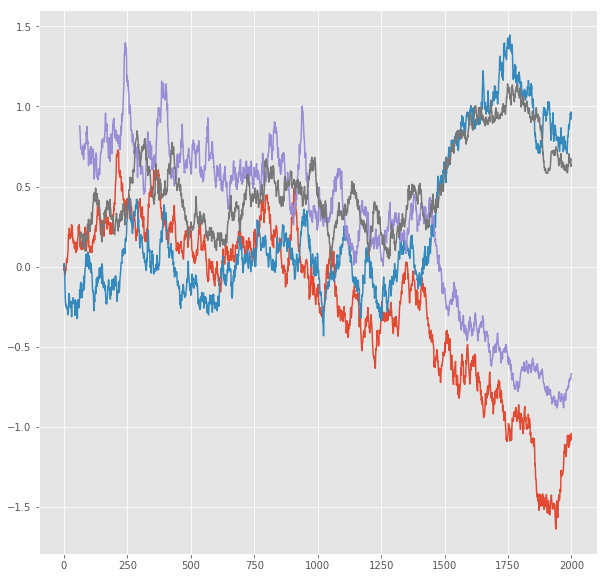

R^2 score for regression on Error: 0.4282
k = 0.9149


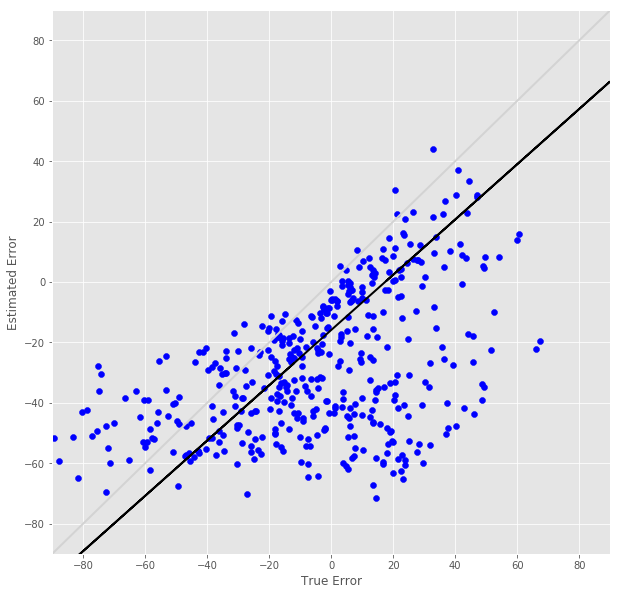

R^2 score for regression on RT: 0.0002
k = 0.0186


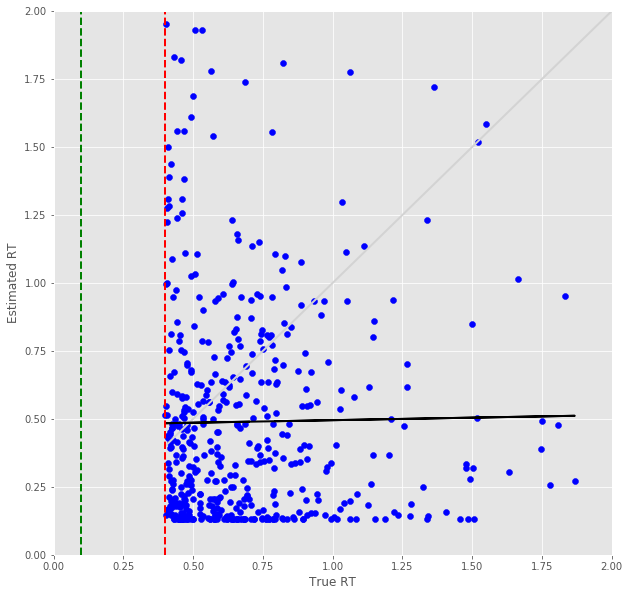

Error Prediction Score: 0.6125 RMSE
RT Prediction Score: 0.5231 RMSE
Error Prediction Corr: 0.7480
RT Prediction Corr: 0.0034
R^2 score for regression on Error: 0.5594
k = 1.0255


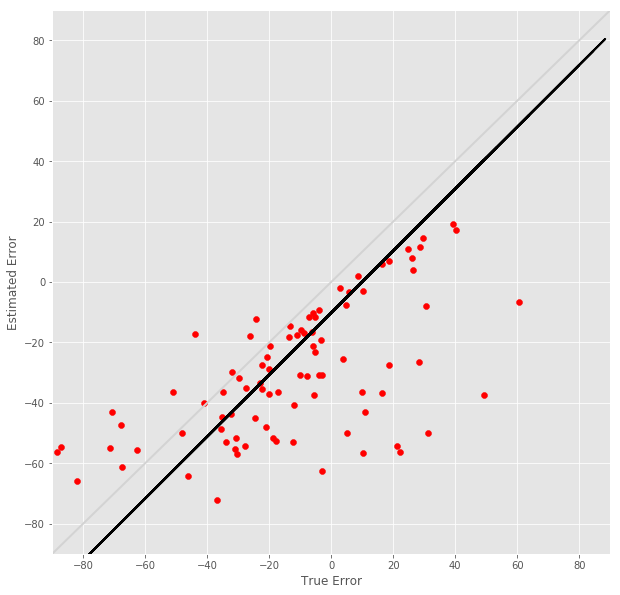

R^2 score for regression on RT: 0.0000
k = 0.0036


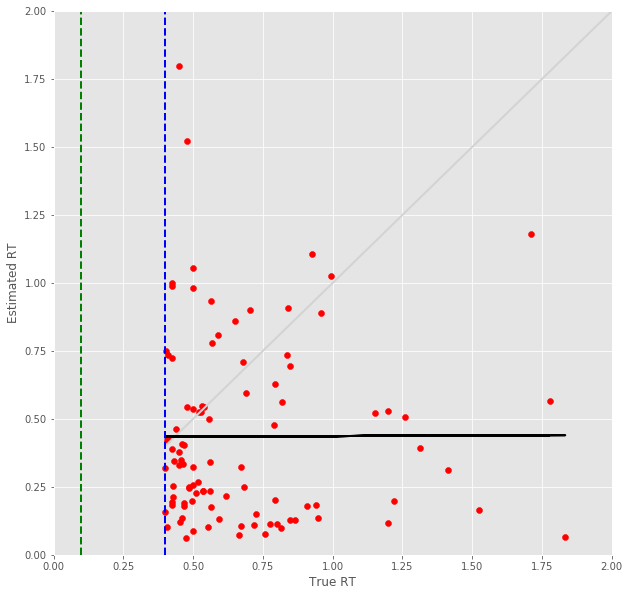

32 -step(s) forecast:
Test Score for 32 -steps forecast: 0.6075 RMSE
Predict Score for 32 -steps forecast: 0.6141 RMSE
Error Test Score for 32 -steps forecast: 0.6991 RMSE
RT Test Score for 32 -steps forecast: 0.5257 RMSE
Error Test Corr for 32 -steps forecast: 0.6530
RT Test Corr for 32 -steps forecast: 0.0011


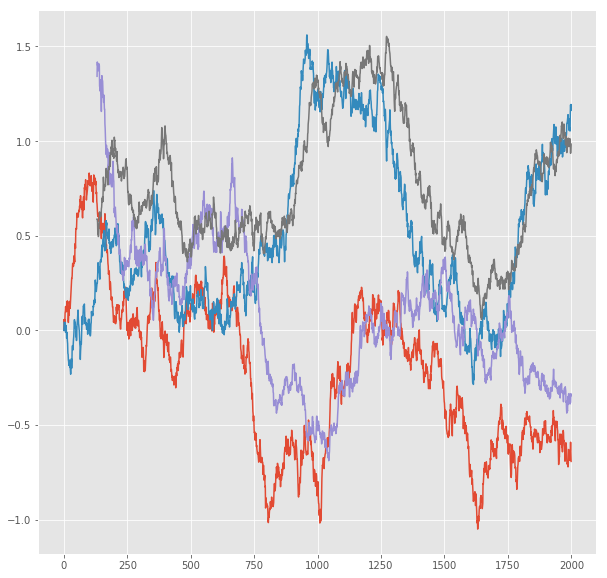

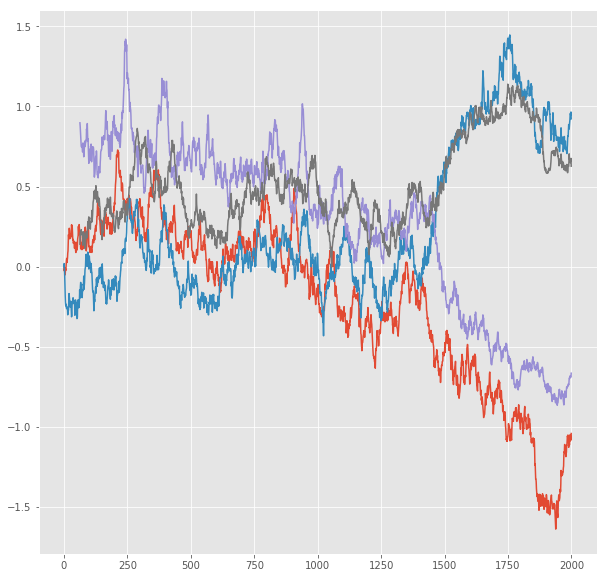

R^2 score for regression on Error: 0.4264
k = 0.9173


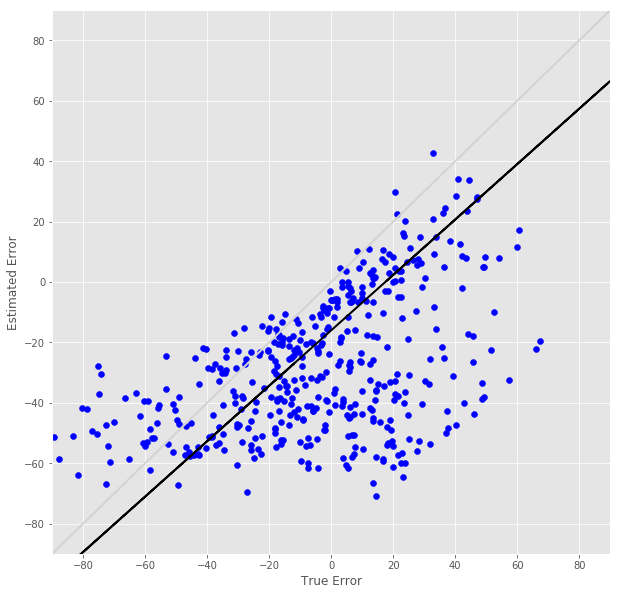

R^2 score for regression on RT: 0.0000
k = 0.0015


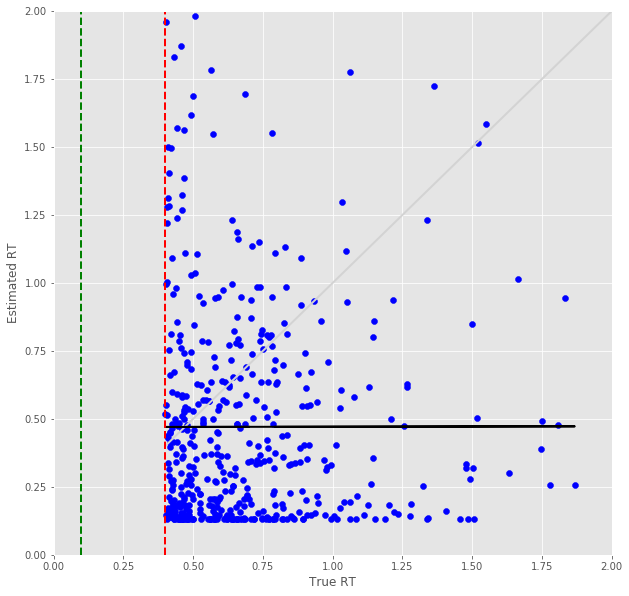

Error Prediction Score: 0.6387 RMSE
RT Prediction Score: 0.5537 RMSE
Error Prediction Corr: 0.7301
RT Prediction Corr: -0.0285
R^2 score for regression on Error: 0.5331
k = 1.0082


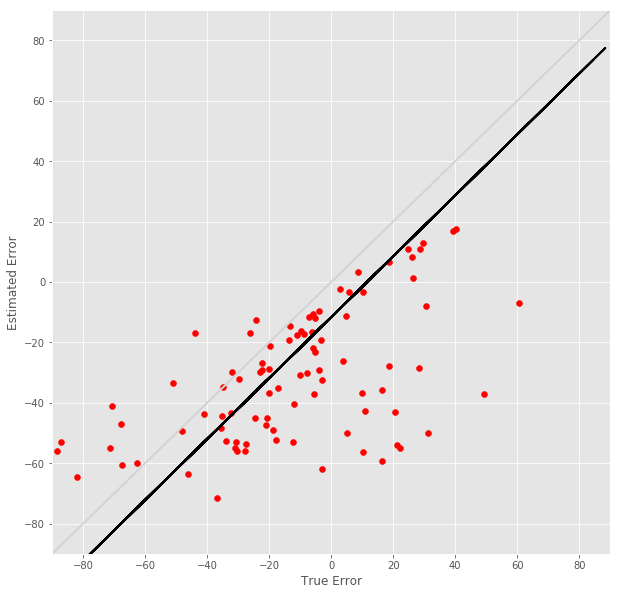

R^2 score for regression on RT: 0.0008
k = -0.0291


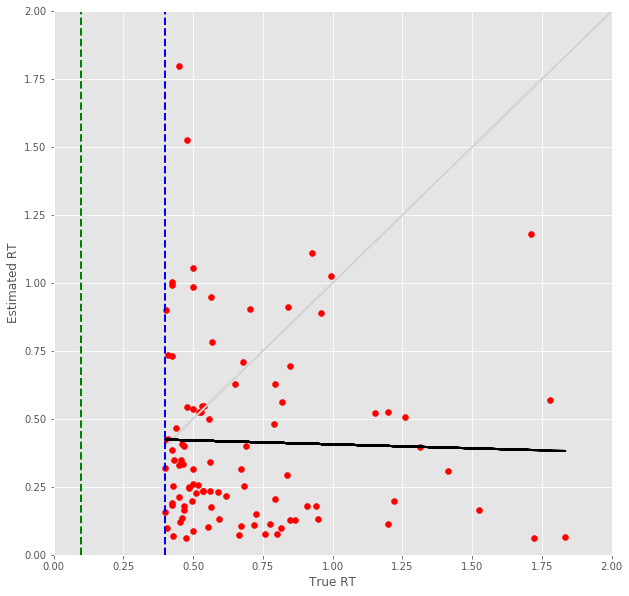

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

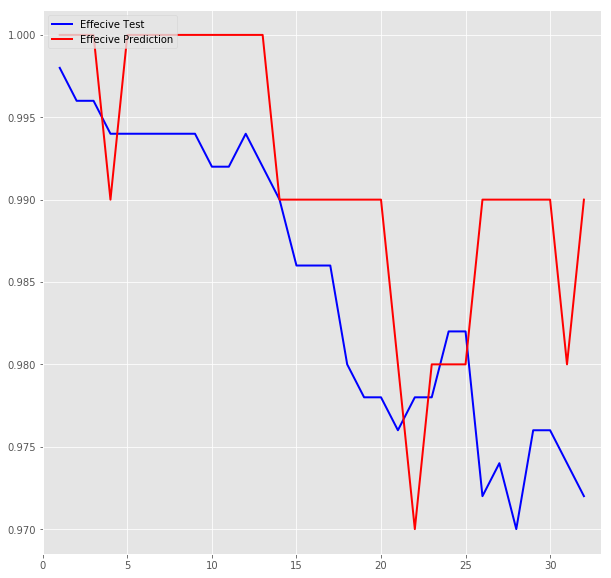

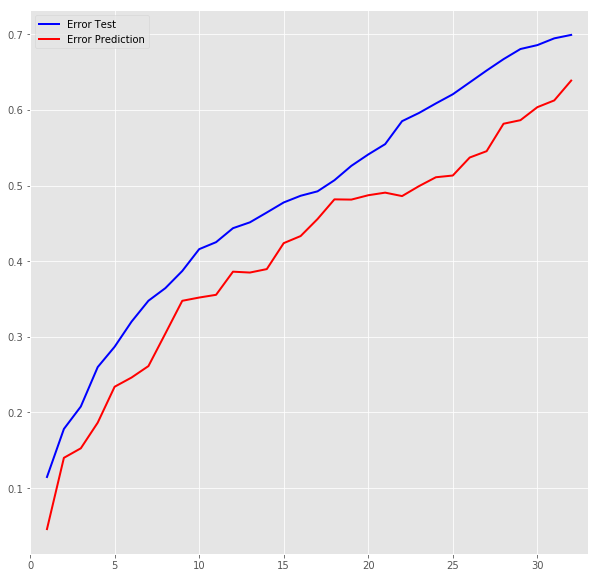

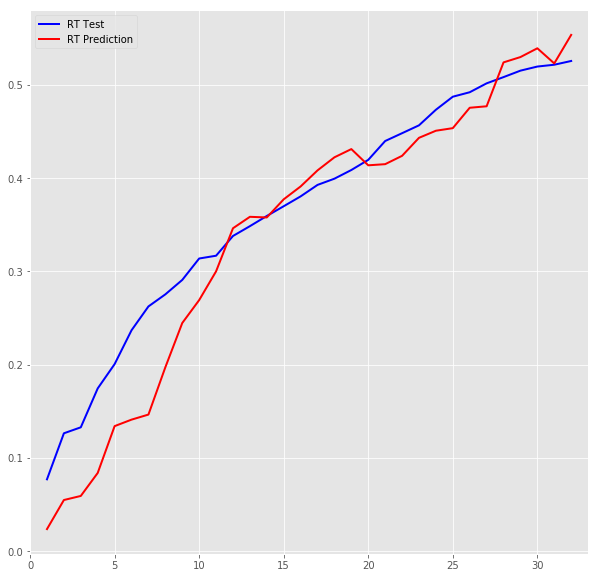

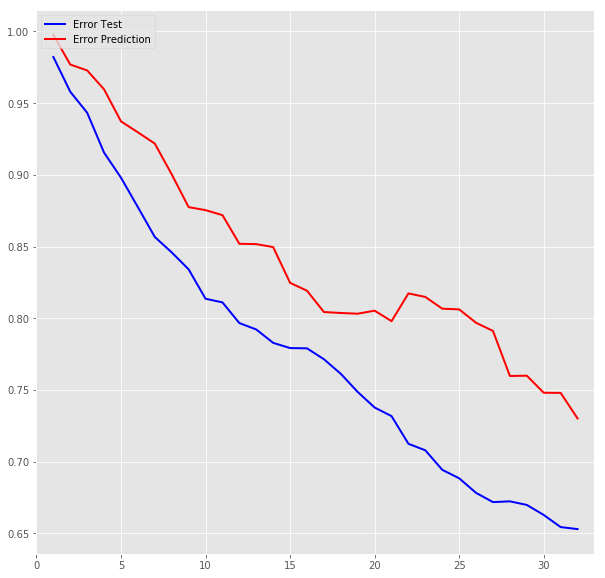

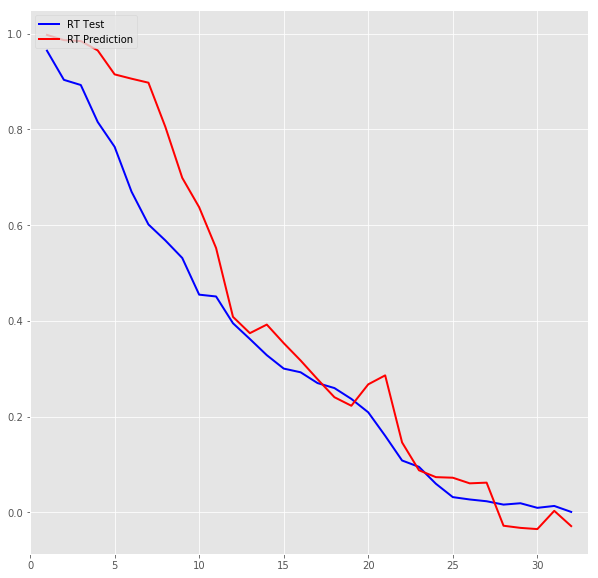

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
